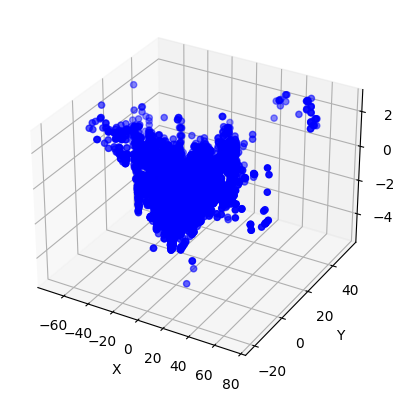

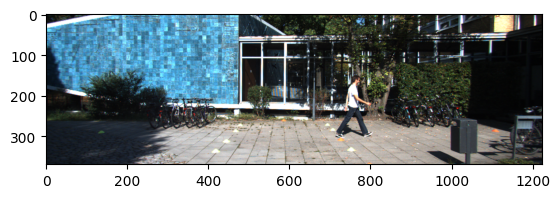

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import cv2
import os

DATASET_PATH = 'kitti_data'

# Load LiDAR data (point cloud)
def load_lidar_data(file_path):
    return np.fromfile(file_path, dtype=np.float32).reshape(-1, 4)

# Load camera image
def load_camera_image(file_path):
    return cv2.imread(file_path)

# Example paths for LiDAR and camera files
lidar_file = os.path.join(DATASET_PATH, 'data_object_velodyne/training/velodyne/000000.bin')
camera_file = os.path.join(DATASET_PATH, 'data_object_image_2/training/image_2/000000.png')

# Load data
lidar_data = load_lidar_data(lidar_file)
camera_image = load_camera_image(camera_file)

# Separate X, Y, Z coordinates from LiDAR data
X_lidar = lidar_data[:, 0]
Y_lidar = lidar_data[:, 1]
Z_lidar = lidar_data[:, 2]

# Visualize the LiDAR data
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_lidar, Y_lidar, Z_lidar, c='b', marker='o')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.show()

# Visualize the camera image
plt.imshow(cv2.cvtColor(camera_image, cv2.COLOR_BGR2RGB))
plt.show()


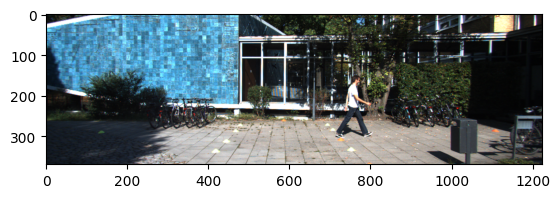

Plane equation: z = 0.008x + -0.010y + -0.969
Singular values of matrix A: [980.5013673  803.80393989 105.25010514]


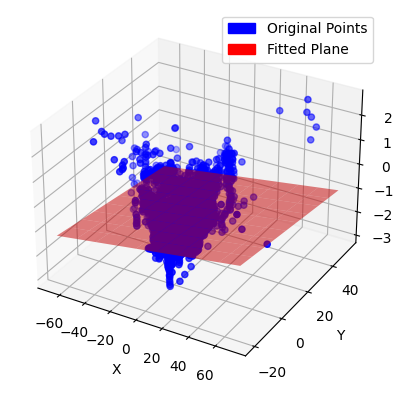

In [9]:
# Assuming intrinsic and extrinsic parameters are known
# Example intrinsic parameters of the camera (these need to be obtained from the dataset)
camera_intrinsic = np.array([[721.5377, 0, 609.5593],
                             [0, 721.5377, 172.854],
                             [0, 0, 1]])

# Example extrinsic parameters (rotation and translation, these also need to be obtained from the dataset)
R = np.eye(3)
T = np.array([0, 0, 0])

# def project_lidar_to_camera(X, Y, Z, R, T, intrinsic):
#     points_3d = np.vstack((X, Y, Z, np.ones_like(X)))
#     points_camera = intrinsic @ (R @ points_3d[:3, :] + T[:, None])
#     points_camera /= points_camera[2, :]
#     return points_camera[:2, :]

# # Project LiDAR points to camera
# points_camera = project_lidar_to_camera(X_lidar, Y_lidar, Z_lidar, R, T, camera_intrinsic)
# X_camera, Y_camera = points_camera

# # Visualize projected points on camera image
# for i in range(points_camera.shape[1]):
#     x, y = points_camera[:, i]
#     cv2.circle(camera_image, (int(x), int(y)), 2, (0, 255, 0), -1)

# plt.imshow(cv2.cvtColor(camera_image, cv2.COLOR_BGR2RGB))
# plt.show()


def project_lidar_to_camera(X, Y, Z, R, T, intrinsic):
    points_3d = np.vstack((X, Y, Z, np.ones_like(X)))
    points_camera = intrinsic @ (R @ points_3d[:3, :] + T[:, None])
    # Avoid division by zero
    valid_indices = points_camera[2, :] != 0
    points_camera = points_camera[:, valid_indices]
    points_camera /= points_camera[2, :]
    return points_camera[:2, :]

# Project LiDAR points to camera
points_camera = project_lidar_to_camera(X_lidar, Y_lidar, Z_lidar, R, T, camera_intrinsic)
X_camera, Y_camera = points_camera

# Visualize projected points on camera image
for x, y in zip(X_camera, Y_camera):
    cv2.circle(camera_image, (int(x), int(y)), 2, (0, 255, 0), -1)

plt.imshow(cv2.cvtColor(camera_image, cv2.COLOR_BGR2RGB))
plt.show()


# # Project LiDAR points to camera
# points_camera = project_lidar_to_camera(X_lidar, Y_lidar, Z_lidar, R, T, camera_intrinsic)
# X_camera, Y_camera = points_camera

# # Filter out points that result in infinite values
# valid_indices = np.isfinite(X_camera) & np.isfinite(Y_camera)

# # Only keep valid points
# X_camera = X_camera[valid_indices]
# Y_camera = Y_camera[valid_indices]

# # Visualize projected points on camera image
# for x, y in zip(X_camera, Y_camera):
#     cv2.circle(camera_image, (int(x), int(y)), 2, (0, 255, 0), -1)

# plt.imshow(cv2.cvtColor(camera_image, cv2.COLOR_BGR2RGB))
# plt.show()


# Downsample LiDAR data
downsample_factor = 10  # Adjust this factor based on your memory capacity
X_lidar_downsampled = X_lidar[::downsample_factor]
Y_lidar_downsampled = Y_lidar[::downsample_factor]
Z_lidar_downsampled = Z_lidar[::downsample_factor]

# Construct the matrix A and vector b for the least squares problem
A = np.c_[X_lidar_downsampled, Y_lidar_downsampled, np.ones(len(X_lidar_downsampled))]
b = Z_lidar_downsampled

# Solve the least squares problem to find the best-fit plane
coefficients, residuals, rank, s = np.linalg.lstsq(A, b, rcond=None)
a, b, c = coefficients
print(f"Plane equation: z = {a:.3f}x + {b:.3f}y + {c:.3f}")

# Perform SVD on the matrix A
U, S, Vt = np.linalg.svd(A)
print("Singular values of matrix A:", S)

# Plot the original points and the fitted plane
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_lidar_downsampled, Y_lidar_downsampled, Z_lidar_downsampled, c='b', marker='o', label='Original Points')

# Create a mesh grid for plotting the plane
X_grid, Y_grid = np.meshgrid(np.linspace(np.min(X_lidar_downsampled), np.max(X_lidar_downsampled), 10), 
                             np.linspace(np.min(Y_lidar_downsampled), np.max(Y_lidar_downsampled), 10))
Z_grid = a * X_grid + b * Y_grid + c

# Plot the fitted plane
plane = ax.plot_surface(X_grid, Y_grid, Z_grid, color='r', alpha=0.5)

# Manually add legend
from matplotlib.patches import Patch
blue_patch = Patch(color='blue', label='Original Points')
red_patch = Patch(color='red', label='Fitted Plane')
ax.legend(handles=[blue_patch, red_patch])

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()



# # Construct the matrix A and vector b for the least squares problem
# A = np.c_[X_lidar, Y_lidar, np.ones(len(X_lidar))]
# b = Z_lidar

# # Solve the least squares problem to find the best-fit plane
# coefficients, residuals, rank, s = np.linalg.lstsq(A, b, rcond=None)
# a, b, c = coefficients
# print(f"Plane equation: z = {a:.3f}x + {b:.3f}y + {c:.3f}")

# # Perform SVD on the matrix A
# U, S, Vt = np.linalg.svd(A)
# print("Singular values of matrix A:", S)

# # Plot the original points and the fitted plane
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(X_lidar, Y_lidar, Z_lidar, c='b', marker='o', label='Original Points')

# # Create a mesh grid for plotting the plane
# X_grid, Y_grid = np.meshgrid(np.linspace(np.min(X_lidar), np.max(X_lidar), 10), 
#                              np.linspace(np.min(Y_lidar), np.max(Y_lidar), 10))
# Z_grid = a * X_grid + b * Y_grid + c

# # Plot the fitted plane
# plane = ax.plot_surface(X_grid, Y_grid, Z_grid, color='r', alpha=0.5)

# # Manually add legend
# from matplotlib.patches import Patch
# blue_patch = Patch(color='blue', label='Original Points')
# red_patch = Patch(color='red', label='Fitted Plane')
# ax.legend(handles=[blue_patch, red_patch])

# ax.set_xlabel('X')
# ax.set_ylabel('Y')
# ax.set_zlabel('Z')

# plt.show()


Mean Squared Error: 0.8058594465255737
ML Model plane equation: z = 0.006x + -0.014y + -0.792


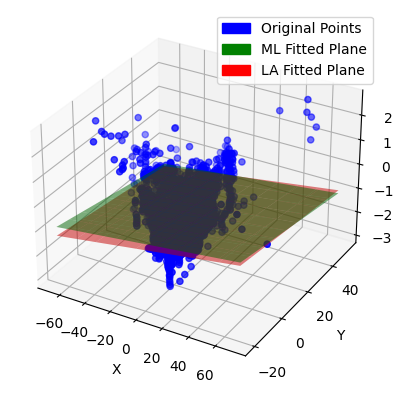

In [10]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Assuming you have the same dataset loaded
# X_lidar_downsampled, Y_lidar_downsampled, Z_lidar_downsampled

# Prepare the data
X = np.vstack((X_lidar_downsampled, Y_lidar_downsampled)).T
y = Z_lidar_downsampled

# Split the data into training and testing sets
split_ratio = 0.8
split_index = int(len(X) * split_ratio)
X_train, X_test = X[:split_index], X[split_index:]
y_train, y_test = y[:split_index], y[split_index:]

# Train a linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

# Get the model coefficients
a_ml, b_ml = model.coef_
c_ml = model.intercept_
print(f"ML Model plane equation: z = {a_ml:.3f}x + {b_ml:.3f}y + {c_ml:.3f}")

# Plot the original points and the fitted plane using ML model
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_lidar_downsampled, Y_lidar_downsampled, Z_lidar_downsampled, c='b', marker='o', label='Original Points')

# Create a mesh grid for plotting the plane
X_grid, Y_grid = np.meshgrid(np.linspace(np.min(X_lidar_downsampled), np.max(X_lidar_downsampled), 10), 
                             np.linspace(np.min(Y_lidar_downsampled), np.max(Y_lidar_downsampled), 10))
Z_grid_ml = a_ml * X_grid + b_ml * Y_grid + c_ml

# Plot the fitted plane using ML model
plane_ml = ax.plot_surface(X_grid, Y_grid, Z_grid_ml, color='g', alpha=0.5)

# Plot the fitted plane using linear algebra approach
Z_grid_la = a * X_grid + b * Y_grid + c
plane_la = ax.plot_surface(X_grid, Y_grid, Z_grid_la, color='r', alpha=0.5)

# Manually add legend
from matplotlib.patches import Patch
blue_patch = Patch(color='blue', label='Original Points')
green_patch = Patch(color='green', label='ML Fitted Plane')
red_patch = Patch(color='red', label='LA Fitted Plane')
ax.legend(handles=[blue_patch, green_patch, red_patch])

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.show()


In [11]:
import os
import numpy as np
import cv2
from sklearn.model_selection import train_test_split

# Load LiDAR data (point cloud)
def load_lidar_data(file_path):
    return np.fromfile(file_path, dtype=np.float32).reshape(-1, 4)

# Load camera image
def load_camera_image(file_path):
    return cv2.imread(file_path)

# Example paths for LiDAR and camera files
lidar_files = [os.path.join(DATASET_PATH, 'data_object_velodyne/training/velodyne/{:06d}.bin'.format(i)) for i in range(50)]
camera_files = [os.path.join(DATASET_PATH, 'data_object_image_2/training/image_2/{:06d}.png'.format(i)) for i in range(50)]

# Load data
lidar_data_list = [load_lidar_data(f) for f in lidar_files]
camera_images = [load_camera_image(f) for f in camera_files]

# Extract features from LiDAR and camera images
lidar_features = []
camera_features = []

for lidar_data, camera_image in zip(lidar_data_list, camera_images):
    # Extract features from LiDAR
    X_lidar = lidar_data[:, 0]
    Y_lidar = lidar_data[:, 1]
    Z_lidar = lidar_data[:, 2]
    intensity_lidar = lidar_data[:, 3]

    # Example LiDAR feature: height histogram
    height_hist, _ = np.histogram(Z_lidar, bins=10, range=(-1.5, 1.5))
    
    # Extract features from camera images
    gray_image = cv2.cvtColor(camera_image, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray_image, None)
    if descriptors is not None:
        camera_feature = np.mean(descriptors, axis=0)
    else:
        camera_feature = np.zeros(128)
    
    # Combine features
    lidar_features.append(height_hist)
    camera_features.append(camera_feature)

# Convert lists to numpy arrays
lidar_features = np.array(lidar_features)
camera_features = np.array(camera_features)

# Combine LiDAR and camera features
fused_features = np.hstack((lidar_features, camera_features))

# Example labels (randomly generated for demonstration)
labels = np.random.randint(0, 2, len(fused_features))

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(fused_features, labels, test_size=0.2, random_state=42)


In [12]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Train a logistic regression model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Predict on the test set
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print(f"Accuracy: {accuracy}")
print("Classification Report:\n", report)


Accuracy: 0.5
Classification Report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       0.71      0.62      0.67         8

    accuracy                           0.50        10
   macro avg       0.36      0.31      0.33        10
weighted avg       0.57      0.50      0.53        10



c:\Users\Hammad\Documents\Python_Envs\bert_trans_env\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [13]:
# Function to fit a plane using least squares and extract features
def linear_algebra_features(X_lidar, Y_lidar, Z_lidar):
    A = np.c_[X_lidar, Y_lidar, np.ones(len(X_lidar))]
    b = Z_lidar
    coefficients, residuals, rank, s = np.linalg.lstsq(A, b, rcond=None)
    a, b, c = coefficients
    U, S, Vt = np.linalg.svd(A)
    return np.hstack((coefficients, S))

# Extract additional features using linear algebra
la_features = []
for lidar_data in lidar_data_list:
    X_lidar = lidar_data[:, 0]
    Y_lidar = lidar_data[:, 1]
    Z_lidar = lidar_data[:, 2]
    la_feature = linear_algebra_features(X_lidar, Y_lidar, Z_lidar)
    la_features.append(la_feature)

# Convert list to numpy array
la_features = np.array(la_features)

# Combine with previous features
enhanced_features = np.hstack((fused_features, la_features))

# Split into training and testing sets
X_train_la, X_test_la, y_train_la, y_test_la = train_test_split(enhanced_features, labels, test_size=0.2, random_state=42)


MemoryError: Unable to allocate 99.2 GiB for an array with shape (115384, 115384) and data type float64

In [14]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
import cv2

# Downsample LiDAR data to reduce size
downsample_factor = 20  # Adjust based on memory capacity
lidar_data_list_downsampled = [data[::downsample_factor] for data in lidar_data_list]

# Extract LiDAR features (example: height histogram)
def extract_lidar_features(lidar_data):
    X_lidar = lidar_data[:, 0]
    Y_lidar = lidar_data[:, 1]
    Z_lidar = lidar_data[:, 2]
    height_hist, _ = np.histogram(Z_lidar, bins=10, range=(-1.5, 1.5))
    return height_hist

# Extract camera features (example: SIFT descriptors mean)
def extract_camera_features(camera_image):
    gray_image = cv2.cvtColor(camera_image, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray_image, None)
    if descriptors is not None:
        return np.mean(descriptors, axis=0)
    else:
        return np.zeros(128)

# Function to fit a plane using least squares and extract features
def linear_algebra_features(X_lidar, Y_lidar, Z_lidar):
    A = np.c_[X_lidar, Y_lidar, np.ones(len(X_lidar))]
    b = Z_lidar
    coefficients, residuals, rank, s = np.linalg.lstsq(A, b, rcond=None)
    U, S, Vt = np.linalg.svd(A)
    return np.hstack((coefficients, S[:3]))  # Use only the first three singular values

# Extract and combine features
lidar_features = []
camera_features = []
la_features = []

for lidar_data, camera_image in zip(lidar_data_list_downsampled, camera_images):
    # LiDAR features
    lidar_feat = extract_lidar_features(lidar_data)
    lidar_features.append(lidar_feat)
    
    # Camera features
    camera_feat = extract_camera_features(camera_image)
    camera_features.append(camera_feat)
    
    # Linear algebra features
    X_lidar = lidar_data[:, 0]
    Y_lidar = lidar_data[:, 1]
    Z_lidar = lidar_data[:, 2]
    la_feat = linear_algebra_features(X_lidar, Y_lidar, Z_lidar)
    la_features.append(la_feat)

# Convert lists to numpy arrays
lidar_features = np.array(lidar_features)
camera_features = np.array(camera_features)
la_features = np.array(la_features)

# Combine all features
fused_features = np.hstack((lidar_features, camera_features))
enhanced_features = np.hstack((fused_features, la_features))

# Example labels (randomly generated for demonstration)
labels = np.random.randint(0, 2, len(fused_features))

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(fused_features, labels, test_size=0.2, random_state=42)
X_train_la, X_test_la, y_train_la, y_test_la = train_test_split(enhanced_features, labels, test_size=0.2, random_state=42)

# Train and evaluate simple ML model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print(f"Accuracy without Linear Algebra Features: {accuracy}")
print("Classification Report without Linear Algebra Features:\n", report)

# Train and evaluate ML model with linear algebra features
model_la = LogisticRegression(max_iter=1000)
model_la.fit(X_train_la, y_train_la)
y_pred_la = model_la.predict(X_test_la)
accuracy_la = accuracy_score(y_test_la, y_pred_la)
report_la = classification_report(y_test_la, y_pred_la)
print(f"Accuracy with Linear Algebra Features: {accuracy_la}")
print("Classification Report with Linear Algebra Features:\n", report)


Accuracy without Linear Algebra Features: 0.3
Classification Report without Linear Algebra Features:
               precision    recall  f1-score   support

           0       0.25      0.20      0.22         5
           1       0.33      0.40      0.36         5

    accuracy                           0.30        10
   macro avg       0.29      0.30      0.29        10
weighted avg       0.29      0.30      0.29        10

Accuracy with Linear Algebra Features: 0.3
Classification Report with Linear Algebra Features:
               precision    recall  f1-score   support

           0       0.25      0.20      0.22         5
           1       0.33      0.40      0.36         5

    accuracy                           0.30        10
   macro avg       0.29      0.30      0.29        10
weighted avg       0.29      0.30      0.29        10



c:\Users\Hammad\Documents\Python_Envs\bert_trans_env\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\Hammad\Documents\Python_Envs\bert_trans_env\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable

In [16]:
import os
import numpy as np
import cv2
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Function to load labels from KITTI dataset
def load_labels(label_file):
    labels = []
    with open(label_file, 'r') as file:
        for line in file:
            parts = line.split()
            label = parts[0]  # The label is the first element (e.g., 'Car', 'Pedestrian')
            labels.append(label)
    return labels

# Load LiDAR data (point cloud)
def load_lidar_data(file_path):
    return np.fromfile(file_path, dtype=np.float32).reshape(-1, 4)

# Load camera image
def load_camera_image(file_path):
    return cv2.imread(file_path)

# Example paths for LiDAR, camera files, and labels
lidar_files = [os.path.join(DATASET_PATH, 'data_object_velodyne/training/velodyne/{:06d}.bin'.format(i)) for i in range(50)]
camera_files = [os.path.join(DATASET_PATH, 'data_object_image_2/training/image_2/{:06d}.png'.format(i)) for i in range(50)]
label_files = [os.path.join(DATASET_PATH, 'data_object_label_2/training/label_2/{:06d}.txt'.format(i)) for i in range(50)]


# Load data
lidar_data_list = [load_lidar_data(f) for f in lidar_files]
camera_images = [load_camera_image(f) for f in camera_files]
labels_list = [load_labels(f) for f in label_files]

# Simplify labels (binary classification: Car vs. Not Car)
binary_labels = [1 if 'Car' in labels else 0 for labels in labels_list]

# Downsample LiDAR data to reduce size
downsample_factor = 20  # Adjust based on memory capacity
lidar_data_list_downsampled = [data[::downsample_factor] for data in lidar_data_list]

# Extract LiDAR features (example: height histogram)
def extract_lidar_features(lidar_data):
    X_lidar = lidar_data[:, 0]
    Y_lidar = lidar_data[:, 1]
    Z_lidar = lidar_data[:, 2]
    height_hist, _ = np.histogram(Z_lidar, bins=10, range=(-1.5, 1.5))
    return height_hist

# Extract camera features (example: SIFT descriptors mean)
def extract_camera_features(camera_image):
    gray_image = cv2.cvtColor(camera_image, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray_image, None)
    if descriptors is not None:
        return np.mean(descriptors, axis=0)
    else:
        return np.zeros(128)

# Function to fit a plane using least squares and extract features
def linear_algebra_features(X_lidar, Y_lidar, Z_lidar):
    A = np.c_[X_lidar, Y_lidar, np.ones(len(X_lidar))]
    b = Z_lidar
    coefficients, residuals, rank, s = np.linalg.lstsq(A, b, rcond=None)
    U, S, Vt = np.linalg.svd(A)
    return np.hstack((coefficients, S[:3]))  # Use only the first three singular values

# Extract and combine features
lidar_features = []
camera_features = []
la_features = []

for lidar_data, camera_image in zip(lidar_data_list_downsampled, camera_images):
    # LiDAR features
    lidar_feat = extract_lidar_features(lidar_data)
    lidar_features.append(lidar_feat)
    
    # Camera features
    camera_feat = extract_camera_features(camera_image)
    camera_features.append(camera_feat)
    
    # Linear algebra features
    X_lidar = lidar_data[:, 0]
    Y_lidar = lidar_data[:, 1]
    Z_lidar = lidar_data[:, 2]
    la_feat = linear_algebra_features(X_lidar, Y_lidar, Z_lidar)
    la_features.append(la_feat)

# Convert lists to numpy arrays
lidar_features = np.array(lidar_features)
camera_features = np.array(camera_features)
la_features = np.array(la_features)

# Combine all features
fused_features = np.hstack((lidar_features, camera_features))
enhanced_features = np.hstack((fused_features, la_features))

# Use actual labels for binary classification
labels = np.array(binary_labels)

# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(fused_features, labels, test_size=0.2, random_state=42)
X_train_la, X_test_la, y_train_la, y_test_la = train_test_split(enhanced_features, labels, test_size=0.2, random_state=42)

# Train and evaluate simple ML model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print(f"Accuracy without Linear Algebra Features: {accuracy}")
print("Classification Report without Linear Algebra Features:\n", report)

# Train and evaluate ML model with linear algebra features
model_la = LogisticRegression(max_iter=1000)
model_la.fit(X_train_la, y_train_la)
y_pred_la = model_la.predict(X_test_la)
accuracy_la = accuracy_score(y_test_la, y_pred_la)
report_la = classification_report(y_test_la, y_pred_la)
print(f"Accuracy with Linear Algebra Features: {accuracy_la}")
print("Classification Report with Linear Algebra Features:\n", report)


Accuracy without Linear Algebra Features: 0.8
Classification Report without Linear Algebra Features:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.89      0.89      0.89         9

    accuracy                           0.80        10
   macro avg       0.44      0.44      0.44        10
weighted avg       0.80      0.80      0.80        10

Accuracy with Linear Algebra Features: 0.9
Classification Report with Linear Algebra Features:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.89      0.89      0.89         9

    accuracy                           0.80        10
   macro avg       0.44      0.44      0.44        10
weighted avg       0.80      0.80      0.80        10



c:\Users\Hammad\Documents\Python_Envs\bert_trans_env\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Hammad\Documents\Python_Envs\bert_trans_env\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Hammad\Documents\Python_Envs\bert_trans_env\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif

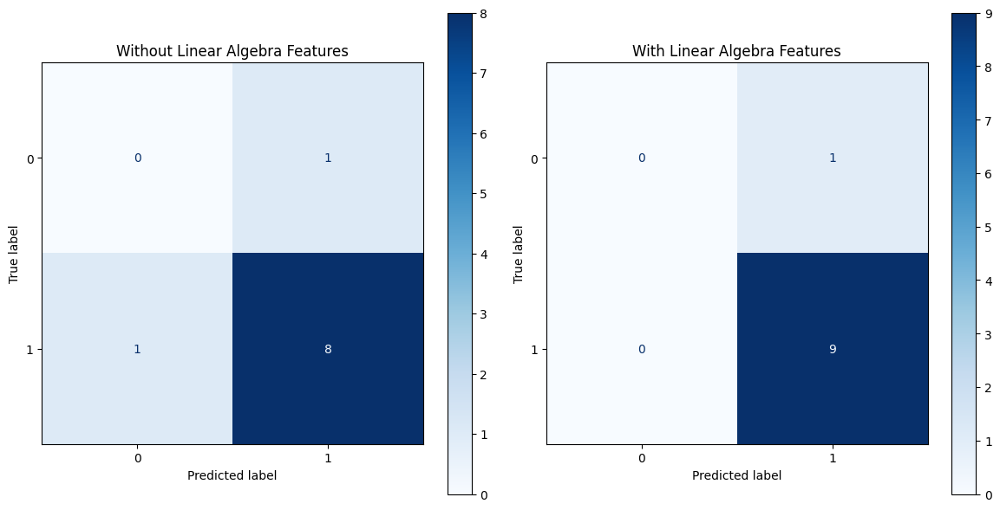

In [17]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay


# Plotting the results
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Confusion matrix for model without linear algebra features
ConfusionMatrixDisplay.from_estimator(model, X_test, y_test, ax=ax[0], cmap='Blues', values_format='d')
ax[0].set_title('Without Linear Algebra Features')

# Confusion matrix for model with linear algebra features
ConfusionMatrixDisplay.from_estimator(model_la, X_test_la, y_test_la, ax=ax[1], cmap='Blues', values_format='d')
ax[1].set_title('With Linear Algebra Features')

plt.tight_layout()
plt.show()


In [196]:
import numpy as np
import torch
from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
import torch.optim as optim
import cv2
import os
import matplotlib.pyplot as plt
from torch.utils.data import Subset

# Ensure proper conversion and processing
def resize_camera_image(image, target_size=(224, 224)):
    return cv2.resize(image, target_size)

def pad_lidar_data(lidar_data, target_length=2000):
    if len(lidar_data) < target_length:
        padding = np.zeros((target_length - len(lidar_data), lidar_data.shape[1]))
        return np.vstack((lidar_data, padding))
    else:
        return lidar_data[:target_length, :]

def process_labels(labels, max_labels=10):
    processed_labels = []
    for label in labels:
        if label[0] == 'Car':
            processed_labels.append(1)
        elif label[0] == 'Truck':
            processed_labels.append(2)
        else:
            processed_labels.append(0)
    # Pad labels to ensure they have the same length
    if len(processed_labels) < max_labels:
        processed_labels += [0] * (max_labels - len(processed_labels))
    return processed_labels[:max_labels]  # Truncate if necessary

def separate_classes(dataset):
    car_indices = []
    truck_indices = []
    none_indices = []
    
    for idx in range(len(dataset)):
        _, _, labels = dataset[idx]
        if 1 in labels:
            car_indices.append(idx)
        elif 2 in labels:
            truck_indices.append(idx)
        else:
            none_indices.append(idx)
    
    return car_indices, truck_indices, none_indices


def split_data(car_indices, truck_indices, none_indices, train_ratio=0.8):
    np.random.shuffle(car_indices)
    np.random.shuffle(truck_indices)
    np.random.shuffle(none_indices)
    
    train_size_car = int(train_ratio * len(car_indices))
    train_size_truck = int(train_ratio * len(truck_indices))
    train_size_none = int(train_ratio * len(none_indices))
    
    train_indices = (
        car_indices[:train_size_car] + 
        truck_indices[:train_size_truck] + 
        none_indices[:train_size_none]
    )
    test_indices = (
        car_indices[train_size_car:] + 
        truck_indices[train_size_truck:] + 
        none_indices[train_size_none:]
    )
    
    np.random.shuffle(train_indices)
    np.random.shuffle(test_indices)
    
    return train_indices, test_indices

def create_subsets(dataset, train_indices, test_indices):
    train_dataset = Subset(dataset, train_indices)
    test_dataset = Subset(dataset, test_indices)
    return train_dataset, test_dataset


class KittiDataset(Dataset):
    def __init__(self, lidar_files, camera_files, label_files, lidar_length=2000, img_size=(224, 224), max_labels=10):
        self.lidar_files = lidar_files
        self.camera_files = camera_files
        self.label_files = label_files
        self.lidar_length = lidar_length
        self.img_size = img_size
        self.max_labels = max_labels

    def __len__(self):
        return len(self.lidar_files)

    def __getitem__(self, idx):
        # Load LiDAR data
        lidar_data = np.fromfile(self.lidar_files[idx], dtype=np.float32).reshape(-1, 4)
        lidar_data = pad_lidar_data(lidar_data, self.lidar_length)
        
        # Load camera image
        camera_image = cv2.imread(self.camera_files[idx])
        camera_image = resize_camera_image(camera_image, self.img_size)
        camera_image = np.array(camera_image)
        
        # Debug statement to check shape
        # print(f"Original camera image shape: {camera_image.shape}")

        if camera_image.ndim == 3 and camera_image.shape[-1] == 3:  # Check if image is in (H, W, C)
            camera_image = camera_image.transpose(2, 0, 1)  # Convert to (C, H, W) format if needed

        # Debug statement to check shape after transpose
        # print(f"Transposed camera image shape: {camera_image.shape}")
        
        # Load labels
        with open(self.label_files[idx], 'r') as file:
            labels = [line.split() for line in file.readlines() if line.split()[0] in ['Car', 'Truck']]
        labels = process_labels(labels, self.max_labels)
        
        return torch.tensor(lidar_data), torch.tensor(camera_image), torch.tensor(labels)
    

# Paths
DATASET_PATH = 'kitti_data'
lidar_files = [os.path.join(DATASET_PATH, 'data_object_velodyne/training/velodyne/{:06d}.bin'.format(i)) for i in range(50)]
camera_files = [os.path.join(DATASET_PATH, 'data_object_image_2/training/image_2/{:06d}.png'.format(i)) for i in range(50)]
label_files = [os.path.join(DATASET_PATH, 'data_object_label_2/training/label_2/{:06d}.txt'.format(i)) for i in range(50)]

# Create dataset
dataset = KittiDataset(lidar_files, camera_files, label_files)

# Separate the dataset into Car, Truck, and None subsets
car_indices, truck_indices, none_indices = separate_classes(dataset)

# Split the data into train and test sets
train_indices, test_indices = split_data(car_indices, truck_indices, none_indices, train_ratio=0.8)

# Create train and test subsets
train_dataset, test_dataset = create_subsets(dataset, train_indices, test_indices)

# Create DataLoaders
train_dataloader = DataLoader(train_dataset, batch_size=4, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=4, shuffle=True)

# Print the distribution to verify
print(f"Total dataset size: {len(dataset)}")
print(f"Train dataset size: {len(train_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")

# Ensure both datasets contain instances of Car and Truck
print("Train dataset label distribution:")
found = False
for _, _, labels in train_dataset:
    for i in labels:
        if i == 2:
            found = True
            break
    if found:
        break

if found:
    print("Found a Truck label in Train Dataset")


print("Test dataset label distribution:")

found = False
for _, _, labels in test_dataset:
    for i in labels:
        if i == 2:
            found = True
            break
    if found:
        break

if found:
    print("Found a Truck label in Test Dataset")


Total dataset size: 50
Train dataset size: 40
Test dataset size: 10
Train dataset label distribution:
Found a Truck label in Train Dataset
Test dataset label distribution:
Found a Truck label in Test Dataset


In [197]:
print(len(train_dataset))
print(len(test_dataset))
print(len(train_dataloader))
print(len(test_dataloader))

40
10
10
3


In [198]:
# Iterate through the dataloader and print the contents
for i, (lidar_data, camera_image, labels) in enumerate(train_dataloader):
    print(f"Batch {i+1}")
    print("LiDAR Data:", lidar_data.shape)
    print("Camera Image:", camera_image.shape)
    print("Labels:", labels.shape)
    
    # Print only the first batch for inspection
    if i == 0:
        break

Batch 1
LiDAR Data: torch.Size([4, 2000, 4])
Camera Image: torch.Size([4, 3, 224, 224])
Labels: torch.Size([4, 10])


In [199]:
for i in range(0,len(train_dataset)):
    if len(train_dataset[i][2]) < 10:
        print(train_dataset[i][2])

    for j in train_dataset[i][2]:
        if j == 2: # Truck
            print(train_dataset[i][2])


print(i)

tensor([2, 1, 0, 0, 0, 0, 0, 0, 0, 0])
tensor([2, 1, 0, 0, 0, 0, 0, 0, 0, 0])
tensor([1, 2, 1, 1, 1, 0, 0, 0, 0, 0])
tensor([1, 2, 1, 0, 0, 0, 0, 0, 0, 0])
tensor([2, 1, 0, 0, 0, 0, 0, 0, 0, 0])
tensor([1, 1, 1, 2, 1, 0, 0, 0, 0, 0])
39


In [191]:
# Define model, training, and evaluation functions
class SimpleNet(nn.Module):
    def __init__(self, input_size):
        super(SimpleNet, self).__init__()
        self.fc1 = nn.Linear(input_size, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, 3)  # Output for multi-class classification (None, Car, Truck)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

def train_model(model, dataloader, criterion, optimizer, num_epochs=10):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        for i, (inputs, labels) in enumerate(dataloader):
            inputs = inputs.float()
            labels = labels.long()

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(dataloader):.4f}")

def evaluate_model(model, dataloader, criterion):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloader):
            inputs = inputs.float()
            labels = labels.long()

            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    print(f'Accuracy of the model on the test set: {accuracy:.2f}%')
    return accuracy

In [204]:
def extract_lidar_features(lidar_data):
    X_lidar = lidar_data[:, 0]
    Y_lidar = lidar_data[:, 1]
    Z_lidar = lidar_data[:, 2]
    height_hist, _ = np.histogram(Z_lidar, bins=10, range=(-1.5, 1.5))
    return height_hist

def extract_camera_features(camera_image):
    if camera_image.ndim == 3 and camera_image.shape[0] == 3:
        camera_image = camera_image.permute(1, 2, 0)  # Convert from (C, H, W) to (H, W, C) if needed
    
     # Convert the PyTorch tensor to a NumPy array
    camera_image_np = camera_image.numpy()

    # Debug statement to check shape before processing
    # print(f"Camera image shape in extract_camera_features: {camera_image_np.shape}")
    
    gray_image = cv2.cvtColor(camera_image_np, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray_image, None)
    if descriptors is not None:
        return np.mean(descriptors, axis=0)
    else:
        return np.zeros(128)


def linear_algebra_features(lidar_data):
    X_lidar = lidar_data[:, 0]
    Y_lidar = lidar_data[:, 1]
    Z_lidar = lidar_data[:, 2]
    A = np.c_[X_lidar, Y_lidar, np.ones(len(X_lidar))]
    b = Z_lidar
    coefficients, residuals, rank, s = np.linalg.lstsq(A, b, rcond=None)
    U, S, Vt = np.linalg.svd(A)
    return np.hstack((coefficients, S[:3]))  # Use only the first three singular values

def process_data(dataloader):
    fused_features_list = []
    enhanced_features_list = []
    labels_list = []

    for lidar_data, camera_image, labels in dataloader:
        for ld, ci, lb in zip(lidar_data, camera_image, labels):
            lidar_feat = extract_lidar_features(ld)
            # print(f"Camera image shape before feature extraction: {ci.shape}")  # Debug statement
            camera_feat = extract_camera_features(ci)
            # print(f"Camera features shape: {camera_feat.shape}")  # Debug statement
            la_feat = linear_algebra_features(ld)

            fused_features = np.hstack((lidar_feat, camera_feat))
            enhanced_features = np.hstack((fused_features, la_feat))

            # Repeat features for each label in the label tensor
            for label in lb.numpy():
                fused_features_list.append(fused_features)
                enhanced_features_list.append(enhanced_features)
                # Ensure correct label extraction for multi-class classification
                processed_label = 1 if label == 1 else 2 if label == 2 else 0
                labels_list.append(processed_label)

    fused_features_list = np.array(fused_features_list)
    enhanced_features_list = np.array(enhanced_features_list)
    labels_list = np.array(labels_list)

    return fused_features_list, enhanced_features_list, labels_list



# Process data
fused_train, enhanced_train, y_train = process_data(train_dataloader)
fused_test, enhanced_test, y_test = process_data(test_dataloader)

# Convert to PyTorch tensors
fused_train_tensor = torch.tensor(fused_train, dtype=torch.float32)
enhanced_train_tensor = torch.tensor(enhanced_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)

fused_test_tensor = torch.tensor(fused_test, dtype=torch.float32)
enhanced_test_tensor = torch.tensor(enhanced_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# Print shapes to verify
print(f"Fused train features shape: {fused_train_tensor.shape}")
print(f"Enhanced train features shape: {enhanced_train_tensor.shape}")
print(f"Train labels shape: {y_train_tensor.shape}")

print(f"Fused test features shape: {fused_test_tensor.shape}")
print(f"Enhanced test features shape: {enhanced_test_tensor.shape}")
print(f"Test labels shape: {y_test_tensor.shape}")

Fused train features shape: torch.Size([400, 138])
Enhanced train features shape: torch.Size([400, 144])
Train labels shape: torch.Size([400])
Fused test features shape: torch.Size([100, 138])
Enhanced test features shape: torch.Size([100, 144])
Test labels shape: torch.Size([100])


In [205]:
print(y_train)
# print(y_train_tensor)
print(len(y_train))
print(len(y_train_tensor))
print(y_test)
# print(y_test_tensor)
print(len(y_test))
print(len(y_test_tensor))

[1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 0 0 0 0 1 1 1 2
 1 0 0 0 0 0 2 1 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1
 1 1 1 1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 0 0
 0 0 1 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 1 1
 1 1 1 1 0 0 0 0 1 1 1 1 1 1 0 0 0 0 1 2 1 1 1 0 0 0 0 0 1 1 1 1 1 0 0 0 0
 0 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 1 2 1 0 0 0 0 0 0 0 2 1 0 0 0 0 0 0 0 0 1 1 1 1 1 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 0 0 1 0 0 0 0 0 0 0 0 0 2 1 0 0 0 0 0 0 0 0
 1 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0]
400
400
[0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 2 1 1 0
 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0

In [206]:
# Create TensorDatasets
train_dataset_fused = torch.utils.data.TensorDataset(fused_train_tensor, y_train_tensor)
train_dataset_enhanced = torch.utils.data.TensorDataset(enhanced_train_tensor, y_train_tensor)
test_dataset_fused = torch.utils.data.TensorDataset(fused_test_tensor, y_test_tensor)
test_dataset_enhanced = torch.utils.data.TensorDataset(enhanced_test_tensor, y_test_tensor)

# Create DataLoaders
train_dataloader_fused = DataLoader(train_dataset_fused, batch_size=4, shuffle=True)
train_dataloader_enhanced = DataLoader(train_dataset_enhanced, batch_size=4, shuffle=True)
test_dataloader_fused = DataLoader(test_dataset_fused, batch_size=4, shuffle=False)
test_dataloader_enhanced = DataLoader(test_dataset_enhanced, batch_size=4, shuffle=False)


In [207]:
print(len(train_dataloader_fused))
print(len(train_dataloader_enhanced))
print(len(test_dataloader_fused))
print(len(test_dataloader_enhanced))

100
100
25
25


In [215]:
# Iterate through the dataloader and print the contents
for i, (data, labels) in enumerate(train_dataloader_fused):
    print(f"Batch {i+1}: Train Dataloader Fused")
    print("Data:", data)
    print("Labels:", labels)
    
    # Print only the first batch for inspection
    if i == 0:
        break

# Iterate through the dataloader and print the contents
for i, (data, camera_image) in enumerate(train_dataloader_enhanced):
    print(f"Batch {i+1}: Train Dataloader Enhanced")
    print("LiDAR Data:", data.shape)
    print("Labels:", labels)
    
    # Print only the first batch for inspection
    if i == 0:
        break

# Iterate through the dataloader and print the contents
for i, (data, camera_image) in enumerate(test_dataloader_fused):
    print(f"Batch {i+1}: Test Dataloader Fused")
    print("Data:", data.shape)
    print("Labels:", labels)
    
    # Print only the first batch for inspection
    if i == 0:
        break

# Iterate through the dataloader and print the contents
for i, (data, camera_image) in enumerate(test_dataloader_enhanced):
    print(f"Batch {i+1}: Test Dataloader Enhanced")
    print("Data:", data.shape)
    print("Labels:", labels)
    
    # Print only the first batch for inspection
    if i == 0:
        break

Batch 1: Train Dataloader Fused
Data: tensor([[  0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000, 943.0000,
         564.0000, 312.0000,  91.0000,  23.6909,  20.6136,  17.7023,  20.5955,
          23.8659,  15.3909,  11.3841,  12.9023,  60.8409,  32.6705,  18.0705,
          17.1000,  19.7341,  15.6568,  15.0727,  25.9000,  67.1545,  27.4386,
          12.4614,  12.5682,  22.5750,  17.7273,  21.0795,  39.0841,  27.7205,
          16.4114,  10.4455,  14.1955,  28.2432,  21.0000,  21.8705,  25.9750,
          32.3386,  20.9318,  19.5182,  23.3136,  26.5455,  19.4045,  14.5182,
          18.1886,  88.5318,  33.0455,  21.8795,  22.7455,  28.2750,  21.9114,
          17.3432,  36.0364, 100.9000,  36.1818,  14.3886,  16.8455,  31.2977,
          23.9523,  23.2727,  44.3841,  35.0205,  17.7795,  14.1295,  24.1114,
          39.6682,  27.6750,  22.2886,  25.1614,  32.0909,  18.3295,  16.1023,
          19.4159,  26.0341,  21.2818,  20.6886,  23.1182,  88.0273,  34.3159,
          19.2

In [209]:
# Model without linear algebra features
input_size_without_la = fused_train.shape[1]
model_without_la = SimpleNet(input_size_without_la)
criterion = nn.CrossEntropyLoss()
optimizer_without_la = optim.Adam(model_without_la.parameters(), lr=0.001)

# Train and evaluate
print("Training model without linear algebra features...")
train_model(model_without_la, train_dataloader_fused, criterion, optimizer_without_la, num_epochs=10)
accuracy_without_la = evaluate_model(model_without_la, test_dataloader_fused, criterion)

# Model with linear algebra features
input_size_with_la = enhanced_train.shape[1]
model_with_la = SimpleNet(input_size_with_la)
optimizer_with_la = optim.Adam(model_with_la.parameters(), lr=0.001)

# Train and evaluate
print("Training model with linear algebra features...")
train_model(model_with_la, train_dataloader_enhanced, criterion, optimizer_with_la, num_epochs=10)
accuracy_with_la = evaluate_model(model_with_la, test_dataloader_enhanced, criterion)


Training model without linear algebra features...
Epoch [1/10], Loss: 4.0858
Epoch [2/10], Loss: 0.9448
Epoch [3/10], Loss: 1.0850
Epoch [4/10], Loss: 0.7827
Epoch [5/10], Loss: 0.7048
Epoch [6/10], Loss: 0.7071
Epoch [7/10], Loss: 0.6801
Epoch [8/10], Loss: 0.7038
Epoch [9/10], Loss: 0.6337
Epoch [10/10], Loss: 0.6489
Accuracy of the model on the test set: 57.00%
Training model with linear algebra features...
Epoch [1/10], Loss: 4.2592
Epoch [2/10], Loss: 1.2103
Epoch [3/10], Loss: 0.8985
Epoch [4/10], Loss: 0.7589
Epoch [5/10], Loss: 0.6666
Epoch [6/10], Loss: 0.6748
Epoch [7/10], Loss: 0.6220
Epoch [8/10], Loss: 0.7189
Epoch [9/10], Loss: 0.6641
Epoch [10/10], Loss: 0.6945
Accuracy of the model on the test set: 81.00%


Results without linear algebra features:


ValueError: not enough values to unpack (expected 3, got 2)

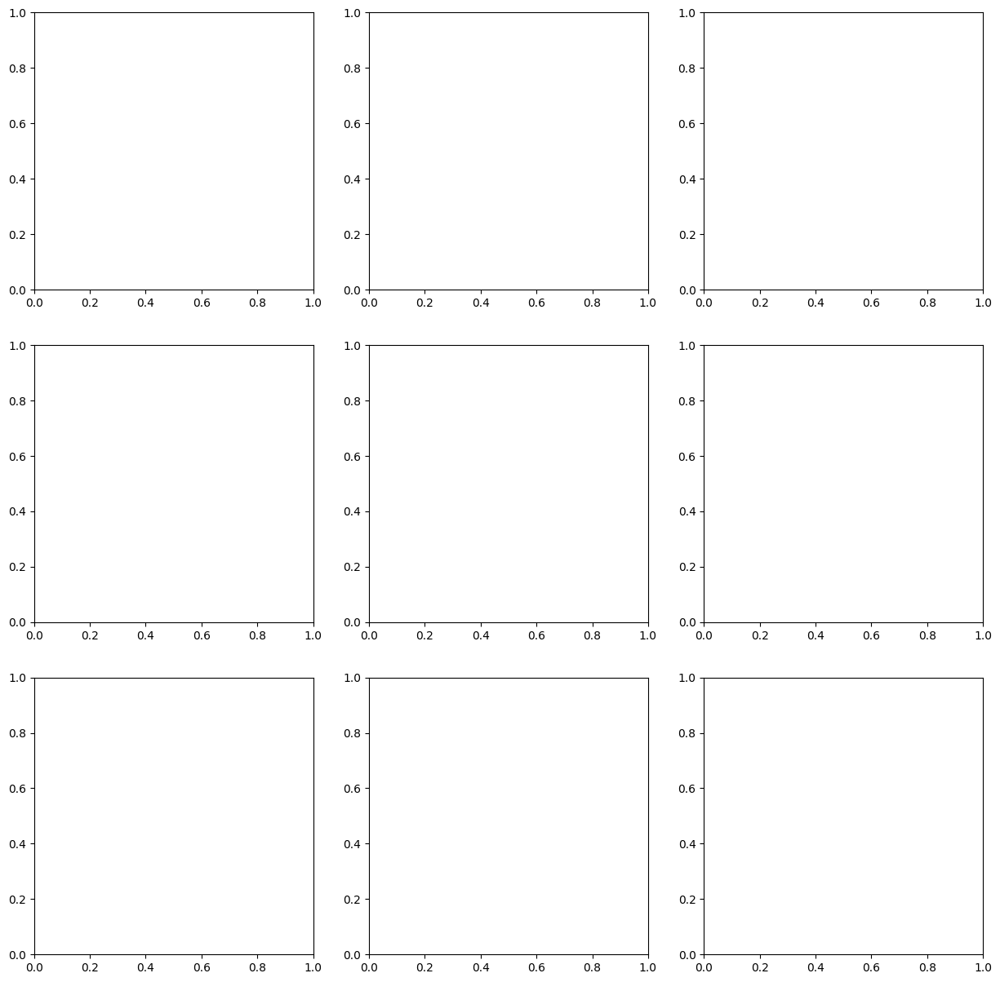

In [217]:
def plot_annotated_images(dataloader, model, num_images=3):
    model.eval()
    fig, axs = plt.subplots(num_images, 3, figsize=(15, 15))
    count = 0

    with torch.no_grad():
        for lidar_data, camera_images, labels in dataloader:
            if count >= num_images:
                break
            fused_inputs = torch.cat((lidar_data, camera_images.view(camera_images.size(0), -1)), dim=1).float()
            outputs = model(fused_inputs)
            _, predicted = torch.max(outputs.data, 1)
            
            for j in range(lidar_data.size(0)):
                if count >= num_images:
                    break
                
                camera_image = camera_images[j].permute(1, 2, 0).numpy().astype(np.uint8)

                axs[count, 0].imshow(cv2.cvtColor(camera_image, cv2.COLOR_BGR2RGB))
                axs[count, 0].set_title('Original Image')

                axs[count, 1].imshow(cv2.cvtColor(camera_image, cv2.COLOR_BGR2RGB))
                axs[count, 1].set_title(f'Prediction: {predicted[j].item()}')

                axs[count, 2].imshow(cv2.cvtColor(camera_image, cv2.COLOR_BGR2RGB))
                axs[count, 2].set_title(f'Ground Truth: {labels[j].item()}')

                count += 1

    plt.tight_layout()
    plt.show()

# Plot annotated images
print("Results without linear algebra features:")
plot_annotated_images(test_dataloader_fused, model_without_la, num_images=3)

print("Results with linear algebra features:")
plot_annotated_images(test_dataloader_enhanced, model_with_la, num_images=3)

In [219]:
import numpy as np
import torch
from torch.utils.data import DataLoader, Dataset, TensorDataset, random_split
import torch.nn as nn
import torch.optim as optim
import cv2
import os
import matplotlib.pyplot as plt

# Ensure proper conversion and processing
def resize_camera_image(image, target_size=(224, 224)):
    return cv2.resize(image, target_size)

def pad_lidar_data(lidar_data, target_length=2000):
    if len(lidar_data) < target_length:
        padding = np.zeros((target_length - len(lidar_data), lidar_data.shape[1]))
        return np.vstack((lidar_data, padding))
    else:
        return lidar_data[:target_length, :]

def process_labels(labels, max_labels=10):
    processed_labels = []
    for label in labels:
        if label[0] == 'Car':
            processed_labels.append(1)
        elif label[0] == 'Truck':
            processed_labels.append(2)
        else:
            processed_labels.append(0)
    # Pad labels to ensure they have the same length
    if len(processed_labels) < max_labels:
        processed_labels += [0] * (max_labels - len(processed_labels))
    return processed_labels[:max_labels]  # Truncate if necessary

class KittiDataset(Dataset):
    def __init__(self, lidar_files, camera_files, label_files, lidar_length=2000, img_size=(224, 224), max_labels=10):
        self.lidar_files = lidar_files
        self.camera_files = camera_files
        self.label_files = label_files
        self.lidar_length = lidar_length
        self.img_size = img_size
        self.max_labels = max_labels

    def __len__(self):
        return len(self.lidar_files)

    def __getitem__(self, idx):
        # Load LiDAR data
        lidar_data = np.fromfile(self.lidar_files[idx], dtype=np.float32).reshape(-1, 4)
        lidar_data = pad_lidar_data(lidar_data, self.lidar_length)
        
        # Load camera image
        camera_image = cv2.imread(self.camera_files[idx])
        camera_image = resize_camera_image(camera_image, self.img_size)
        camera_image = np.array(camera_image)
        
        # Convert to (C, H, W) format if needed
        if camera_image.ndim == 3 and camera_image.shape[-1] == 3:
            camera_image = camera_image.transpose(2, 0, 1)

        # Load labels
        with open(self.label_files[idx], 'r') as file:
            labels = [line.split() for line in file.readlines() if line.split()[0] in ['Car', 'Truck']]
        labels = process_labels(labels, self.max_labels)
        
        return torch.tensor(lidar_data), torch.tensor(camera_image), torch.tensor(labels)

# Paths
DATASET_PATH = 'kitti_data'
lidar_files = [os.path.join(DATASET_PATH, 'data_object_velodyne/training/velodyne/{:06d}.bin'.format(i)) for i in range(50)]
camera_files = [os.path.join(DATASET_PATH, 'data_object_image_2/training/image_2/{:06d}.png'.format(i)) for i in range(50)]
label_files = [os.path.join(DATASET_PATH, 'data_object_label_2/training/label_2/{:06d}.txt'.format(i)) for i in range(50)]

# Create dataset
dataset = KittiDataset(lidar_files, camera_files, label_files)

# Separate the dataset into Car, Truck, and None subsets
def separate_classes(dataset):
    car_indices = []
    truck_indices = []
    none_indices = []
    
    for idx in range(len(dataset)):
        _, _, labels = dataset[idx]
        if 1 in labels:
            car_indices.append(idx)
        elif 2 in labels:
            truck_indices.append(idx)
        else:
            none_indices.append(idx)
    
    return car_indices, truck_indices, none_indices

car_indices, truck_indices, none_indices = separate_classes(dataset)

# Split the data into train and test sets
def split_data(car_indices, truck_indices, none_indices, train_ratio=0.8):
    np.random.shuffle(car_indices)
    np.random.shuffle(truck_indices)
    np.random.shuffle(none_indices)
    
    train_size_car = int(train_ratio * len(car_indices))
    train_size_truck = int(train_ratio * len(truck_indices))
    train_size_none = int(train_ratio * len(none_indices))
    
    train_indices = (
        car_indices[:train_size_car] + 
        truck_indices[:train_size_truck] + 
        none_indices[:train_size_none]
    )
    test_indices = (
        car_indices[train_size_car:] + 
        truck_indices[train_size_truck:] + 
        none_indices[train_size_none:]
    )
    
    np.random.shuffle(train_indices)
    np.random.shuffle(test_indices)
    
    return train_indices, test_indices

train_indices, test_indices = split_data(car_indices, truck_indices, none_indices, train_ratio=0.8)

# Create train and test subsets
def create_subsets(dataset, train_indices, test_indices):
    train_dataset = torch.utils.data.Subset(dataset, train_indices)
    test_dataset = torch.utils.data.Subset(dataset, test_indices)
    return train_dataset, test_dataset

train_dataset, test_dataset = create_subsets(dataset, train_indices, test_indices)

# Create DataLoaders
train_dataloader = DataLoader(train_dataset, batch_size=4, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=4, shuffle=True)

# Verify the label distribution in train and test datasets
found_train = False
try:
    for _, _, labels in train_dataset:
        for i in labels:
            if i == 2:
                found_train = True
                raise Exception("Found a label with value 2 in train dataset.")
except Exception:
    pass

if found_train:
    print("Train dataset contains Truck.")

found_test = False
try:
    for _, _, labels in test_dataset:
        for i in labels:
            if i == 2:
                found_test = True
                raise Exception("Found a label with value 2 in test dataset.")
except Exception:
    pass

if found_test:
    print("Test dataset contains labels Truck.")

# Print sizes
print(f"Total dataset size: {len(dataset)}")
print(f"Train dataset size: {len(train_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")

# Define functions for feature extraction
def extract_lidar_features(lidar_data):
    X_lidar = lidar_data[:, 0]
    Y_lidar = lidar_data[:, 1]
    Z_lidar = lidar_data[:, 2]
    height_hist, _ = np.histogram(Z_lidar, bins=10, range=(-1.5, 1.5))
    return height_hist

def extract_camera_features(camera_image):
    if camera_image.ndim == 3 and camera_image.shape[0] == 3:
        camera_image = camera_image.permute(1, 2, 0)  # Convert from (C, H, W) to (H, W, C) if needed
    
    camera_image_np = camera_image.numpy()
    gray_image = cv2.cvtColor(camera_image_np, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray_image, None)
    if descriptors is not None:
        return np.mean(descriptors, axis=0)
    else:
        return np.zeros(128)

def linear_algebra_features(lidar_data):
    X_lidar = lidar_data[:, 0]
    Y_lidar = lidar_data[:, 1]
    Z_lidar = lidar_data[:, 2]
    A = np.c_[X_lidar, Y_lidar, np.ones(len(X_lidar))]
    b = Z_lidar
    coefficients, residuals, rank, s = np.linalg.lstsq(A, b, rcond=None)
    U, S, Vt = np.linalg.svd(A)
    return np.hstack((coefficients, S[:3]))  # Use only the first three singular values

def process_data(dataloader):
    fused_features_list = []
    enhanced_features_list = []
    labels_list = []

    for lidar_data, camera_image, labels in dataloader:
        for ld, ci, lb in zip(lidar_data, camera_image, labels):
            lidar_feat = extract_lidar_features(ld)
            camera_feat = extract_camera_features(ci)
            la_feat = linear_algebra_features(ld)

            fused_features = np.hstack((lidar_feat, camera_feat))
            enhanced_features = np.hstack((fused_features, la_feat))

            for label in lb.numpy():
                fused_features_list.append(fused_features)
                enhanced_features_list.append(enhanced_features)
                processed_label = 1 if label == 1 else 2 if label == 2 else 0
                labels_list.append(processed_label)

    fused_features_list = np.array(fused_features_list)
    enhanced_features_list = np.array(enhanced_features_list)
    labels_list = np.array(labels_list)

    return fused_features_list, enhanced_features_list, labels_list


Train dataset contains Truck.
Test dataset contains labels Truck.
Total dataset size: 50
Train dataset size: 40
Test dataset size: 10


In [220]:
fused_train, enhanced_train, y_train = process_data(train_dataloader)
fused_test, enhanced_test, y_test = process_data(test_dataloader)

fused_train_tensor = torch.tensor(fused_train, dtype=torch.float32)
enhanced_train_tensor = torch.tensor(enhanced_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)

fused_test_tensor = torch.tensor(fused_test, dtype=torch.float32)
enhanced_test_tensor = torch.tensor(enhanced_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

train_dataset_fused = TensorDataset(fused_train_tensor, y_train_tensor)
train_dataset_enhanced = TensorDataset(enhanced_train_tensor, y_train_tensor)
test_dataset_fused = TensorDataset(fused_test_tensor, y_test_tensor)
test_dataset_enhanced = TensorDataset(enhanced_test_tensor, y_test_tensor)

train_dataloader_fused = DataLoader(train_dataset_fused, batch_size=4, shuffle=True)
train_dataloader_enhanced = DataLoader(train_dataset_enhanced, batch_size=4, shuffle=True)
test_dataloader_fused = DataLoader(test_dataset_fused, batch_size=4, shuffle=False)
test_dataloader_enhanced = DataLoader(test_dataset_enhanced, batch_size=4, shuffle=False)

In [221]:
class SimpleNet(nn.Module):
    def __init__(self, input_size):
        super(SimpleNet, self).__init__()
        self.fc1 = nn.Linear(input_size, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, 3)  # Output for multi-class classification (None, Car, Truck)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

def train_model(model, dataloader, criterion, optimizer, num_epochs=10):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        for inputs, labels in dataloader:
            inputs = inputs.float()
            labels = labels.long()

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(dataloader):.4f}")

def evaluate_model(model, dataloader, criterion):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.float()
            labels = labels.long()

            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    print(f'Accuracy: {100 * correct / total:.2f}%')

# Define the model, loss function, and optimizer
input_size_fused = fused_train_tensor.shape[1]
input_size_enhanced = enhanced_train_tensor.shape[1]

model_without_la = SimpleNet(input_size_fused)
model_with_la = SimpleNet(input_size_enhanced)

criterion = nn.CrossEntropyLoss()
optimizer_without_la = optim.Adam(model_without_la.parameters(), lr=0.001)
optimizer_with_la = optim.Adam(model_with_la.parameters(), lr=0.001)

# Train and evaluate models
print("Training model without linear algebra features...")
train_model(model_without_la, train_dataloader_fused, criterion, optimizer_without_la)
print("Evaluating model without linear algebra features...")
evaluate_model(model_without_la, test_dataloader_fused, criterion)

print("Training model with linear algebra features...")
train_model(model_with_la, train_dataloader_enhanced, criterion, optimizer_with_la)
print("Evaluating model with linear algebra features...")
evaluate_model(model_with_la, test_dataloader_enhanced, criterion)

Training model without linear algebra features...
Epoch [1/10], Loss: 4.4226
Epoch [2/10], Loss: 0.9633
Epoch [3/10], Loss: 0.6925
Epoch [4/10], Loss: 0.7421
Epoch [5/10], Loss: 0.7031
Epoch [6/10], Loss: 0.6838
Epoch [7/10], Loss: 0.6695
Epoch [8/10], Loss: 0.6374
Epoch [9/10], Loss: 0.6618
Epoch [10/10], Loss: 0.6986
Evaluating model without linear algebra features...
Accuracy: 71.00%
Training model with linear algebra features...
Epoch [1/10], Loss: 4.9557
Epoch [2/10], Loss: 0.8170
Epoch [3/10], Loss: 0.7378
Epoch [4/10], Loss: 0.7316
Epoch [5/10], Loss: 0.6841
Epoch [6/10], Loss: 0.6671
Epoch [7/10], Loss: 0.6548
Epoch [8/10], Loss: 0.6623
Epoch [9/10], Loss: 0.6714
Epoch [10/10], Loss: 0.6698
Evaluating model with linear algebra features...
Accuracy: 46.00%


In [224]:
# Iterate through the dataloader and print the contents
for i, (data, labels) in enumerate(test_dataloader_fused):
    print(f"Batch {i+1}: Train Dataloader Fused")
    print("Data:", data)
    print("Data Shape:", data.shape)
    print("Labels:", labels)
    
    # Print only the first batch for inspection
    if i == 0:
        break

Batch 1: Train Dataloader Fused
Data: tensor([[   0.0000,    0.0000,    0.0000,    0.0000,    0.0000,    0.0000,
         1210.0000,  281.0000,  356.0000,   60.0000,   23.7406,   17.9113,
           14.6451,   16.7884,   23.1877,   13.3618,    7.0922,   10.0887,
           63.6451,   32.8532,   16.8840,   12.4096,   20.7031,   13.7201,
           12.3208,   28.8840,   68.6758,   28.9283,   12.9249,    9.9147,
           15.5188,   16.5631,   21.9044,   43.9147,   28.7986,   15.1058,
            9.5188,   10.9625,   19.0546,   20.2867,   21.8840,   24.7611,
           32.6962,   18.1706,   14.9898,   19.7918,   32.2287,   18.8805,
            8.5461,   13.9079,   98.7372,   35.9147,   17.7884,   18.2867,
           27.0034,   19.1843,   14.6382,   40.2560,  100.4505,   37.6314,
           15.2969,   14.0512,   24.2116,   23.6587,   23.5870,   45.5802,
           33.4915,   19.0205,   14.1706,   17.8089,   27.0137,   25.7577,
           21.0921,   22.8567,   31.9932,   16.1604,   10.3515

Results without linear algebra features:


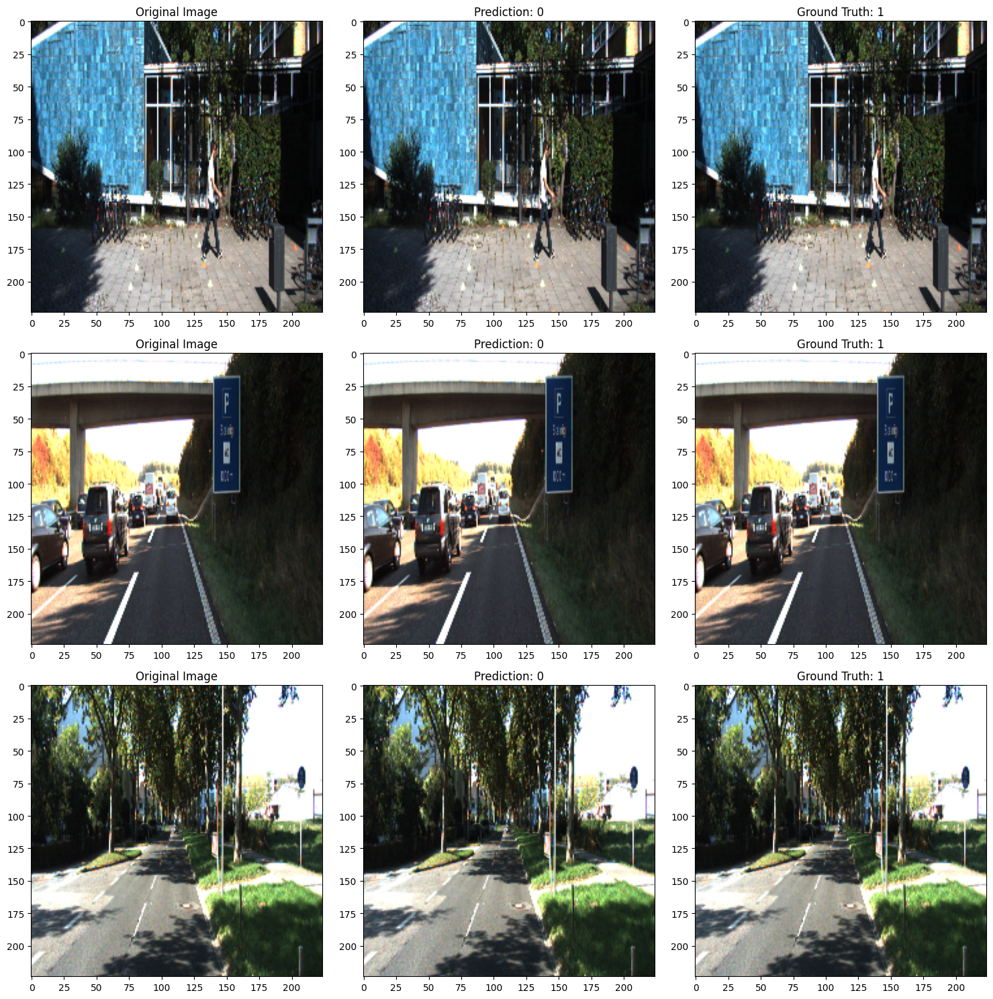

Results with linear algebra features:


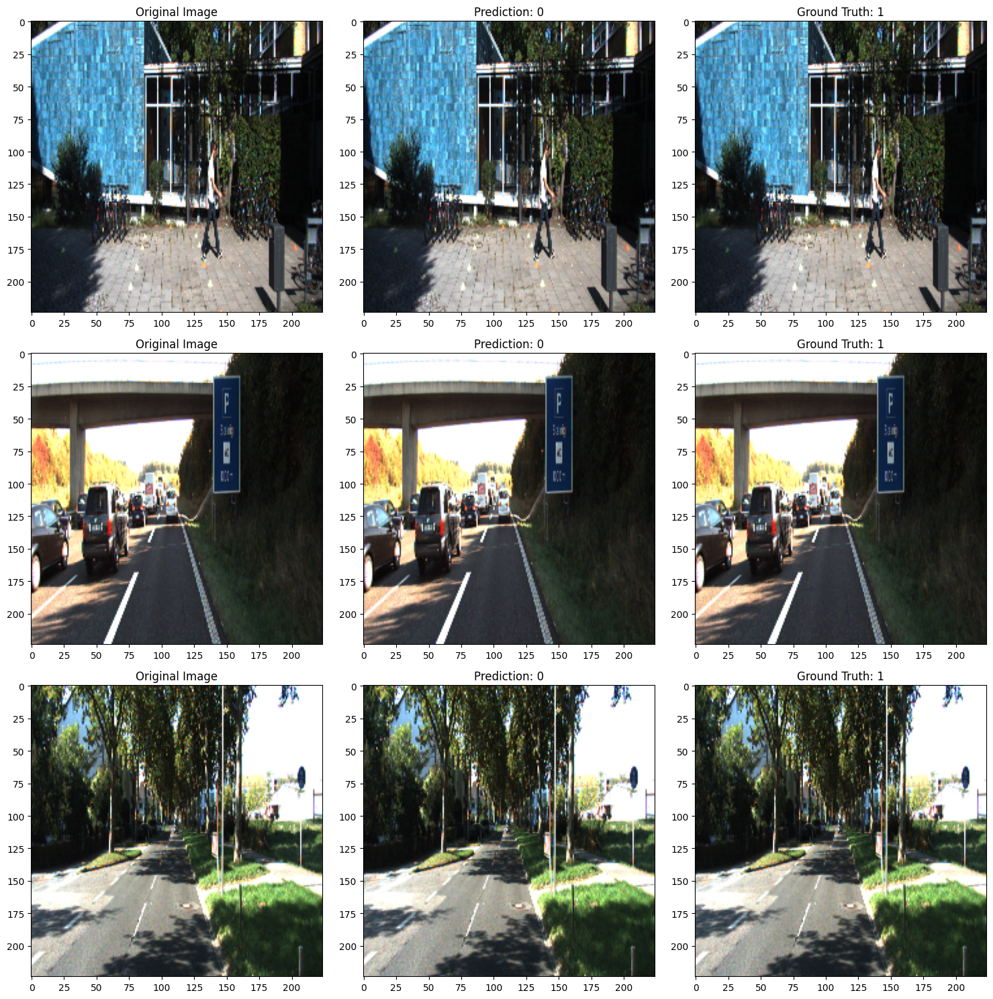

In [225]:
def plot_annotated_images(dataloader, model, dataset, num_images=3):
    model.eval()
    fig, axs = plt.subplots(num_images, 3, figsize=(15, 15))
    count = 0

    with torch.no_grad():
        for inputs, labels in dataloader:
            if count >= num_images:
                break
            inputs = inputs.float()
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            
            for j in range(inputs.size(0)):
                if count >= num_images:
                    break
                
                # Retrieve the original image from the dataset
                index = count + j
                _, camera_image, _ = dataset[index]
                camera_image = camera_image.permute(1, 2, 0).numpy().astype(np.uint8)

                axs[count, 0].imshow(cv2.cvtColor(camera_image, cv2.COLOR_BGR2RGB))
                axs[count, 0].set_title('Original Image')

                axs[count, 1].imshow(cv2.cvtColor(camera_image, cv2.COLOR_BGR2RGB))
                axs[count, 1].set_title(f'Prediction: {predicted[j].item()}')

                axs[count, 2].imshow(cv2.cvtColor(camera_image, cv2.COLOR_BGR2RGB))
                axs[count, 2].set_title(f'Ground Truth: {labels[j].item()}')

                count += 1

    plt.tight_layout()
    plt.show()

# Plot annotated images
print("Results without linear algebra features:")
plot_annotated_images(test_dataloader_fused, model_without_la, test_dataset)

print("Results with linear algebra features:")
plot_annotated_images(test_dataloader_enhanced, model_with_la, test_dataset)


Results without linear algebra features:


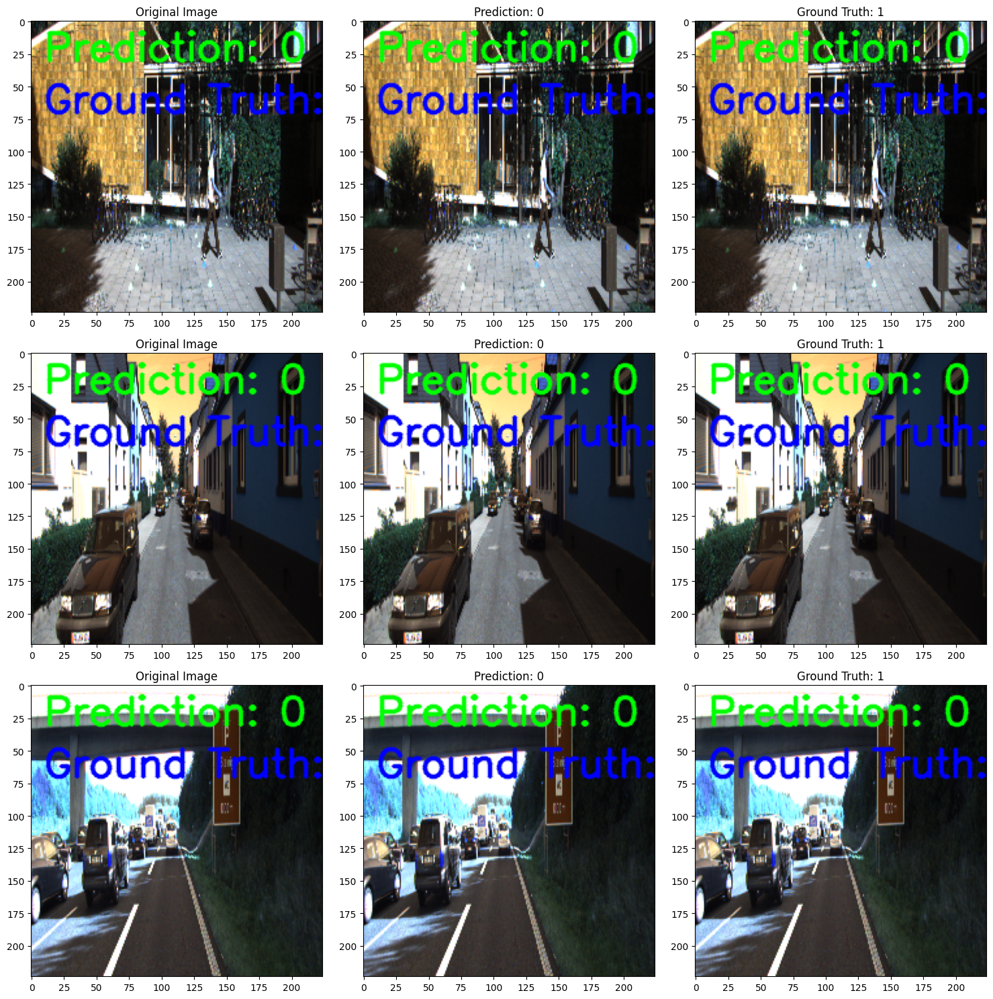

Results with linear algebra features:


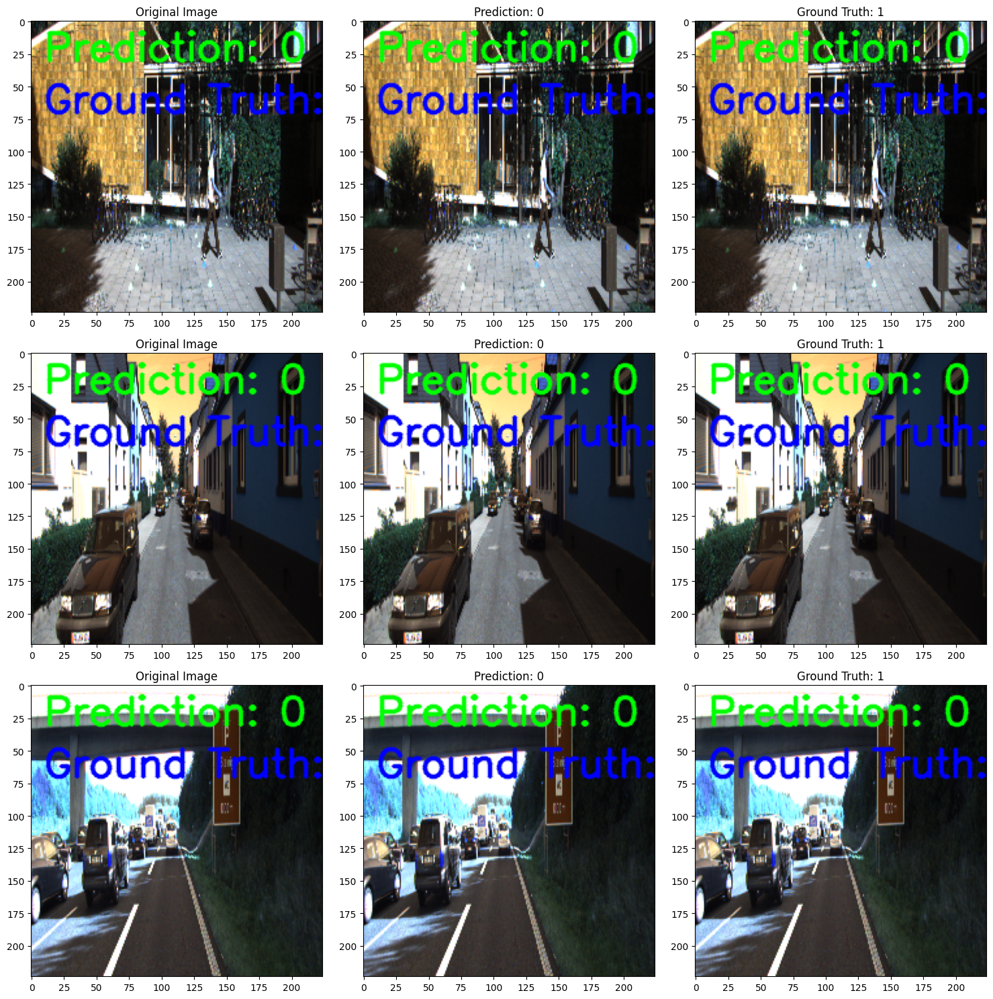

In [227]:
def plot_annotated_images(dataloader, model, dataset, num_images=3):
    model.eval()
    fig, axs = plt.subplots(num_images, 3, figsize=(15, 15))
    count = 0

    with torch.no_grad():
        for inputs, labels in dataloader:
            if count >= num_images:
                break
            inputs = inputs.float()
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            
            for j in range(inputs.size(0)):
                if count >= num_images:
                    break
                
                # Retrieve the original image from the dataset
                index = count
                _, camera_image, _ = dataset[index]
                camera_image = camera_image.permute(1, 2, 0).numpy().astype(np.uint8)
                
                # Convert to BGR for OpenCV
                camera_image_bgr = cv2.cvtColor(camera_image, cv2.COLOR_RGB2BGR)
                
                # Add text annotations
                cv2.putText(camera_image_bgr, f'Prediction: {predicted[j].item()}', (10, 30),
                            cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv2.LINE_AA)
                cv2.putText(camera_image_bgr, f'Ground Truth: {labels[j].item()}', (10, 70),
                            cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)
                
                # Convert back to RGB for plotting
                camera_image_rgb = cv2.cvtColor(camera_image_bgr, cv2.COLOR_BGR2RGB)

                axs[count, 0].imshow(camera_image_rgb)
                axs[count, 0].set_title('Original Image')

                axs[count, 1].imshow(camera_image_rgb)
                axs[count, 1].set_title(f'Prediction: {predicted[j].item()}')

                axs[count, 2].imshow(camera_image_rgb)
                axs[count, 2].set_title(f'Ground Truth: {labels[j].item()}')

                count += 1

    plt.tight_layout()
    plt.show()

# Plot annotated images
print("Results without linear algebra features:")
plot_annotated_images(test_dataloader_fused, model_without_la, test_dataset)

print("Results with linear algebra features:")
plot_annotated_images(test_dataloader_enhanced, model_with_la, test_dataset)


In [228]:
def check_label_distribution(dataloader):
    label_counts = {0: 0, 1: 0, 2: 0}  # Assuming 0: None, 1: Car, 2: Truck
    for _, _, labels in dataloader.dataset:
        for label in labels:
            label_counts[int(label)] += 1
    print(f"Label distribution: {label_counts}")

# Check label distribution in training and testing datasets
print("Training label distribution:")
check_label_distribution(train_dataloader)

print("Testing label distribution:")
check_label_distribution(test_dataloader)


Training label distribution:
Label distribution: {0: 280, 1: 114, 2: 6}
Testing label distribution:
Label distribution: {0: 71, 1: 28, 2: 1}


In [229]:
def train_model(model, dataloader, criterion, optimizer, num_epochs=10):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        for inputs, labels in dataloader:
            inputs = inputs.float()
            labels = labels.long()

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(dataloader):.4f}")

# Train and evaluate models
print("Training model without linear algebra features...")
train_model(model_without_la, train_dataloader_fused, criterion, optimizer_without_la)

print("Training model with linear algebra features...")
train_model(model_with_la, train_dataloader_enhanced, criterion, optimizer_with_la)

print("Evaluating model without linear algebra features...")
evaluate_model(model_without_la, test_dataloader_fused, criterion)

print("Evaluating model with linear algebra features...")
evaluate_model(model_with_la, test_dataloader_enhanced, criterion)


Training model without linear algebra features...
Epoch [1/10], Loss: 0.6643
Epoch [2/10], Loss: 0.6487
Epoch [3/10], Loss: 0.6511
Epoch [4/10], Loss: 0.6507
Epoch [5/10], Loss: 0.6481
Epoch [6/10], Loss: 0.6358
Epoch [7/10], Loss: 0.6357
Epoch [8/10], Loss: 0.6231
Epoch [9/10], Loss: 0.6033
Epoch [10/10], Loss: 0.6210
Training model with linear algebra features...
Epoch [1/10], Loss: 0.6475
Epoch [2/10], Loss: 0.6711
Epoch [3/10], Loss: 0.6486
Epoch [4/10], Loss: 0.6369
Epoch [5/10], Loss: 0.6372
Epoch [6/10], Loss: 0.6316
Epoch [7/10], Loss: 0.6473
Epoch [8/10], Loss: 0.6139
Epoch [9/10], Loss: 0.6226
Epoch [10/10], Loss: 0.6293
Evaluating model without linear algebra features...
Accuracy: 63.00%
Evaluating model with linear algebra features...
Accuracy: 63.00%


Results without linear algebra features:


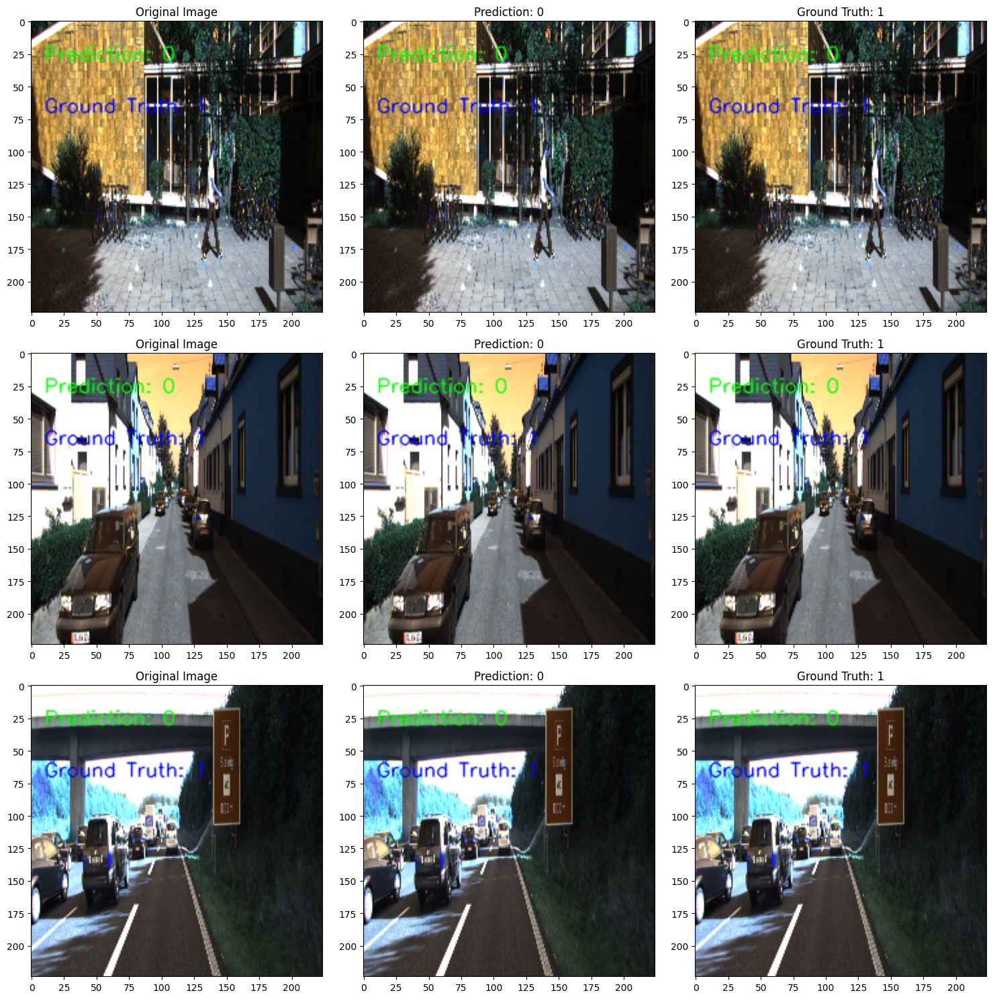

Results with linear algebra features:


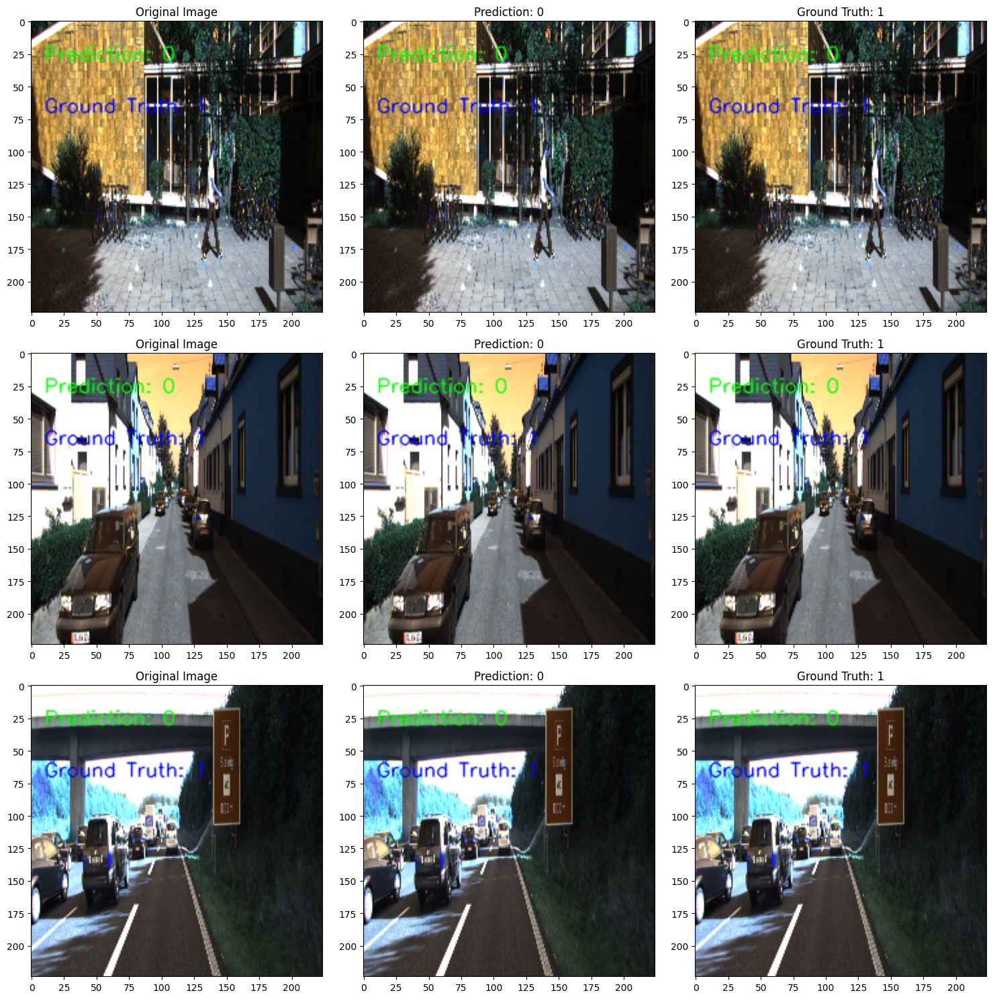

In [235]:
def plot_annotated_images(dataloader, model, dataset, num_images=3):
    model.eval()
    fig, axs = plt.subplots(num_images, 3, figsize=(15, 15))
    count = 0

    with torch.no_grad():
        for inputs, labels in dataloader:
            if count >= num_images:
                break
            inputs = inputs.float()
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            
            for j in range(inputs.size(0)):
                if count >= num_images:
                    break
                
                # Retrieve the original image from the dataset
                index = count
                _, camera_image, _ = dataset[index]
                camera_image = camera_image.permute(1, 2, 0).numpy().astype(np.uint8)
                
                # Convert to BGR for OpenCV
                camera_image_bgr = cv2.cvtColor(camera_image, cv2.COLOR_RGB2BGR)
                
                # Add text annotations
                cv2.putText(camera_image_bgr, f'Prediction: {predicted[j].item()}', (10, 30),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1, cv2.LINE_AA)
                cv2.putText(camera_image_bgr, f'Ground Truth: {labels[j].item()}', (10, 70),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1, cv2.LINE_AA)
                
                # Convert back to RGB for plotting
                camera_image_rgb = cv2.cvtColor(camera_image_bgr, cv2.COLOR_BGR2RGB)

                axs[count, 0].imshow(camera_image_rgb)
                axs[count, 0].set_title('Original Image')

                axs[count, 1].imshow(camera_image_rgb)
                axs[count, 1].set_title(f'Prediction: {predicted[j].item()}')

                axs[count, 2].imshow(camera_image_rgb)
                axs[count, 2].set_title(f'Ground Truth: {labels[j].item()}')

                count += 1

    plt.tight_layout()
    plt.show()

# Plot annotated images
print("Results without linear algebra features:")
plot_annotated_images(test_dataloader_fused, model_without_la, test_dataset)

print("Results with linear algebra features:")
plot_annotated_images(test_dataloader_enhanced, model_with_la, test_dataset)


In [1]:
import numpy as np
import os
import cv2
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

def load_kitti_annotations(annotation_path):
    annotations = []
    with open(annotation_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            annotations.append({
                'type': parts[0],
                'bbox': [float(p) for p in parts[4:8]],
                'location': [float(p) for p in parts[11:14]],
                'rotation_y': float(parts[14])
            })
    return annotations

def load_kitti_data(base_path, indices):
    lidar_data = []
    camera_images = []
    annotations = []

    for idx in indices:
        lidar_file = os.path.join(base_path, 'data_object_velodyne/training/velodyne', f'{idx:06d}.bin')
        image_file = os.path.join(base_path, 'data_object_image_2/training/image_2', f'{idx:06d}.png')
        annotation_file = os.path.join(base_path, 'data_object_label_2/training/label_2', f'{idx:06d}.txt')
        
        lidar = np.fromfile(lidar_file, dtype=np.float32).reshape(-1, 4)
        image = cv2.imread(image_file)
        annot = load_kitti_annotations(annotation_file)
        
        lidar_data.append(lidar)
        camera_images.append(image)
        annotations.append(annot)
        
    return lidar_data, camera_images, annotations

def pad_lidar_data(lidar_data, target_length=50000):
    if len(lidar_data) < target_length:
        padding = np.zeros((target_length - len(lidar_data), lidar_data.shape[1]))
        return np.vstack((lidar_data, padding))
    else:
        return lidar_data[:target_length, :]


class KittiDataset(Dataset):
    def __init__(self, lidar_data, camera_images, annotations, transform=None, lidar_length=50000, max_objects=10):
        self.lidar_data = lidar_data
        self.camera_images = camera_images
        self.annotations = annotations
        self.transform = transform
        self.lidar_length = lidar_length
        self.max_objects = max_objects

    def __len__(self):
        return len(self.camera_images)

    def __getitem__(self, idx):
        lidar = pad_lidar_data(self.lidar_data[idx], self.lidar_length)
        image = self.camera_images[idx]
        annot = self.annotations[idx]
        
        if self.transform:
            image = self.transform(image)
        
        bbox_targets, class_targets = self.prepare_targets(annot, self.max_objects)
        
        # Add batch dimension for LiDAR data
        lidar = torch.tensor(lidar, dtype=torch.float32).unsqueeze(0)
        
        return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)

    def prepare_targets(self, annotations, max_objects):
        bboxes = []
        classes = []
        for obj in annotations:
            bboxes.append(obj['bbox'])
            if obj['type'] == 'Car':
                classes.append(1)
            elif obj['type'] == 'Truck':
                classes.append(2)
            else:
                classes.append(0)
        
        # Pad targets to have a consistent size
        while len(bboxes) < max_objects:
            bboxes.append([0, 0, 0, 0])
            classes.append(0)
        
        bboxes = bboxes[:max_objects]  # Truncate if necessary
        classes = classes[:max_objects]  # Truncate if necessary
        
        return torch.tensor(bboxes, dtype=torch.float32), torch.tensor(classes, dtype=torch.long)

# Define transforms
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((224, 224)),
])

# Load data for example indices
indices = range(50)
base_path = 'kitti_data'
lidar_data, camera_images, annotations = load_kitti_data(base_path, indices)

# Create dataset and dataloader
dataset = KittiDataset(lidar_data, camera_images, annotations, transform)
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)


In [2]:
print(f"Total dataset size: {len(dataset)}")

Total dataset size: 50


In [3]:
# Verify data loading
for i, (lidar_data, camera_image, (bbox_targets, class_targets)) in enumerate(dataloader):
    print(f"Batch {i+1}")
    print("LiDAR Data:", lidar_data.shape)
    print("Camera Image:", camera_image.shape)
    print("Bounding Box Targets:", bbox_targets.shape)
    print("Class Targets:", class_targets.shape)
    
    # Print only the first batch for inspection
    if i == 0:
        break

Batch 1
LiDAR Data: torch.Size([4, 1, 50000, 4])
Camera Image: torch.Size([4, 3, 224, 224])
Bounding Box Targets: torch.Size([4, 10, 4])
Class Targets: torch.Size([4, 10])


C:\Users\Hammad\AppData\Local\Temp\ipykernel_27844\396355793.py:74: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class LiDARFeatureExtractor(nn.Module):
    def __init__(self):
        super(LiDARFeatureExtractor, self).__init__()
        self.fc1 = nn.Linear(4, 128)
        self.fc2 = nn.Linear(128, 256)
        self.fc3 = nn.Linear(256, 512)
        
    def forward(self, x):
        x = x.view(x.size(0), -1, 4)  # Ensure the shape is [batch_size, num_points, features]
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = x.mean(dim=1)  # Aggregate features
        return x

class CameraFeatureExtractor(nn.Module):
    def __init__(self):
        super(CameraFeatureExtractor, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1)
        self.fc1 = nn.Linear(256 * 28 * 28, 1024)
        
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.max_pool2d(x, 2)
        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x, 2)
        x = F.relu(self.conv3(x))
        x = F.max_pool2d(x, 2)
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        return x

class SensorFusionModel(nn.Module):
    def __init__(self, num_objects=10, num_classes=3):
        super(SensorFusionModel, self).__init__()
        self.lidar_extractor = LiDARFeatureExtractor()
        self.camera_extractor = CameraFeatureExtractor()
        self.fc1 = nn.Linear(1024 + 512, 1024)
        self.fc2 = nn.Linear(1024, 256)
        self.num_objects = num_objects
        self.num_classes = num_classes
        self.fc3 = nn.Linear(256, self.num_objects * (4 + self.num_classes))  # Predicts bounding box (4) and class scores (num_classes) for each object
        
    def forward(self, lidar, image):
        lidar_features = self.lidar_extractor(lidar)
        camera_features = self.camera_extractor(image)
        combined = torch.cat((lidar_features, camera_features), dim=1)
        x = F.relu(self.fc1(combined))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        x = x.view(-1, self.num_objects, 4 + self.num_classes)  # Reshape to [batch_size, num_objects, 4 + num_classes]
        return x


model = SensorFusionModel()


In [5]:
def loss_fn(predictions, bbox_targets, class_targets):
    # Extract predicted bounding boxes and class scores
    pred_bboxes = predictions[:, :, :4]  # Shape: [batch_size, num_objects, 4]
    pred_classes = predictions[:, :, 4:]  # Shape: [batch_size, num_objects, num_classes]
    
    # Flatten the targets and predictions
    pred_bboxes = pred_bboxes.view(-1, 4)  # Flatten to [batch_size * num_objects, 4]
    pred_classes = pred_classes.view(-1, 3)  # Flatten to [batch_size * num_objects, num_classes]
    bbox_targets = bbox_targets.view(-1, 4)  # Flatten to [batch_size * num_objects, 4]
    class_targets = class_targets.view(-1)  # Flatten to [batch_size * num_objects]
    
    # Bounding box regression loss
    bbox_loss = F.mse_loss(pred_bboxes, bbox_targets)
    
    # Class prediction loss
    class_loss = F.cross_entropy(pred_classes, class_targets)
    
    return bbox_loss + class_loss


def train_model(model, dataloader, optimizer, num_epochs=10):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        for lidar, image, (bbox_targets, class_targets) in dataloader:
            optimizer.zero_grad()
            # Ensure the dimensions are correct
            lidar = lidar.view(lidar.size(0), -1, 4)
            image = image.view(image.size(0), 3, 224, 224)
            outputs = model(lidar, image)
            loss = loss_fn(outputs, bbox_targets, class_targets)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(dataloader):.4f}')

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Train the model
train_model(model, dataloader, optimizer)


C:\Users\Hammad\AppData\Local\Temp\ipykernel_27844\396355793.py:74: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


Epoch [1/10], Loss: 83764.9802
Epoch [2/10], Loss: 70220.0526
Epoch [3/10], Loss: 71888.0823
Epoch [4/10], Loss: 77129.5093
Epoch [5/10], Loss: 60525.0697
Epoch [6/10], Loss: 52639.1456
Epoch [7/10], Loss: 58674.4743
Epoch [8/10], Loss: 53768.3752
Epoch [9/10], Loss: 66850.9917
Epoch [10/10], Loss: 60924.6118


In [6]:
def calculate_iou(box1, box2):
    # Calculate intersection
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])
    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    
    # Calculate union
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = box1_area + box2_area - intersection
    
    return intersection / union if union != 0 else 0

def evaluate_model(model, dataloader):
    model.eval()
    iou_scores = []
    with torch.no_grad():
        for lidar, image, (bbox_targets, class_targets) in dataloader:
            # Ensure the dimensions are correct
            lidar = lidar.view(lidar.size(0), -1, 4)
            image = image.view(image.size(0), 3, 224, 224)
            outputs = model(lidar, image)
            pred_bboxes = outputs[:, :, :4]  # Predicted bounding boxes
            pred_classes = outputs[:, :, 4]  # Predicted class scores

            for i in range(len(bbox_targets)):
                for j in range(bbox_targets.shape[1]):
                    iou = calculate_iou(pred_bboxes[i, j].cpu().numpy(), bbox_targets[i, j].cpu().numpy())
                    iou_scores.append(iou)
                    
    mean_iou = np.mean(iou_scores)
    print(f'Mean IoU: {mean_iou:.4f}')
    return mean_iou

# Evaluate the model
evaluate_model(model, dataloader)


C:\Users\Hammad\AppData\Local\Temp\ipykernel_27844\396355793.py:74: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


Mean IoU: 0.0092


0.009198562001693063

In [7]:
import numpy as np
import torch
import torch.nn.functional as F

def calculate_iou(box1, box2):
    # Calculate intersection
    x1 = np.maximum(box1[0], box2[0])
    y1 = np.maximum(box1[1], box2[1])
    x2 = np.minimum(box1[2], box2[2])
    y2 = np.minimum(box1[3], box2[3])
    intersection = np.maximum(0, x2 - x1) * np.maximum(0, y2 - y1)

    # Calculate union
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = box1_area + box2_area - intersection

    return intersection / union if union > 0 else 0

def calculate_precision_recall(pred_boxes, pred_classes, gt_boxes, gt_classes, iou_threshold=0.5):
    tp = 0
    fp = 0
    fn = 0

    pred_boxes = np.array(pred_boxes)
    gt_boxes = np.array(gt_boxes)
    pred_classes = np.array(pred_classes).flatten()
    gt_classes = np.array(gt_classes).flatten()

    # Debug prints
    print("Predicted Boxes:", pred_boxes)
    print("Ground Truth Boxes:", gt_boxes)
    print("Predicted Classes:", pred_classes)
    print("Ground Truth Classes:", gt_classes)

    for i in range(len(pred_boxes)):
        matched = False
        for j in range(len(gt_boxes)):
            iou = calculate_iou(pred_boxes[i], gt_boxes[j])
            print(f"Pred Class: {pred_classes[i]}, GT Class: {gt_classes[j]}, IoU: {iou}")
            if pred_classes[i] == gt_classes[j] and iou >= iou_threshold:
                tp += 1
                matched = True
                break
        if not matched:
            fp += 1

    fn = len(gt_classes) - tp

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0

    return precision, recall

def calculate_map(predictions, targets, iou_thresholds=[0.5]):
    aps = []
    for iou_threshold in iou_thresholds:
        precisions = []
        recalls = []

        for (pred_bboxes, pred_classes), (gt_bboxes, gt_classes) in zip(predictions, targets):
            precision, recall = calculate_precision_recall(
                pred_bboxes, pred_classes, gt_bboxes, gt_classes, iou_threshold
            )
            precisions.append(precision)
            recalls.append(recall)

        precision = np.mean(precisions) if precisions else 0
        recall = np.mean(recalls) if recalls else 0
        aps.append((precision, recall))

    return np.mean(aps, axis=0) if aps else (0, 0)

def evaluate_map(model, dataloader):
    model.eval()
    with torch.no_grad():
        all_predictions = []
        all_targets = []
        for lidar, image, (bbox_targets, class_targets) in dataloader:
            lidar = lidar.view(lidar.size(0), -1, 4)
            image = image.view(image.size(0), 3, 224, 224)
            outputs = model(lidar, image)
            pred_bboxes = outputs[:, :, :4].cpu().numpy()
            pred_classes = torch.argmax(outputs[:, :, 4:], dim=2).cpu().numpy()

            all_predictions.append((pred_bboxes, pred_classes))
            all_targets.append((bbox_targets.cpu().numpy(), class_targets.cpu().numpy()))
        
        precision, recall = calculate_map(all_predictions, all_targets)
        print(f'mAP: {precision:.4f}, Recall: {recall:.4f}')
        return precision, recall

# Evaluate mAP
evaluate_map(model, dataloader)


C:\Users\Hammad\AppData\Local\Temp\ipykernel_27844\396355793.py:74: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


Predicted Boxes: [[[310.80026  125.462654 427.42654  201.43597 ]
  [346.65378  124.13631  430.14035  183.34529 ]
  [362.5808   104.431206 417.6318   161.26006 ]
  [280.21277   95.68668  320.15646  111.65603 ]
  [304.46594   88.01152  333.09802  107.11081 ]
  [255.90398   65.8884   290.74353   87.58085 ]
  [207.90123   62.78343  227.11885   75.28407 ]
  [181.2037    48.84845  197.03052   74.175835]
  [171.97803   44.482464 193.89854   56.30897 ]
  [115.29913   35.25411  114.371635  43.186752]]

 [[323.3731   131.08405  441.85223  206.37306 ]
  [355.88254  129.05074  444.69293  189.03017 ]
  [375.20047  107.84391  432.50702  166.53992 ]
  [288.9104    99.68893  330.27448  115.39134 ]
  [315.9278    90.29815  348.86673  110.94158 ]
  [265.11417   69.4279   298.91843   90.16966 ]
  [215.33974   64.724045 232.44968   77.515755]
  [185.36337   48.896507 201.47882   74.361145]
  [176.17017   44.883503 198.10706   57.67944 ]
  [119.80045   37.99121  121.35091   43.512306]]

 [[368.10815  149.2

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

C:\Users\Hammad\AppData\Local\Temp\ipykernel_8996\396355793.py:74: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


IndexError: index 2 is out of bounds for axis 1 with size 2

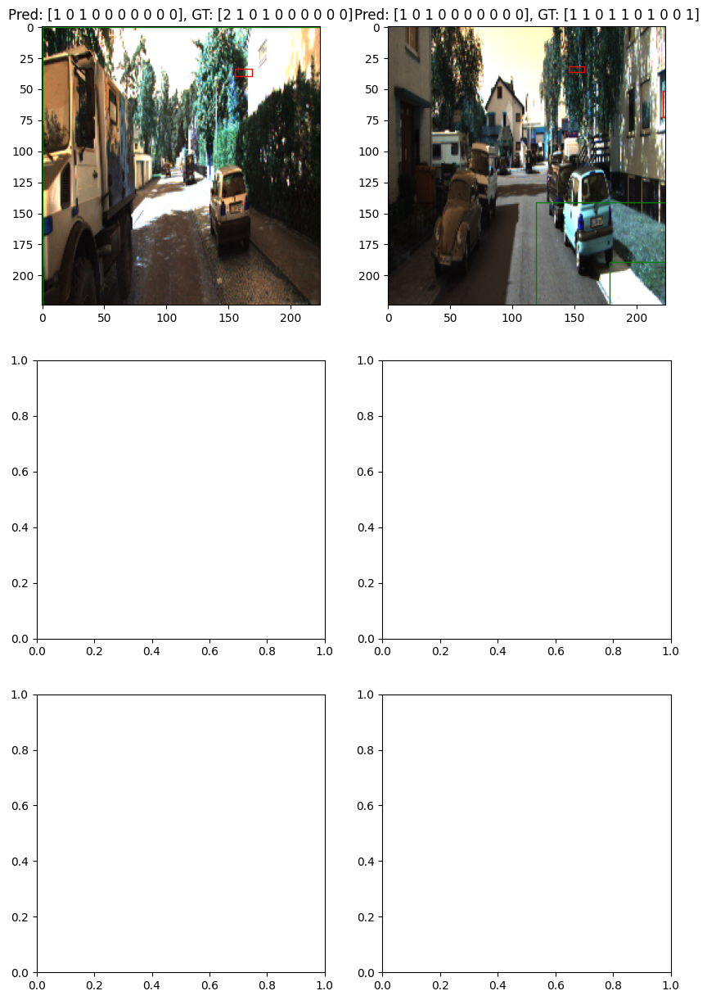

In [26]:
import matplotlib.pyplot as plt

def plot_predictions(model, dataloader, dataset, num_images=3):
    model.eval()
    fig, axs = plt.subplots(num_images, 2, figsize=(10, 15))
    with torch.no_grad():
        for i, (lidar, image, (bbox_targets, class_targets)) in enumerate(dataloader):
            if i >= num_images:
                break
            
            lidar = lidar.view(lidar.size(0), -1, 4)
            image = image.view(image.size(0), 3, 224, 224)
            outputs = model(lidar, image)
            pred_bboxes = outputs[:, :, :4].cpu().numpy()
            pred_classes = torch.argmax(outputs[:, :, 4:], dim=2).cpu().numpy()
            
            for j in range(lidar.size(0)):
                ax = axs[i, j]
                img = image[j].permute(1, 2, 0).cpu().numpy()
                ax.imshow(img)
                ax.set_title(f"Pred: {pred_classes[j]}, GT: {class_targets[j].cpu().numpy()}")
                for box in pred_bboxes[j]:
                    rect = plt.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], fill=False, color='red')
                    ax.add_patch(rect)
                for box in bbox_targets[j].cpu().numpy():
                    rect = plt.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], fill=False, color='green')
                    ax.add_patch(rect)

    plt.tight_layout()
    plt.show()

# Plot predictions
plot_predictions(model, dataloader, dataset)


In [14]:
def resize_bboxes(bboxes, original_size, new_size):
    """
    Resize bounding boxes according to the resizing of the image.
    :param bboxes: List of bounding boxes in the format [x1, y1, x2, y2]
    :param original_size: Tuple of original image size (width, height)
    :param new_size: Tuple of new image size (width, height)
    :return: Resized bounding boxes
    """
    orig_w, orig_h = original_size
    new_w, new_h = new_size
    scale_x = new_w / orig_w
    scale_y = new_h / orig_h
    resized_bboxes = []
    for bbox in bboxes:
        x1, y1, x2, y2 = bbox
        x1 = int(x1 * scale_x)
        y1 = int(y1 * scale_y)
        x2 = int(x2 * scale_x)
        y2 = int(y2 * scale_y)
        resized_bboxes.append([x1, y1, x2, y2])
    return resized_bboxes


In [15]:
import numpy as np
import os
import cv2
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

def load_kitti_annotations(annotation_path):
    annotations = []
    with open(annotation_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            annotations.append({
                'type': parts[0],
                'bbox': [float(p) for p in parts[4:8]],
                'location': [float(p) for p in parts[11:14]],
                'rotation_y': float(parts[14])
            })
    return annotations

def load_kitti_data(base_path, indices):
    lidar_data = []
    camera_images = []
    annotations = []

    for idx in indices:
        lidar_file = os.path.join(base_path, 'data_object_velodyne/training/velodyne', f'{idx:06d}.bin')
        image_file = os.path.join(base_path, 'data_object_image_2/training/image_2', f'{idx:06d}.png')
        annotation_file = os.path.join(base_path, 'data_object_label_2/training/label_2', f'{idx:06d}.txt')
        
        lidar = np.fromfile(lidar_file, dtype=np.float32).reshape(-1, 4)
        image = cv2.imread(image_file)
        annot = load_kitti_annotations(annotation_file)
        
        lidar_data.append(lidar)
        camera_images.append(image)
        annotations.append(annot)
        
    return lidar_data, camera_images, annotations

def pad_lidar_data(lidar_data, target_length=50000):
    if len(lidar_data) < target_length:
        padding = np.zeros((target_length - len(lidar_data), lidar_data.shape[1]))
        return np.vstack((lidar_data, padding))
    else:
        return lidar_data[:target_length, :]

In [16]:
class KittiDataset(Dataset):
    def __init__(self, lidar_data, camera_images, annotations, transform=None, lidar_length=50000, max_objects=10):
        self.lidar_data = lidar_data
        self.camera_images = camera_images
        self.annotations = annotations
        self.transform = transform
        self.lidar_length = lidar_length
        self.max_objects = max_objects

    def __len__(self):
        return len(self.camera_images)

    def __getitem__(self, idx):
        lidar = pad_lidar_data(self.lidar_data[idx], self.lidar_length)
        image = self.camera_images[idx]
        annot = self.annotations[idx]

        orig_size = image.shape[:2][::-1]  # (width, height)
        new_size = (224, 224)
        
        if self.transform:
            image = self.transform(image)

        resized_bboxes = resize_bboxes([obj['bbox'] for obj in annot], orig_size, new_size)
        for i, obj in enumerate(annot):
            obj['bbox'] = resized_bboxes[i]
        
        bbox_targets, class_targets = self.prepare_targets(annot, self.max_objects)

        # Add batch dimension for LiDAR data
        lidar = torch.tensor(lidar, dtype=torch.float32).unsqueeze(0)
        
        return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)

    def prepare_targets(self, annotations, max_objects):
        bboxes = []
        classes = []
        for obj in annotations:
            bboxes.append(obj['bbox'])
            if obj['type'] == 'Car':
                classes.append(1)
            elif obj['type'] == 'Truck':
                classes.append(2)
            else:
                classes.append(0)
        
        # Pad targets to have a consistent size
        while len(bboxes) < max_objects:
            bboxes.append([0, 0, 0, 0])
            classes.append(0)
        
        bboxes = bboxes[:max_objects]  # Truncate if necessary
        classes = classes[:max_objects]  # Truncate if necessary
        
        return torch.tensor(bboxes, dtype=torch.float32), torch.tensor(classes, dtype=torch.long)


In [17]:
# Define transforms
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((224, 224)),
])

# Load data for example indices
indices = range(50)
base_path = 'kitti_data'
lidar_data, camera_images, annotations = load_kitti_data(base_path, indices)

# Create dataset and dataloader
dataset = KittiDataset(lidar_data, camera_images, annotations, transform)
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)

In [18]:
for i, (lidar_data, camera_image, (bbox_targets, class_targets)) in enumerate(dataloader):
    print(f"Batch {i+1}")
    print("LiDAR Data Shape:", lidar_data.shape)
    print("Camera Image Shape:", camera_image.shape)
    print("Bounding Box Targets Shape:", bbox_targets.shape)
    # print("Bounding Box Targets:", bbox_targets)
    print("Class Targets Shape:", class_targets.shape)
    # print("Class Targets:", class_targets)
    
    # Print only the first batch for inspection
    if i == 0:
        break

Batch 1
LiDAR Data Shape: torch.Size([4, 1, 50000, 4])
Camera Image Shape: torch.Size([4, 3, 224, 224])
Bounding Box Targets Shape: torch.Size([4, 10, 4])
Class Targets Shape: torch.Size([4, 10])


C:\Users\Hammad\AppData\Local\Temp\ipykernel_1640\4170120972.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


In [20]:
def loss_fn(predictions, bbox_targets, class_targets):
    # Extract predicted bounding boxes and class scores
    pred_bboxes = predictions[:, :, :4]  # Shape: [batch_size, num_objects, 4]
    pred_classes = predictions[:, :, 4:]  # Shape: [batch_size, num_objects, num_classes]
    
    # Flatten the targets and predictions
    pred_bboxes = pred_bboxes.view(-1, 4)  # Flatten to [batch_size * num_objects, 4]
    pred_classes = pred_classes.view(-1, 3)  # Flatten to [batch_size * num_objects, num_classes]
    bbox_targets = bbox_targets.view(-1, 4)  # Flatten to [batch_size * num_objects, 4]
    class_targets = class_targets.view(-1)  # Flatten to [batch_size * num_objects]
    
    # Bounding box regression loss
    bbox_loss = F.mse_loss(pred_bboxes, bbox_targets)
    
    # Class prediction loss
    class_loss = F.cross_entropy(pred_classes, class_targets)
    
    return bbox_loss + class_loss


def train_model(model, dataloader, optimizer, num_epochs=10):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        for lidar, image, (bbox_targets, class_targets) in dataloader:
            optimizer.zero_grad()
            # Ensure the dimensions are correct
            lidar = lidar.view(lidar.size(0), -1, 4)
            image = image.view(image.size(0), 3, 224, 224)
            outputs = model(lidar, image)
            loss = loss_fn(outputs, bbox_targets, class_targets)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(dataloader):.4f}')



In [21]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Train the model
train_model(model, dataloader, optimizer)

C:\Users\Hammad\AppData\Local\Temp\ipykernel_1640\4170120972.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


KeyboardInterrupt: 

In [19]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Train the model
train_model(model, dataloader, optimizer)

TypeError: train_model() missing 1 required positional argument: 'criterion'

In [54]:
def calculate_iou(box1, box2):
    # Ensure box1 and box2 are arrays
    box1 = np.array(box1)
    box2 = np.array(box2)

    # Compute the (x, y)-coordinates of the intersection rectangle
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    # Compute the area of the intersection rectangle
    intersection_width = max(0, x2 - x1)
    intersection_height = max(0, y2 - y1)
    intersection_area = intersection_width * intersection_height

    # Compute the area of both bounding boxes
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    # Compute the union area
    union_area = box1_area + box2_area - intersection_area
    print(union_area)

    # Return the IoU
    return intersection_area / union_area if union_area > 0 else 0


In [55]:
def calculate_precision_recall(pred_boxes, pred_classes, gt_boxes, gt_classes, iou_threshold=0.5):
    tp = 0
    fp = 0
    fn = 0

    pred_boxes = np.array(pred_boxes)
    gt_boxes = np.array(gt_boxes)
    pred_classes = np.array(pred_classes).flatten()
    gt_classes = np.array(gt_classes).flatten()

    matched_gt_indices = set()

    for i in range(len(pred_boxes)):
        matched = False
        for j in range(len(gt_boxes)):
            if j in matched_gt_indices:
                continue
            iou = calculate_iou(pred_boxes[i], gt_boxes[j])
            if pred_classes[i] == gt_classes[j] and iou >= iou_threshold:
                tp += 1
                matched_gt_indices.add(j)
                matched = True
                break
        if not matched:
            fp += 1

    fn = len(gt_boxes) - len(matched_gt_indices)

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0

    return precision, recall



def calculate_map(predictions, targets, iou_thresholds=[0.5]):
    aps = []
    for iou_threshold in iou_thresholds:
        precisions = []
        recalls = []

        for (pred_bboxes, pred_classes), (gt_bboxes, gt_classes) in zip(predictions, targets):
            precision, recall = calculate_precision_recall(
                pred_bboxes, pred_classes, gt_bboxes, gt_classes, iou_threshold
            )
            precisions.append(precision)
            recalls.append(recall)

        average_precision = np.mean(precisions) if precisions else 0
        average_recall = np.mean(recalls) if recalls else 0
        aps.append((average_precision, average_recall))

    return np.mean(aps, axis=0) if aps else (0, 0)


def evaluate_map(model, dataloader):
    model.eval()
    with torch.no_grad():
        all_predictions = []
        all_targets = []
        for lidar, image, (bbox_targets, class_targets) in dataloader:
            lidar = lidar.view(lidar.size(0), -1, 4)
            image = image.view(image.size(0), 3, 224, 224)
            outputs = model(lidar, image)
            pred_bboxes = outputs[:, :, :4].cpu().numpy()
            pred_classes = torch.argmax(outputs[:, :, 4:], dim=2).cpu().numpy()

            all_predictions.append((pred_bboxes, pred_classes))
            all_targets.append((bbox_targets.cpu().numpy(), class_targets.cpu().numpy()))

        precision, recall = calculate_map(all_predictions, all_targets)
        print(f'mAP: {precision:.4f}, Recall: {recall:.4f}')
        return precision, recall

# Evaluate mAP
evaluate_map(model, dataloader)


C:\Users\Hammad\AppData\Local\Temp\ipykernel_27844\4170120972.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [68]:
def calculate_iou(box1, box2, xywh=False, eps=1e-7):
    """
    Calculate Intersection over Union (IoU) for lists of bounding boxes.

    Args:
        box1 (np.ndarray or torch.Tensor): An array of bounding boxes with shape (n, 4).
        box2 (np.ndarray or torch.Tensor): An array of bounding boxes with shape (m, 4).
        xywh (bool, optional): If True, input boxes are in (x, y, w, h) format. If False, input boxes are in
                               (x1, y1, x2, y2) format. Defaults to False.
        eps (float, optional): A small value to avoid division by zero. Defaults to 1e-7.

    Returns:
        (np.ndarray or torch.Tensor): IoU values with shape (n, m).
    """
    if xywh:  # transform from xywh to xyxy
        if isinstance(box1, np.ndarray):
            b1_x1, b1_y1, b1_x2, b1_y2 = box1[:, 0] - box1[:, 2] / 2, box1[:, 1] - box1[:, 3] / 2, box1[:, 0] + box1[:, 2] / 2, box1[:, 1] + box1[:, 3] / 2
            b2_x1, b2_y1, b2_x2, b2_y2 = box2[:, 0] - box2[:, 2] / 2, box2[:, 1] - box2[:, 3] / 2, box2[:, 0] + box2[:, 2] / 2, box2[:, 1] + box2[:, 3] / 2
        elif isinstance(box1, torch.Tensor):
            b1_x1, b1_y1, b1_x2, b1_y2 = box1[:, 0] - box1[:, 2] / 2, box1[:, 1] - box1[:, 3] / 2, box1[:, 0] + box1[:, 2] / 2, box1[:, 1] + box1[:, 3] / 2
            b2_x1, b2_y1, b2_x2, b2_y2 = box2[:, 0] - box2[:, 2] / 2, box2[:, 1] - box2[:, 3] / 2, box2[:, 0] + box2[:, 2] / 2, box2[:, 1] + box2[:, 3] / 2
    else:
        b1_x1, b1_y1, b1_x2, b1_y2 = box1.T
        b2_x1, b2_y1, b2_x2, b2_y2 = box2.T

    # Intersection area
    inter_area = (np.minimum(b1_x2[:, None], b2_x2) - np.maximum(b1_x1[:, None], b2_x1)).clip(0) * (
                 np.minimum(b1_y2[:, None], b2_y2) - np.maximum(b1_y1[:, None], b2_y1)).clip(0)

    # Union area
    b1_area = (b1_x2 - b1_x1) * (b1_y2 - b1_y1)
    b2_area = (b2_x2 - b2_x1) * (b2_y2 - b2_y1)
    union_area = b1_area[:, None] + b2_area - inter_area + eps

    # IoU
    iou = inter_area / union_area
    return iou



In [71]:
def calculate_precision_recall(pred_boxes, pred_classes, gt_boxes, gt_classes, iou_threshold=0.5):
    tp = 0
    fp = 0
    fn = 0

    matched_gt_indices = set()

    for i in range(len(pred_boxes)):
        matched = False
        for j in range(len(gt_boxes)):
            if j in matched_gt_indices:
                continue
            iou = calculate_iou(np.array([pred_boxes[i]]), np.array([gt_boxes[j]]))
            print("iou:", iou)
            iou_value = iou[0, 0]  # Extract the scalar value from the array
            print("iou value:", iou_value)

            if pred_classes[i] == gt_classes[j] and iou_value >= iou_threshold:
                tp += 1
                matched_gt_indices.add(j)
                matched = True
                break
        if not matched:
            fp += 1

    fn = len(gt_boxes) - len(matched_gt_indices)

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0

    return precision, recall


In [72]:
def evaluate_map(model, dataloader):
    model.eval()
    with torch.no_grad():
        all_predictions = []
        all_targets = []
        for lidar, image, (bbox_targets, class_targets) in dataloader:
            lidar = lidar.view(lidar.size(0), -1, 4)
            image = image.view(image.size(0), 3, 224, 224)
            outputs = model(lidar, image)
            pred_bboxes = outputs[:, :, :4].cpu().numpy()
            pred_classes = torch.argmax(outputs[:, :, 4:], dim=2).cpu().numpy()

            all_predictions.append((pred_bboxes, pred_classes))
            all_targets.append((bbox_targets.cpu().numpy(), class_targets.cpu().numpy()))

        # Flatten the lists and calculate precision and recall
        all_pred_bboxes = np.concatenate([batch[0] for batch in all_predictions])
        all_pred_classes = np.concatenate([batch[1] for batch in all_predictions])
        all_gt_bboxes = np.concatenate([batch[0] for batch in all_targets])
        all_gt_classes = np.concatenate([batch[1] for batch in all_targets])

        precision, recall = calculate_precision_recall(all_pred_bboxes, all_pred_classes, all_gt_bboxes, all_gt_classes)
        print(f'mAP: {precision:.4f}, Recall: {recall:.4f}')
        return precision, recall

# Evaluate mAP
evaluate_map(model, dataloader)

C:\Users\Hammad\AppData\Local\Temp\ipykernel_27844\4170120972.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


iou: [[[ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]]

 [[ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]]

 [[-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]]

 [[ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]]

 [[-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]]

 [[ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]]

 [[ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]
  [ 0.]]

 [[-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]]

 [[-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]]

 [[-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]
  [-0.]]]
iou value: [0.]


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

C:\Users\Hammad\AppData\Local\Temp\ipykernel_27844\4170120972.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


batch: 3


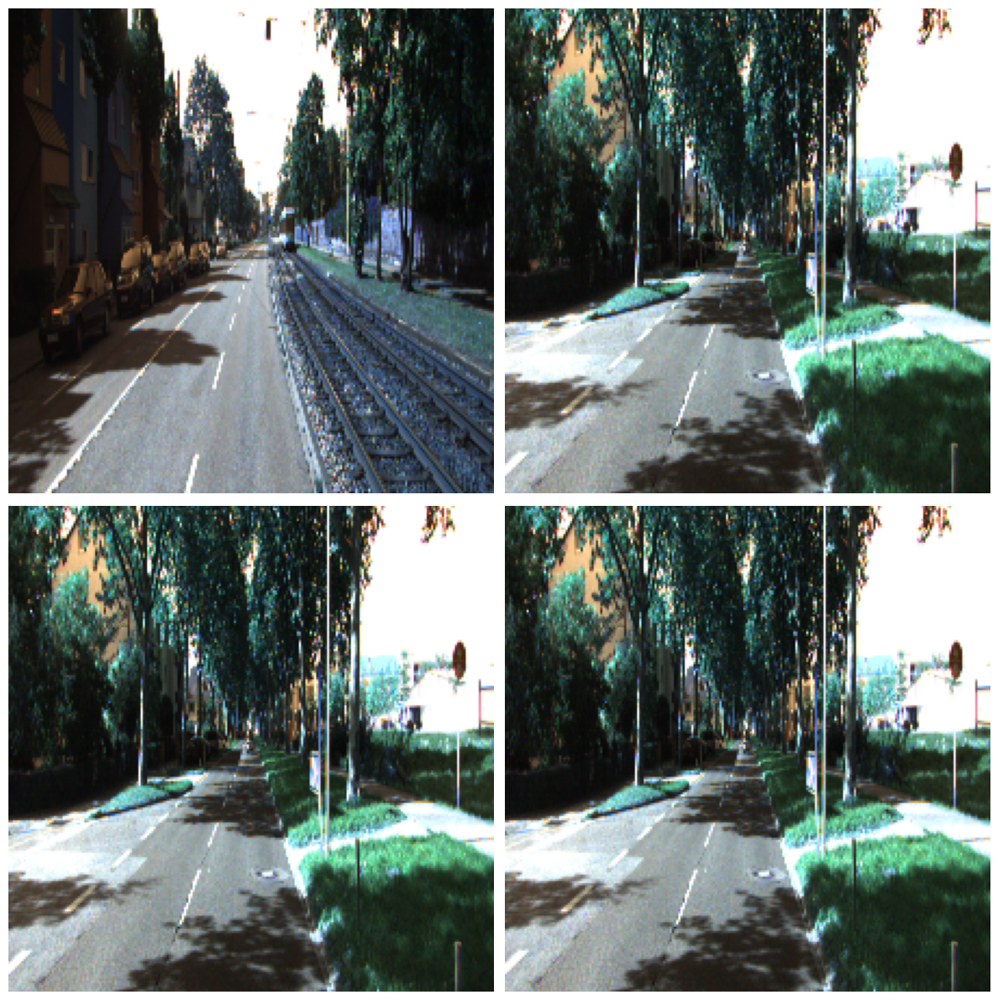

In [84]:
import matplotlib.pyplot as plt
import numpy as np
import torch

# Assume dataloader is defined and yields batches in the format:
batch = next(iter(dataloader))
print("batch:", len(batch))
# Extract camera images and annotations from the batch
camera_images = batch[1]
bounding_boxes = batch[2][0]
class_labels = batch[2][1]

# Define class names (modify according to your dataset)
class_names = ['Car', 'Truck']  # Example class names

# Function to plot image with bounding boxes
def plot_image_with_boxes(image, boxes, labels, class_names):
    plt.imshow(image)
    ax = plt.gca()
    for i, box in enumerate(boxes):
        if np.all(box == 0):  # Skip zero boxes
            continue
        x1, y1, x2, y2 = box
        width, height = x2 - x1, y2 - y1
        rect = plt.Rectangle((x1, y1), width, height, edgecolor='r', facecolor='golden')
        ax.add_patch(rect)
        label = class_names[labels[i]]
        plt.text(x1, y1, label, color='white', fontsize=12, backgroundcolor='red')
    plt.axis('off')

# Convert the camera images from tensor to numpy
camera_images_np = camera_images.permute(0, 2, 3, 1).cpu().numpy()
camera_images_np = (camera_images_np * 255).astype(np.uint8)

# Convert bounding boxes to numpy
bounding_boxes_np = bounding_boxes.cpu().numpy()
class_labels_np = class_labels.cpu().numpy()

# Plot 4 random images with annotations
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

for i, ax in enumerate(axes.flatten()):
    idx = np.random.randint(0, len(camera_images_np))
    image = camera_images_np[idx]
    boxes = bounding_boxes_np[idx]
    labels = class_labels_np[idx]
    plt.sca(ax)
    plot_image_with_boxes(image, boxes, labels, class_names)

plt.tight_layout()
plt.show()

C:\Users\Hammad\AppData\Local\Temp\ipykernel_27844\4170120972.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


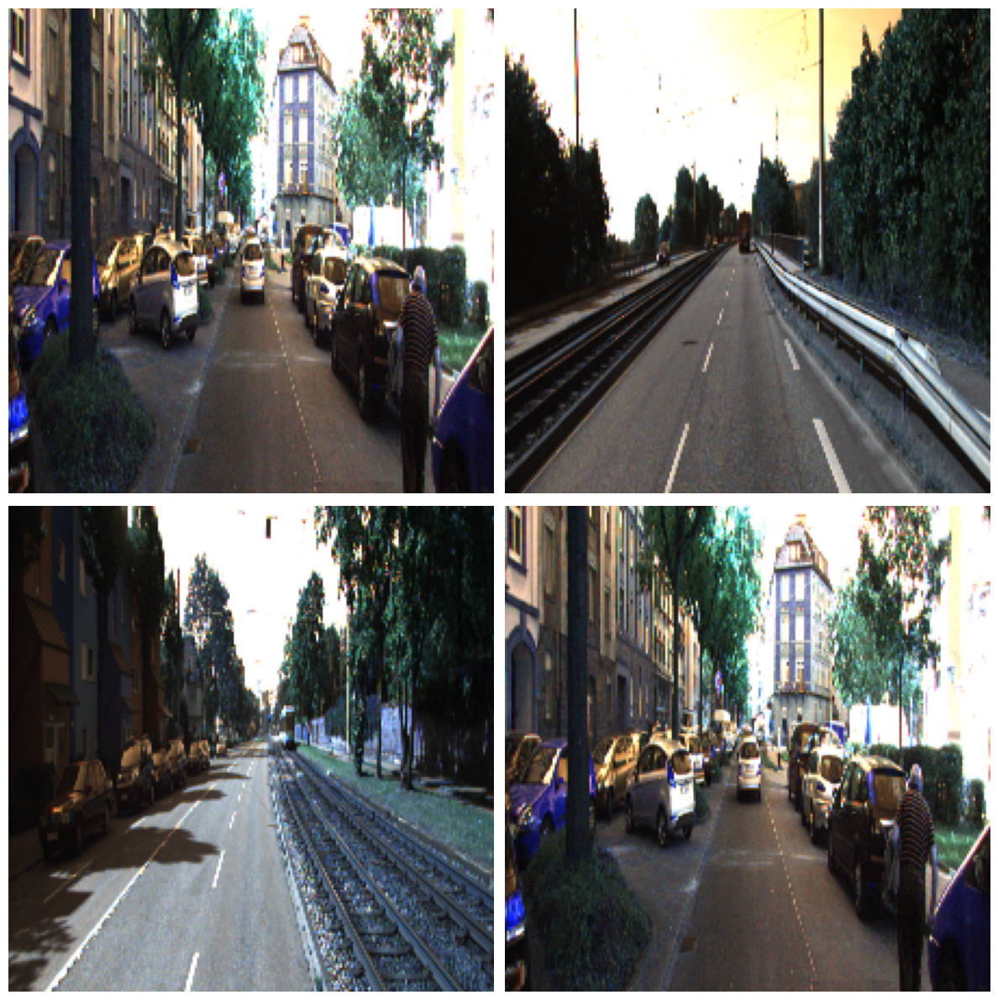

In [86]:
import matplotlib.pyplot as plt
import numpy as np
import torch

# Assume dataloader is defined and yields batches in the format:
batch = next(iter(dataloader))

# Extract camera images and annotations from the batch
camera_images = batch[1]
bounding_boxes = batch[2][0]
class_labels = batch[2][1]

# Define class names (modify according to your dataset)
class_names = ['Car', 'Truck']  # Example class names

# Function to plot image with bounding boxes
def plot_image_with_boxes(image, boxes, labels, class_names):
    plt.imshow(image)
    ax = plt.gca()
    img_height, img_width, _ = image.shape
    for i, box in enumerate(boxes):
        if np.all(box == 0):  # Skip zero boxes
            continue
        x1, y1, x2, y2 = box
        # If the coordinates are normalized, scale them to the image size
        if x1 < 1 and x2 <= 1 and y1 < 1 and y2 <= 1:
            x1 *= img_width
            x2 *= img_width
            y1 *= img_height
            y2 *= img_height
        width, height = x2 - x1, y2 - y1
        rect = plt.Rectangle((x1, y1), width, height, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        label = class_names[labels[i]]
        plt.text(x1, y1, label, color='white', fontsize=12, backgroundcolor='red')
    plt.axis('off')

# Convert the camera images from tensor to numpy
camera_images_np = camera_images.permute(0, 2, 3, 1).cpu().numpy()
camera_images_np = (camera_images_np * 255).astype(np.uint8)

# Convert bounding boxes to numpy
bounding_boxes_np = bounding_boxes.cpu().numpy()
class_labels_np = class_labels.cpu().numpy()

# Plot 4 random images with annotations
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

for i, ax in enumerate(axes.flatten()):
    idx = np.random.randint(0, len(camera_images_np))
    image = camera_images_np[idx]
    boxes = bounding_boxes_np[idx]
    labels = class_labels_np[idx]
    plt.sca(ax)
    plot_image_with_boxes(image, boxes, labels, class_names)

plt.tight_layout()
plt.show()


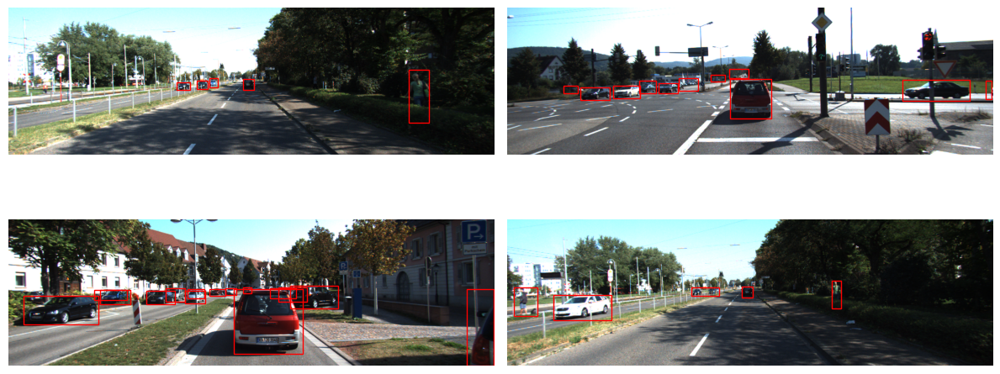

In [90]:
import os
import matplotlib.pyplot as plt
import numpy as np
import cv2

# Define the base path to the KITTI dataset
base_path = 'kitti_data'

# Function to read bounding boxes from annotation file
def read_annotations(annotation_file):
    boxes = []
    labels = []
    with open(annotation_file, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_name = parts[0]
            bbox = [float(parts[i]) for i in range(4, 8)]
            labels.append(class_name)
            boxes.append(bbox)
    return np.array(boxes), labels

# Function to plot image with bounding boxes
def plot_image_with_boxes(image, boxes, labels, class_names):
    plt.imshow(image)
    ax = plt.gca()
    img_height, img_width, _ = image.shape
    for i, box in enumerate(boxes):
        x1, y1, x2, y2 = box
        width, height = x2 - x1, y2 - y1
        rect = plt.Rectangle((x1, y1), width, height, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        label = labels[i]
        # plt.text(x1, y1, label, color='white', fontsize=12, backgroundcolor='red')
    plt.axis('off')

# Function to read an image file
def read_image(image_file):
    image = cv2.imread(image_file)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

# Get a list of annotation files
annotation_files = os.listdir(os.path.join(base_path, 'data_object_label_2/training/label_2'))

# Select 4 random annotation files to plot
selected_files = np.random.choice(annotation_files, 4, replace=False)

# Plot images with annotations
fig, axes = plt.subplots(2, 2, figsize=(12, 6))

for ax, annotation_file in zip(axes.flatten(), selected_files):
    idx = int(annotation_file.split('.')[0])
    image_file = os.path.join(base_path, 'data_object_image_2/training/image_2', f'{idx:06d}.png')
    annotation_file = os.path.join(base_path, 'data_object_label_2/training/label_2', f'{idx:06d}.txt')
    
    # Read the image and annotations
    image = read_image(image_file)
    boxes, labels = read_annotations(annotation_file)
    
    # Plot the image with bounding boxes
    plt.sca(ax)
    plot_image_with_boxes(image, boxes, labels, class_names=['Car', 'Truck'])

plt.tight_layout()
plt.show()


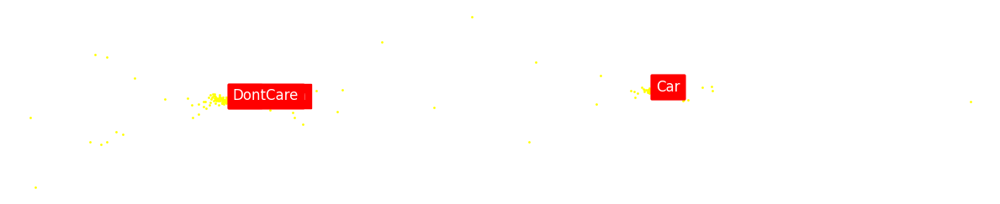

In [95]:
import os
import matplotlib.pyplot as plt
import numpy as np
import cv2
import struct

# Define the base path to the KITTI dataset
base_path = 'kitti_data'

def read_calibration(calib_file):
    with open(calib_file, 'r') as f:
        lines = f.readlines()
    
    P2 = np.array([float(value) for value in lines[2].strip().split(' ')[1:]]).reshape(3, 4)
    Tr_velo_to_cam = np.array([float(value) for value in lines[5].strip().split(' ')[1:]]).reshape(3, 4)
    R0_rect = np.array([float(value) for value in lines[4].strip().split(' ')[1:]]).reshape(3, 3)
    R0_rect = np.hstack((R0_rect, np.zeros((3, 1))))
    R0_rect = np.vstack((R0_rect, np.array([0, 0, 0, 1])))
    
    Tr_velo_to_cam = np.vstack((Tr_velo_to_cam, np.array([0, 0, 0, 1])))
    
    return P2, R0_rect, Tr_velo_to_cam

def read_lidar_data(lidar_file):
    lidar_data = np.fromfile(lidar_file, dtype=np.float32).reshape(-1, 4)
    return lidar_data

def project_lidar_to_image(lidar_points, P2, R0_rect, Tr_velo_to_cam):
    lidar_points_hom = np.hstack((lidar_points[:, :3], np.ones((lidar_points.shape[0], 1))))
    lidar_points_cam = lidar_points_hom @ Tr_velo_to_cam.T
    lidar_points_rect = lidar_points_cam @ R0_rect.T
    lidar_points_img = lidar_points_rect @ P2.T
    lidar_points_img = lidar_points_img[:, :2] / lidar_points_img[:, 2, None]
    return lidar_points_img

def read_annotations(annotation_file):
    boxes = []
    labels = []
    with open(annotation_file, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_name = parts[0]
            bbox = [float(parts[i]) for i in range(4, 8)]
            labels.append(class_name)
            boxes.append(bbox)
    return np.array(boxes), labels

def plot_image_with_boxes_and_lidar(image, boxes, labels, lidar_points_img, class_names):
    plt.imshow(image)
    ax = plt.gca()
    for i, box in enumerate(boxes):
        x1, y1, x2, y2 = box
        width, height = x2 - x1, y2 - y1
        rect = plt.Rectangle((x1, y1), width, height, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        label = labels[i]
        plt.text(x1, y1, label, color='white', fontsize=12, backgroundcolor='red')
    plt.scatter(lidar_points_img[:, 0], lidar_points_img[:, 1], c='green', s=1)
    plt.axis('off')

def read_image(image_file):
    image = cv2.imread(image_file)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

# Get a list of annotation files
annotation_files = os.listdir(os.path.join(base_path, 'data_object_label_2/training/label_2'))

# Select 4 random annotation files to plot
selected_files = np.random.choice(annotation_files, 2, replace=False)

# Plot images with annotations and LiDAR data
# fig, axes = plt.subplots(2, 2, figsize=(12, 12))
fig, axes = plt.subplots(1, 2, figsize=(12, 12))

for ax, annotation_file in zip(axes.flatten(), selected_files):
    idx = int(annotation_file.split('.')[0])
    image_file = os.path.join(base_path, 'data_object_image_2/training/image_2', f'{idx:06d}.png')
    lidar_file = os.path.join(base_path, 'data_object_velodyne/training/velodyne', f'{idx:06d}.bin')
    annotation_file = os.path.join(base_path, 'data_object_label_2/training/label_2', f'{idx:06d}.txt')
    calib_file = os.path.join(base_path, 'data_object_calib/training/calib', f'{idx:06d}.txt')
    
    # Read the image, annotations, and calibration data
    image = read_image(image_file)
    boxes, labels = read_annotations(annotation_file)
    P2, R0_rect, Tr_velo_to_cam = read_calibration(calib_file)
    
    # Read and project LiDAR points
    lidar_points = read_lidar_data(lidar_file)
    lidar_points_img = project_lidar_to_image(lidar_points, P2, R0_rect, Tr_velo_to_cam)
    
    # Plot the image with bounding boxes and LiDAR points
    plt.sca(ax)
    plot_image_with_boxes_and_lidar(image, boxes, labels, lidar_points_img, class_names=['Car', 'Truck'])

plt.tight_layout()
plt.show()


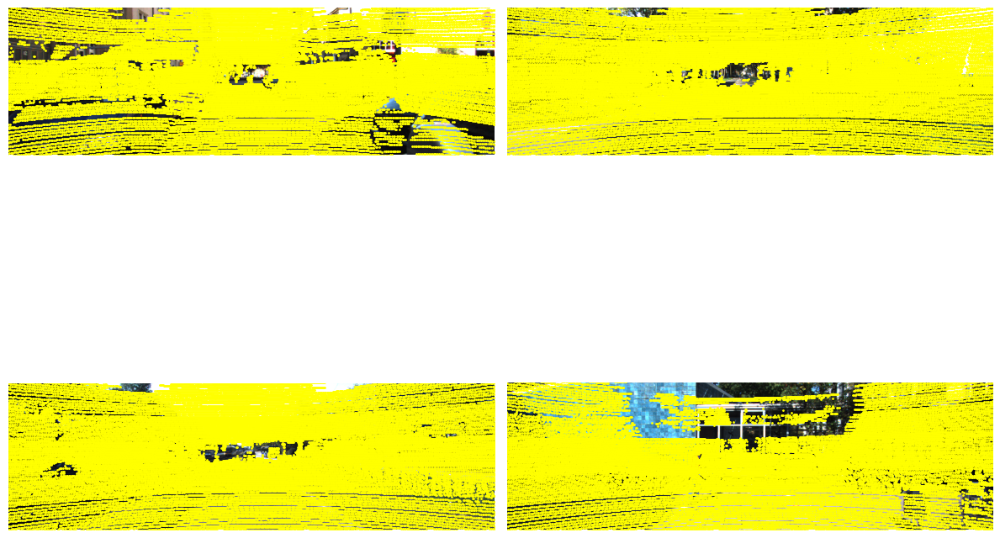

In [101]:
import os
import matplotlib.pyplot as plt
import numpy as np
import cv2

# Define the base path to the KITTI dataset
base_path = 'kitti_data'

def read_calibration(calib_file):
    with open(calib_file, 'r') as f:
        lines = f.readlines()
    
    P2 = np.array([float(value) for value in lines[2].strip().split(' ')[1:]]).reshape(3, 4)
    Tr_velo_to_cam = np.array([float(value) for value in lines[5].strip().split(' ')[1:]]).reshape(3, 4)
    R0_rect = np.array([float(value) for value in lines[4].strip().split(' ')[1:]]).reshape(3, 3)
    R0_rect = np.hstack((R0_rect, np.zeros((3, 1))))
    R0_rect = np.vstack((R0_rect, np.array([0, 0, 0, 1])))
    
    Tr_velo_to_cam = np.vstack((Tr_velo_to_cam, np.array([0, 0, 0, 1])))
    
    return P2, R0_rect, Tr_velo_to_cam

def read_lidar_data(lidar_file):
    lidar_data = np.fromfile(lidar_file, dtype=np.float32).reshape(-1, 4)
    return lidar_data

def project_lidar_to_image(lidar_points, P2, R0_rect, Tr_velo_to_cam):
    lidar_points_hom = np.hstack((lidar_points[:, :3], np.ones((lidar_points.shape[0], 1))))
    lidar_points_cam = lidar_points_hom @ Tr_velo_to_cam.T
    lidar_points_rect = lidar_points_cam @ R0_rect.T
    lidar_points_img = lidar_points_rect @ P2.T
    lidar_points_img = lidar_points_img[:, :2] / lidar_points_img[:, 2, None]
    return lidar_points_img

def read_image(image_file):
    image = cv2.imread(image_file)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

# Get a list of image files
image_files = os.listdir(os.path.join(base_path, 'data_object_image_2/training/image_2'))

# Select 4 random image files to plot
selected_files = np.random.choice(image_files, 4, replace=False)

# Plot images with LiDAR data
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

for ax, image_file in zip(axes.flatten(), selected_files):
    idx = int(image_file.split('.')[0])
    image_file = os.path.join(base_path, 'data_object_image_2/training/image_2', f'{idx:06d}.png')
    lidar_file = os.path.join(base_path, 'data_object_velodyne/training/velodyne', f'{idx:06d}.bin')
    calib_file = os.path.join(base_path, 'data_object_calib/training/calib', f'{idx:06d}.txt')
    
    # Read the image and calibration data
    image = read_image(image_file)
    P2, R0_rect, Tr_velo_to_cam = read_calibration(calib_file)
    
    # Read and project LiDAR points
    lidar_points = read_lidar_data(lidar_file)
    lidar_points_img = project_lidar_to_image(lidar_points, P2, R0_rect, Tr_velo_to_cam)
    
    # Plot the image with LiDAR points
    plt.sca(ax)
    plt.scatter(lidar_points_img[:, 0], lidar_points_img[:, 1], c='yellow', s=1)
    plt.imshow(image)
    plt.axis('off')

plt.tight_layout()
plt.show()


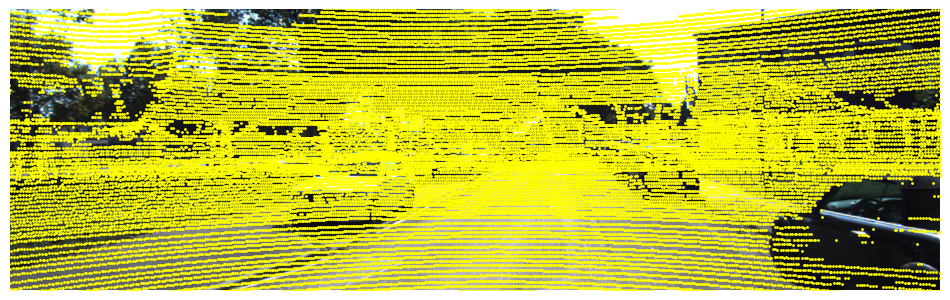

In [100]:
import os
import matplotlib.pyplot as plt
import numpy as np
import cv2

# Define the base path to the KITTI dataset
base_path = 'kitti_data'

def read_calibration(calib_file):
    with open(calib_file, 'r') as f:
        lines = f.readlines()
    
    P2 = np.array([float(value) for value in lines[2].strip().split(' ')[1:]]).reshape(3, 4)
    Tr_velo_to_cam = np.array([float(value) for value in lines[5].strip().split(' ')[1:]]).reshape(3, 4)
    R0_rect = np.array([float(value) for value in lines[4].strip().split(' ')[1:]]).reshape(3, 3)
    R0_rect = np.hstack((R0_rect, np.zeros((3, 1))))
    R0_rect = np.vstack((R0_rect, np.array([0, 0, 0, 1])))
    
    Tr_velo_to_cam = np.vstack((Tr_velo_to_cam, np.array([0, 0, 0, 1])))
    
    return P2, R0_rect, Tr_velo_to_cam

def read_lidar_data(lidar_file):
    lidar_data = np.fromfile(lidar_file, dtype=np.float32).reshape(-1, 4)
    return lidar_data

def project_lidar_to_image(lidar_points, P2, R0_rect, Tr_velo_to_cam):
    lidar_points_hom = np.hstack((lidar_points[:, :3], np.ones((lidar_points.shape[0], 1))))
    lidar_points_cam = lidar_points_hom @ Tr_velo_to_cam.T
    lidar_points_rect = lidar_points_cam @ R0_rect.T
    lidar_points_img = lidar_points_rect @ P2.T
    lidar_points_img = lidar_points_img[:, :2] / lidar_points_img[:, 2, None]
    return lidar_points_img

def read_image(image_file):
    image = cv2.imread(image_file)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

# Specify the index of the image to plot
idx = 10  # Change this index to plot different images
image_file = os.path.join(base_path, 'data_object_image_2/training/image_2', f'{idx:06d}.png')
lidar_file = os.path.join(base_path, 'data_object_velodyne/training/velodyne', f'{idx:06d}.bin')
calib_file = os.path.join(base_path, 'data_object_calib/training/calib', f'{idx:06d}.txt')

# Read the image and calibration data
image = read_image(image_file)
P2, R0_rect, Tr_velo_to_cam = read_calibration(calib_file)

# Read and project LiDAR points
lidar_points = read_lidar_data(lidar_file)
lidar_points_img = project_lidar_to_image(lidar_points, P2, R0_rect, Tr_velo_to_cam)

# Plot the image with LiDAR points
plt.figure(figsize=(12, 8))
plt.scatter(lidar_points_img[:, 0], lidar_points_img[:, 1], c='yellow', s=1)
plt.imshow(image)

plt.axis('off')
plt.show()


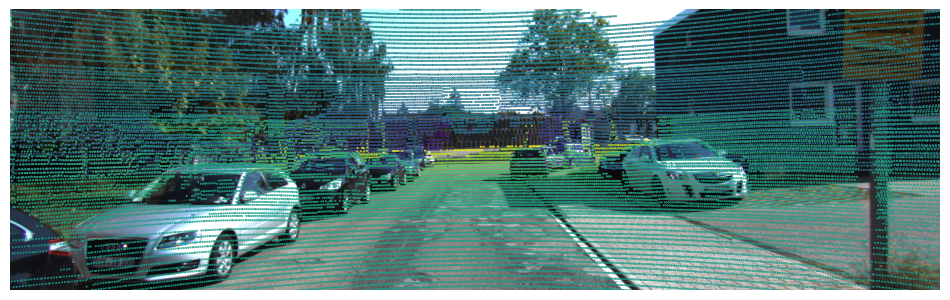

In [108]:
import os
import matplotlib.pyplot as plt
import numpy as np
import cv2

# Define the base path to the KITTI dataset
base_path = 'kitti_data'

def read_calibration(calib_file):
    with open(calib_file, 'r') as f:
        lines = f.readlines()
    
    P2 = np.array([float(value) for value in lines[2].strip().split(' ')[1:]]).reshape(3, 4)
    Tr_velo_to_cam = np.array([float(value) for value in lines[5].strip().split(' ')[1:]]).reshape(3, 4)
    R0_rect = np.array([float(value) for value in lines[4].strip().split(' ')[1:]]).reshape(3, 3)
    R0_rect = np.hstack((R0_rect, np.zeros((3, 1))))
    R0_rect = np.vstack((R0_rect, np.array([0, 0, 0, 1])))
    
    Tr_velo_to_cam = np.vstack((Tr_velo_to_cam, np.array([0, 0, 0, 1])))
    
    return P2, R0_rect, Tr_velo_to_cam

def read_lidar_data(lidar_file):
    lidar_data = np.fromfile(lidar_file, dtype=np.float32).reshape(-1, 4)
    return lidar_data

def project_lidar_to_image(lidar_points, P2, R0_rect, Tr_velo_to_cam):
    lidar_points_hom = np.hstack((lidar_points[:, :3], np.ones((lidar_points.shape[0], 1))))
    lidar_points_cam = lidar_points_hom @ Tr_velo_to_cam.T
    lidar_points_rect = lidar_points_cam @ R0_rect.T
    lidar_points_img = lidar_points_rect @ P2.T
    lidar_points_img = lidar_points_img[:, :2] / lidar_points_img[:, 2, None]
    return lidar_points_img, lidar_points_rect[:, 2]  # Return the projected points and their depth

def read_image(image_file):
    image = cv2.imread(image_file)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

# Specify the index of the image to plot
idx = 120  # Change this index to plot different images
image_file = os.path.join(base_path, 'data_object_image_2/training/image_2', f'{idx:06d}.png')
lidar_file = os.path.join(base_path, 'data_object_velodyne/training/velodyne', f'{idx:06d}.bin')
calib_file = os.path.join(base_path, 'data_object_calib/training/calib', f'{idx:06d}.txt')

# Read the image and calibration data
image = read_image(image_file)
P2, R0_rect, Tr_velo_to_cam = read_calibration(calib_file)

# Read and project LiDAR points
lidar_points = read_lidar_data(lidar_file)
lidar_points_img, lidar_depth = project_lidar_to_image(lidar_points, P2, R0_rect, Tr_velo_to_cam)

# Filter points that are outside the image boundaries
image_height, image_width, _ = image.shape
inside_image = (lidar_points_img[:, 0] >= 0) & (lidar_points_img[:, 0] < image_width) & \
               (lidar_points_img[:, 1] >= 0) & (lidar_points_img[:, 1] < image_height)

lidar_points_img = lidar_points_img[inside_image]
lidar_depth = lidar_depth[inside_image]

# Normalize depth for colormap
lidar_depth_normalized = (lidar_depth - lidar_depth.min()) / (lidar_depth.max() - lidar_depth.min())

# Plot the image with LiDAR points in color
plt.figure(figsize=(12, 8))
plt.imshow(image)
# plt.scatter(lidar_points_img[:, 0], lidar_points_img[:, 1], c=lidar_depth_normalized, cmap='viridis', s=0.05)
plt.scatter(lidar_points_img[:, 0], lidar_points_img[:, 1], c=lidar_depth_normalized, cmap='viridis', s=0.2)
plt.axis('off')
plt.show()


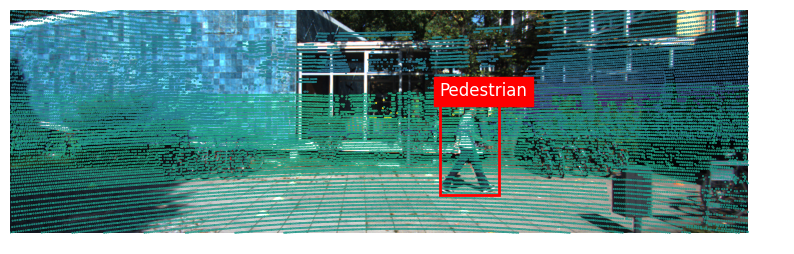

In [102]:
import os
import matplotlib.pyplot as plt
import numpy as np
import cv2

# Define the base path to the KITTI dataset
base_path = 'kitti_data'

def read_calibration(calib_file):
    with open(calib_file, 'r') as f:
        lines = f.readlines()
    
    P2 = np.array([float(value) for value in lines[2].strip().split(' ')[1:]]).reshape(3, 4)
    Tr_velo_to_cam = np.array([float(value) for value in lines[5].strip().split(' ')[1:]]).reshape(3, 4)
    R0_rect = np.array([float(value) for value in lines[4].strip().split(' ')[1:]]).reshape(3, 3)
    R0_rect = np.hstack((R0_rect, np.zeros((3, 1))))
    R0_rect = np.vstack((R0_rect, np.array([0, 0, 0, 1])))
    
    Tr_velo_to_cam = np.vstack((Tr_velo_to_cam, np.array([0, 0, 0, 1])))
    
    return P2, R0_rect, Tr_velo_to_cam

def read_lidar_data(lidar_file):
    lidar_data = np.fromfile(lidar_file, dtype=np.float32).reshape(-1, 4)
    return lidar_data

def project_lidar_to_image(lidar_points, P2, R0_rect, Tr_velo_to_cam):
    lidar_points_hom = np.hstack((lidar_points[:, :3], np.ones((lidar_points.shape[0], 1))))
    lidar_points_cam = lidar_points_hom @ Tr_velo_to_cam.T
    lidar_points_rect = lidar_points_cam @ R0_rect.T
    lidar_points_img = lidar_points_rect @ P2.T
    lidar_points_img = lidar_points_img[:, :2] / lidar_points_img[:, 2, None]
    return lidar_points_img, lidar_points_rect[:, 2]  # Return the projected points and their depth

def read_image(image_file):
    image = cv2.imread(image_file)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def read_annotations(annotation_file):
    annotations = []
    with open(annotation_file, 'r') as f:
        for line in f:
            parts = line.strip().split()
            label = parts[0]
            if label in ['Car', 'Truck', 'Pedestrian']:  # Add other classes as needed
                x1, y1, x2, y2 = map(float, parts[4:8])
                annotations.append((label, x1, y1, x2, y2))
    return annotations

# Specify the index of the image to plot
idx = 0  # Change this index to plot different images
image_file = os.path.join(base_path, 'data_object_image_2/training/image_2', f'{idx:06d}.png')
lidar_file = os.path.join(base_path, 'data_object_velodyne/training/velodyne', f'{idx:06d}.bin')
calib_file = os.path.join(base_path, 'data_object_calib/training/calib', f'{idx:06d}.txt')
annotation_file = os.path.join(base_path, 'data_object_label_2/training/label_2', f'{idx:06d}.txt')

# Read the image and calibration data
image = read_image(image_file)
P2, R0_rect, Tr_velo_to_cam = read_calibration(calib_file)

# Read and project LiDAR points
lidar_points = read_lidar_data(lidar_file)
lidar_points_img, lidar_depth = project_lidar_to_image(lidar_points, P2, R0_rect, Tr_velo_to_cam)

# Filter points that are outside the image boundaries
image_height, image_width, _ = image.shape
inside_image = (lidar_points_img[:, 0] >= 0) & (lidar_points_img[:, 0] < image_width) & \
               (lidar_points_img[:, 1] >= 0) & (lidar_points_img[:, 1] < image_height)

lidar_points_img = lidar_points_img[inside_image]
lidar_depth = lidar_depth[inside_image]

# Normalize depth for colormap
lidar_depth_normalized = (lidar_depth - lidar_depth.min()) / (lidar_depth.max() - lidar_depth.min())

# Read annotations
annotations = read_annotations(annotation_file)

# Plot the image with LiDAR points and annotations
plt.figure(figsize=(10, 8))
plt.imshow(image)
ax = plt.gca()

# Plot LiDAR points
scatter = ax.scatter(lidar_points_img[:, 0], lidar_points_img[:, 1], c=lidar_depth_normalized, cmap='viridis', s=0.2)

# Plot annotations
for label, x1, y1, x2, y2 in annotations:
    width, height = x2 - x1, y2 - y1
    rect = plt.Rectangle((x1, y1), width, height, edgecolor='red', facecolor='none', linewidth=2)
    ax.add_patch(rect)
    plt.text(x1, y1, label, color='white', fontsize=12, backgroundcolor='red')

plt.axis('off')
# plt.colorbar(scatter, ax=ax, label='Depth')
plt.show()


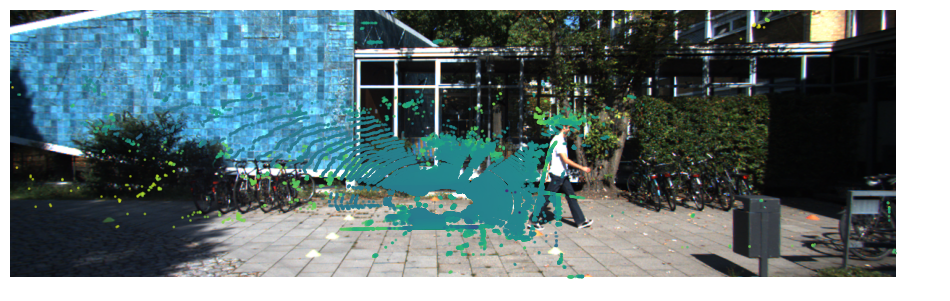

In [99]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Define the base path to the KITTI dataset
base_path = 'kitti_data'

def read_lidar_data(lidar_file):
    lidar_data = np.fromfile(lidar_file, dtype=np.float32).reshape(-1, 4)
    return lidar_data

def read_image(image_file):
    image = cv2.imread(image_file)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

# Specify the index of the image to plot
idx = 0  # Change this index to plot different images
image_file = os.path.join(base_path, 'data_object_image_2/training/image_2', f'{idx:06d}.png')
lidar_file = os.path.join(base_path, 'data_object_velodyne/training/velodyne', f'{idx:06d}.bin')
annotation_file = os.path.join(base_path, 'data_object_label_2/training/label_2', f'{idx:06d}.txt')

# Read the image
image = read_image(image_file)

# Read and process LiDAR points
lidar_points = read_lidar_data(lidar_file)

# Extract x, y, z coordinates (we ignore the intensity for simplicity)
x, y, z = lidar_points[:, 0], lidar_points[:, 1], lidar_points[:, 2]

# Normalize the LiDAR points to fit within the image dimensions
x_normalized = (x - x.min()) / (x.max() - x.min())
y_normalized = (y - y.min()) / (y.max() - y.min())

image_height, image_width, _ = image.shape

x_image = (x_normalized * image_width).astype(np.int32)
y_image = (1 - y_normalized) * image_height  # Flip y for image coordinates
y_image = y_image.astype(np.int32)

# Plot the image with LiDAR points
plt.figure(figsize=(12, 8))
plt.imshow(image)
plt.scatter(x_image, y_image, c=z, cmap='viridis', s=1, alpha=0.5)
plt.axis('off')
# plt.colorbar(label='Depth (z-coordinate)')
plt.show()


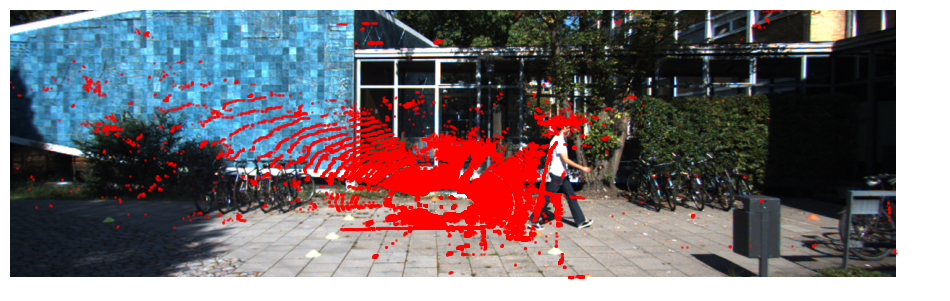

In [116]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Define the base path to the KITTI dataset
base_path = 'kitti_data'

def read_lidar_data(lidar_file):
    lidar_data = np.fromfile(lidar_file, dtype=np.float32).reshape(-1, 4)
    return lidar_data

def read_image(image_file):
    image = cv2.imread(image_file)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

# Specify the index of the image to plot
idx = 0  # Change this index to plot different images
image_file = os.path.join(base_path, 'data_object_image_2/training/image_2', f'{idx:06d}.png')
lidar_file = os.path.join(base_path, 'data_object_velodyne/training/velodyne', f'{idx:06d}.bin')
annotation_file = os.path.join(base_path, 'data_object_label_2/training/label_2', f'{idx:06d}.txt')

# Read the image
image = read_image(image_file)

# Read and process LiDAR points
lidar_points = read_lidar_data(lidar_file)

# Extract x, y, z coordinates (we ignore the intensity for simplicity)
x, y, z = lidar_points[:, 0], lidar_points[:, 1], lidar_points[:, 2]

# Normalize the LiDAR points to fit within the image dimensions
x_normalized = (x - x.min()) / (x.max() - x.min())
y_normalized = (y - y.min()) / (y.max() - y.min())

image_height, image_width, _ = image.shape

x_image = (x_normalized * image_width).astype(np.int32)
y_image = (1 - y_normalized) * image_height  # Flip y for image coordinates
y_image = y_image.astype(np.int32)

# Plot the image with LiDAR points
plt.figure(figsize=(12, 8))
plt.imshow(image)
plt.scatter(x_image, y_image, s=1, c='red', alpha=0.5)
plt.axis('off')
plt.show()


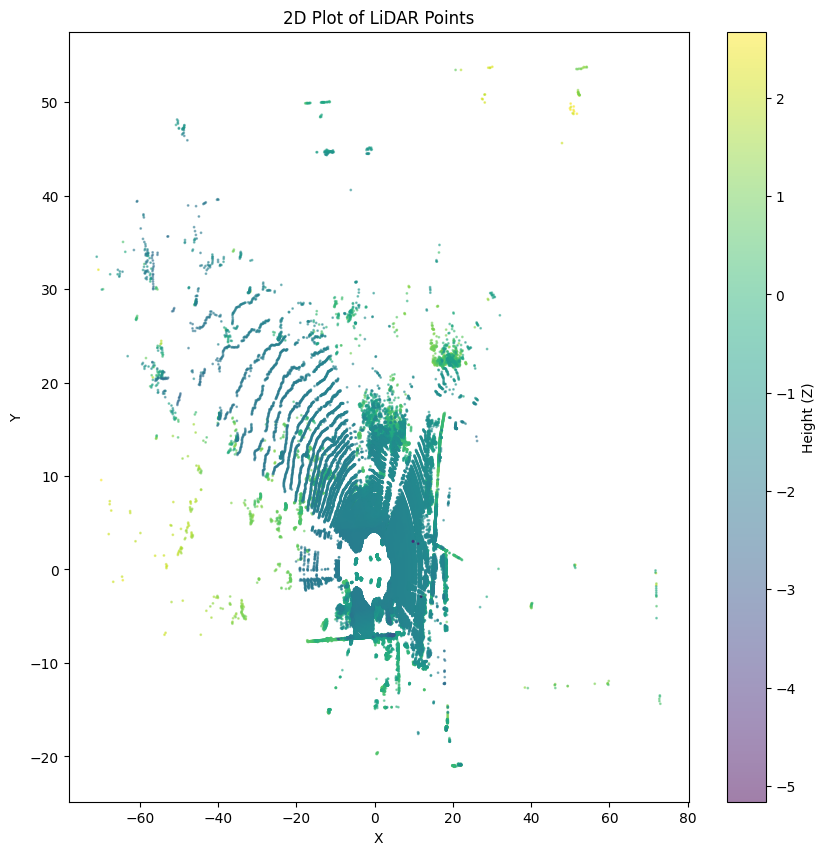

In [119]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Define the base path to the KITTI dataset
base_path = 'kitti_data'

def read_lidar_data(lidar_file):
    lidar_data = np.fromfile(lidar_file, dtype=np.float32).reshape(-1, 4)
    return lidar_data

# Specify the index of the image to plot
idx = 0  # Change this index to plot different images
lidar_file = os.path.join(base_path, 'data_object_velodyne/training/velodyne', f'{idx:06d}.bin')

# Read and process LiDAR points
lidar_points = read_lidar_data(lidar_file)

# Extract x, y, z coordinates (we ignore the intensity for simplicity)
x, y, z = lidar_points[:, 0], lidar_points[:, 1], lidar_points[:, 2]

# Plot the LiDAR points
plt.figure(figsize=(10, 10))
plt.scatter(x, y, s=1, c=z, cmap='viridis', alpha=0.5)
# plt.colorbar(label='Height (Z)')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('2D Plot of LiDAR Points')
# plt.axis('equal')
plt.show()


In [1]:
import numpy as np
import os
import cv2
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

def load_kitti_annotations(annotation_path):
    annotations = []
    with open(annotation_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            annotations.append({
                'type': parts[0],
                'bbox': [float(p) for p in parts[4:8]],
                'location': [float(p) for p in parts[11:14]],
                'rotation_y': float(parts[14])
            })
    return annotations

def load_kitti_data(base_path, indices):
    lidar_data = []
    camera_images = []
    annotations = []

    for idx in indices:
        lidar_file = os.path.join(base_path, 'data_object_velodyne/training/velodyne', f'{idx:06d}.bin')
        image_file = os.path.join(base_path, 'data_object_image_2/training/image_2', f'{idx:06d}.png')
        annotation_file = os.path.join(base_path, 'data_object_label_2/training/label_2', f'{idx:06d}.txt')
        
        lidar = np.fromfile(lidar_file, dtype=np.float32).reshape(-1, 4)
        image = cv2.imread(image_file)
        annot = load_kitti_annotations(annotation_file)
        
        lidar_data.append(lidar)
        camera_images.append(image)
        annotations.append(annot)
        
    return lidar_data, camera_images, annotations

def pad_lidar_data(lidar_data, target_length=50000):
    if len(lidar_data) < target_length:
        padding = np.zeros((target_length - len(lidar_data), lidar_data.shape[1]))
        return np.vstack((lidar_data, padding))
    else:
        return lidar_data[:target_length, :]

class KittiDataset(Dataset):
    def __init__(self, lidar_data, camera_images, annotations, transform=None, lidar_length=50000, max_objects=10):
        self.lidar_data = lidar_data
        self.camera_images = camera_images
        self.annotations = annotations
        self.transform = transform
        self.lidar_length = lidar_length
        self.max_objects = max_objects

    def __len__(self):
        return len(self.camera_images)

    def __getitem__(self, idx):
        lidar = pad_lidar_data(self.lidar_data[idx], self.lidar_length)
        image = self.camera_images[idx]
        annot = self.annotations[idx]

        orig_size = image.shape[:2][::-1]  # (width, height)
        new_size = (224, 224)
        
        if self.transform:
            image = self.transform(image)

        resized_bboxes = self.resize_bboxes([obj['bbox'] for obj in annot], orig_size, new_size)
        for i, obj in enumerate(annot):
            obj['bbox'] = resized_bboxes[i]
        
        bbox_targets, class_targets = self.prepare_targets(annot, self.max_objects)

        # Adjust the shape for LiDAR data
        lidar = torch.tensor(lidar, dtype=torch.float32).unsqueeze(0)  # [1, 50000, 4]
        
        return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)

    def prepare_targets(self, annotations, max_objects):
        bboxes = []
        classes = []
        for obj in annotations:
            bboxes.append(obj['bbox'])
            if obj['type'] == 'Car':
                classes.append(1)
            elif obj['type'] == 'Truck':
                classes.append(2)
            else:
                classes.append(0)
        
        # Pad targets to have a consistent size
        while len(bboxes) < max_objects:
            bboxes.append([0, 0, 0, 0])
            classes.append(0)
        
        bboxes = bboxes[:max_objects]  # Truncate if necessary
        classes = classes[:max_objects]  # Truncate if necessary
        
        return torch.tensor(bboxes, dtype=torch.float32), torch.tensor(classes, dtype=torch.long)
    
    def resize_bboxes(self, bboxes, orig_size, new_size):
        orig_w, orig_h = orig_size
        new_w, new_h = new_size
        scale_x = new_w / orig_w
        scale_y = new_h / orig_h
        resized_bboxes = []
        for bbox in bboxes:
            x1, y1, x2, y2 = bbox
            x1 = x1 * scale_x
            y1 = y1 * scale_y
            x2 = x2 * scale_x
            y2 = y2 * scale_y
            resized_bboxes.append([x1, y1, x2, y2])
        return resized_bboxes


In [8]:
# Define transforms
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((224, 224)),
])

# Load data for example indices
indices = range(50)
base_path = 'kitti_data'
lidar_data, camera_images, annotations = load_kitti_data(base_path, indices)

# Create dataset and dataloader
dataset = KittiDataset(lidar_data, camera_images, annotations, transform=transform)
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)


In [9]:
# def apply_transformation(points, transformation_matrix):
#     points_hom = np.hstack((points[:, :3], np.ones((points.shape[0], 1))))
#     transformed_points = points_hom @ transformation_matrix.T
#     return transformed_points

# def apply_qr_decomposition(points):
#     Q, R = np.linalg.qr(points[:, :3])
#     return Q

# def apply_svd(points):
#     U, S, Vt = np.linalg.svd(points[:, :3])
#     return U @ np.diag(S)


In [92]:
# Model without NLA
import torch
import torch.nn as nn
import torch.nn.functional as F

class LiDARFeatureExtractor(nn.Module):
    def __init__(self):
        super(LiDARFeatureExtractor, self).__init__()
        self.fc1 = nn.Linear(4, 128)
        self.fc2 = nn.Linear(128, 256)
        self.fc3 = nn.Linear(256, 512)
        
    def forward(self, x):
        x = x.view(x.size(0), -1, 4)  # Ensure the shape is [batch_size, num_points, features]
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = x.mean(dim=1)  # Aggregate features
        return x

class CameraFeatureExtractor(nn.Module):
    def __init__(self):
        super(CameraFeatureExtractor, self).__init__()
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1)
        self.fc1 = nn.Linear(256 * 28 * 28, 1024)
        
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.max_pool2d(x, 2)
        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x, 2)
        x = F.relu(self.conv3(x))
        x = F.max_pool2d(x, 2)
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        return x

class SensorFusionModel(nn.Module):
    def __init__(self, num_objects=10, num_classes=3):
        super(SensorFusionModel, self).__init__()
        self.lidar_extractor = LiDARFeatureExtractor()
        self.camera_extractor = CameraFeatureExtractor()
        self.fc1 = nn.Linear(1024 + 512, 1024)
        self.fc2 = nn.Linear(1024, 256)
        self.num_objects = num_objects
        self.num_classes = num_classes
        self.fc3 = nn.Linear(256, self.num_objects * (4 + self.num_classes))  # Predicts bounding box (4) and class scores (num_classes) for each object
        
    def forward(self, lidar, image):
        lidar_features = self.lidar_extractor(lidar)
        camera_features = self.camera_extractor(image)
        combined = torch.cat((lidar_features, camera_features), dim=1)
        x = F.relu(self.fc1(combined))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        x = x.view(-1, self.num_objects, 4 + self.num_classes)  # Reshape to [batch_size, num_objects, 4 + num_classes]
        return x

model = SensorFusionModel()

In [38]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class LiDARFeatureExtractorWithSVD(nn.Module):
    def __init__(self, input_dim=4, svd_dim=2):
        super(LiDARFeatureExtractorWithSVD, self).__init__()
        self.svd_dim = svd_dim
        self.fc1 = nn.Linear(svd_dim, 128)
        self.fc2 = nn.Linear(128, 256)
        self.fc3 = nn.Linear(256, 512)
        
    def forward(self, x):
        batch_size = x.size(0)
        num_points = x.size(1)
        x = x.view(batch_size * num_points, -1)  # Flatten to [batch_size * num_points, features]
        
        # Apply SVD
        U, S, V = torch.svd(x)
        x_svd = torch.mm(U[:, :self.svd_dim], torch.diag(S[:self.svd_dim]))
        x_svd = x_svd.view(batch_size, num_points, -1)
        
        # Continue with the rest of the network
        x = F.relu(self.fc1(x_svd))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = x.mean(dim=1)  # Aggregate features
        return x

# Updated SensorFusionModel to use LiDARFeatureExtractorWithSVD
class SensorFusionModelwithSVD(nn.Module):
    def __init__(self, num_objects=10, num_classes=3):
        super(SensorFusionModelwithSVD, self).__init__()
        self.lidar_extractor = LiDARFeatureExtractorWithSVD()
        self.camera_extractor = CameraFeatureExtractor()
        self.fc1 = nn.Linear(1024 + 512, 1024)
        self.fc2 = nn.Linear(1024, 256)
        self.num_objects = num_objects
        self.num_classes = num_classes
        self.fc3 = nn.Linear(256, self.num_objects * (4 + self.num_classes))  # Predicts bounding box (4) and class scores (num_classes) for each object
        
    def forward(self, lidar, image):
        lidar_features = self.lidar_extractor(lidar)
        camera_features = self.camera_extractor(image)
        combined = torch.cat((lidar_features, camera_features), dim=1)
        x = F.relu(self.fc1(combined))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        x = x.view(-1, self.num_objects, 4 + self.num_classes)  # Reshape to [batch_size, num_objects, 4 + num_classes]
        return x

model_with_svd = SensorFusionModelwithSVD()

In [12]:
# def train_model(model, dataloader, optimizer, criterion, num_epochs=10):
#     model.train()
#     for epoch in range(num_epochs):
#         running_loss = 0.0
#         for i, (lidar, image, targets) in enumerate(dataloader):
#             bbox_targets, class_targets = targets
#             optimizer.zero_grad()
#             outputs = model(lidar, image)
#             loss = criterion(outputs, bbox_targets, class_targets)
#             loss.backward()
#             optimizer.step()
#             running_loss += loss.item()
        
#         print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(dataloader)}")

# # Define a criterion
# def custom_loss(outputs, bbox_targets, class_targets):
#     batch_size, num_objects, _ = outputs.shape

#     # Bounding Box Loss
#     bbox_loss = F.mse_loss(outputs[:, :, :4], bbox_targets)

#     # Classification Loss
#     outputs_class = outputs[:, :, 4:].reshape(batch_size * num_objects, -1)  # Shape: [batch_size * num_objects, num_classes]
#     class_targets = class_targets.view(batch_size * num_objects)  # Shape: [batch_size * num_objects]
    
#     class_loss = F.cross_entropy(outputs_class, class_targets)
    
#     return bbox_loss + class_loss



In [93]:
def loss_fn(predictions, bbox_targets, class_targets):
    # Extract predicted bounding boxes and class scores
    pred_bboxes = predictions[:, :, :4]  # Shape: [batch_size, num_objects, 4]
    pred_classes = predictions[:, :, 4:]  # Shape: [batch_size, num_objects, num_classes]
    
    # Flatten the targets and predictions
    pred_bboxes = pred_bboxes.view(-1, 4)  # Flatten to [batch_size * num_objects, 4]
    pred_classes = pred_classes.view(-1, 3)  # Flatten to [batch_size * num_objects, num_classes]
    bbox_targets = bbox_targets.view(-1, 4)  # Flatten to [batch_size * num_objects, 4]
    class_targets = class_targets.view(-1)  # Flatten to [batch_size * num_objects]
    
    # Bounding box regression loss
    bbox_loss = F.mse_loss(pred_bboxes, bbox_targets)
    
    # Class prediction loss
    class_loss = F.cross_entropy(pred_classes, class_targets)
    
    return bbox_loss + class_loss


def train_model(model, dataloader, optimizer, num_epochs=10):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        for lidar, image, (bbox_targets, class_targets) in dataloader:
            optimizer.zero_grad()
            # Ensure the dimensions are correct
            lidar = lidar.view(lidar.size(0), -1, 4)
            image = image.view(image.size(0), 3, 224, 224)
            outputs = model(lidar, image)
            loss = loss_fn(outputs, bbox_targets, class_targets)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(dataloader):.4f}')



In [94]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
train_model(model, dataloader, optimizer)

# optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
# train_model(model, dataloader, optimizer, custom_loss, num_epochs=10)

C:\Users\Hammad\AppData\Local\Temp\ipykernel_1640\4170120972.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


Epoch [1/10], Loss: 0.7253
Epoch [2/10], Loss: 0.6181
Epoch [3/10], Loss: 0.5517
Epoch [4/10], Loss: 0.5436
Epoch [5/10], Loss: 0.5279


KeyboardInterrupt: 

In [39]:
optimizer = torch.optim.Adam(model_with_svd.parameters(), lr=0.001)
train_model(model_with_svd, dataloader, optimizer)

# optimizer = torch.optim.Adam(model_with_svd.parameters(), lr=0.001)
# train_model(model_with_svd, dataloader, optimizer, custom_loss, num_epochs=10)

C:\Users\Hammad\AppData\Local\Temp\ipykernel_1640\4170120972.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


Epoch [1/10], Loss: 285.9716
Epoch [2/10], Loss: 83.3565
Epoch [3/10], Loss: 31.6488
Epoch [4/10], Loss: 7.5049
Epoch [5/10], Loss: 3.6017
Epoch [6/10], Loss: 1.3768
Epoch [7/10], Loss: 0.8864
Epoch [8/10], Loss: 0.6439
Epoch [9/10], Loss: 0.5580
Epoch [10/10], Loss: 0.5507


In [41]:
import torch
import torch.nn.functional as F
from sklearn.metrics import average_precision_score

def loss_fn(predictions, bbox_targets, class_targets):
    # Extract predicted bounding boxes and class scores
    pred_bboxes = predictions[:, :, :4]  # Shape: [batch_size, num_objects, 4]
    pred_classes = predictions[:, :, 4:]  # Shape: [batch_size, num_objects, num_classes]
    
    # Flatten the targets and predictions
    pred_bboxes = pred_bboxes.view(-1, 4)  # Flatten to [batch_size * num_objects, 4]
    pred_classes = pred_classes.view(-1, 3)  # Flatten to [batch_size * num_objects, num_classes]
    bbox_targets = bbox_targets.view(-1, 4)  # Flatten to [batch_size * num_objects, 4]
    class_targets = class_targets.view(-1)  # Flatten to [batch_size * num_objects]
    
    # Bounding box regression loss
    bbox_loss = F.mse_loss(pred_bboxes, bbox_targets)
    
    # Class prediction loss
    class_loss = F.cross_entropy(pred_classes, class_targets)
    
    return bbox_loss + class_loss

def calculate_iou(pred_boxes, gt_boxes):
    # Calculate the intersection
    x1 = torch.max(pred_boxes[:, 0], gt_boxes[:, 0])
    y1 = torch.max(pred_boxes[:, 1], gt_boxes[:, 1])
    x2 = torch.min(pred_boxes[:, 2], gt_boxes[:, 2])
    y2 = torch.min(pred_boxes[:, 3], gt_boxes[:, 3])
    
    intersection = torch.clamp(x2 - x1, min=0) * torch.clamp(y2 - y1, min=0)
    
    # Calculate the union
    pred_area = (pred_boxes[:, 2] - pred_boxes[:, 0]) * (pred_boxes[:, 3] - pred_boxes[:, 1])
    gt_area = (gt_boxes[:, 2] - gt_boxes[:, 0]) * (gt_boxes[:, 3] - gt_boxes[:, 1])
    union = pred_area + gt_area - intersection
    
    return intersection / union

def calculate_precision_recall(pred_boxes, gt_boxes, pred_scores, iou_threshold):
    ious = calculate_iou(pred_boxes, gt_boxes)
    sorted_indices = torch.argsort(pred_scores, descending=True)
    pred_boxes = pred_boxes[sorted_indices]
    ious = ious[sorted_indices]
    
    tp = torch.zeros(pred_boxes.size(0))
    fp = torch.zeros(pred_boxes.size(0))
    
    detected = []
    for i in range(pred_boxes.size(0)):
        if ious[i] >= iou_threshold:
            if gt_boxes[i] not in detected:
                tp[i] = 1
                detected.append(gt_boxes[i])
            else:
                fp[i] = 1
        else:
            fp[i] = 1
    
    tp_cumsum = torch.cumsum(tp, dim=0)
    fp_cumsum = torch.cumsum(fp, dim=0)
    
    precision = tp_cumsum / (tp_cumsum + fp_cumsum)
    recall = tp_cumsum / len(gt_boxes)
    
    return precision, recall

def calculate_ap(precision, recall):
    precision = torch.cat([torch.tensor([0.0]), precision, torch.tensor([0.0])])
    recall = torch.cat([torch.tensor([0.0]), recall, torch.tensor([1.0])])
    
    for i in range(precision.size(0) - 1, 0, -1):
        precision[i - 1] = torch.max(precision[i - 1], precision[i])
    
    indices = torch.where(recall[1:] != recall[:-1])[0]
    ap = torch.sum((recall[indices + 1] - recall[indices]) * precision[indices + 1])
    return ap

def calculate_map(pred_boxes, gt_boxes, pred_scores, iou_thresholds=[0.25, 0.5]):
    aps = []
    for iou_threshold in iou_thresholds:
        precision, recall = calculate_precision_recall(pred_boxes, gt_boxes, pred_scores, iou_threshold)
        ap = calculate_ap(precision, recall)
        aps.append(ap)
    return torch.mean(torch.tensor(aps))

def evaluate_model(model, dataloader):
    model.eval()
    all_pred_boxes = []
    all_gt_boxes = []
    all_pred_scores = []
    
    with torch.no_grad():
        for lidar, image, (bbox_targets, class_targets) in dataloader:
            lidar = lidar.view(lidar.size(0), -1, 4)
            image = image.view(image.size(0), 3, 224, 224)
            outputs = model(lidar, image)
            
            pred_bboxes = outputs[:, :, :4].contiguous().view(-1, 4)
            pred_scores = outputs[:, :, 4:].contiguous().view(-1, 3)
            pred_scores, pred_classes = torch.max(pred_scores, dim=1)
            
            gt_bboxes = bbox_targets.view(-1, 4)
            all_pred_boxes.append(pred_bboxes)
            all_gt_boxes.append(gt_bboxes)
            all_pred_scores.append(pred_scores)
    
    all_pred_boxes = torch.cat(all_pred_boxes)
    all_gt_boxes = torch.cat(all_gt_boxes)
    all_pred_scores = torch.cat(all_pred_scores)
    
    iou_thresholds = [0.25, 0.5]
    mAP = calculate_map(all_pred_boxes, all_gt_boxes, all_pred_scores, iou_thresholds)
    print(f'mAP @ IoU thresholds {iou_thresholds}: {mAP.item():.4f}')
    return mAP

def train_model(model, dataloader, optimizer, num_epochs=10):
    model.train()
    for epoch in range(num_epochs):
        running_loss = 0.0
        for lidar, image, (bbox_targets, class_targets) in dataloader:
            optimizer.zero_grad()
            # Ensure the dimensions are correct
            lidar = lidar.view(lidar.size(0), -1, 4)
            image = image.view(image.size(0), 3, 224, 224)
            outputs = model(lidar, image)
            loss = loss_fn(outputs, bbox_targets, class_targets)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(dataloader):.4f}')
        
        # Evaluate the model after each epoch
        evaluate_model(model, dataloader)

# Usage example:
# Assuming model, dataloader, and optimizer are defined and initialized
optimizer = torch.optim.Adam(model_with_svd.parameters(), lr=0.001)
train_model(model_with_svd, dataloader, optimizer, num_epochs=2)


C:\Users\Hammad\AppData\Local\Temp\ipykernel_1640\4170120972.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


Epoch [1/2], Loss: 0.5840
mAP @ IoU thresholds [0.25, 0.5]: 0.0000
Epoch [2/2], Loss: 0.5323
mAP @ IoU thresholds [0.25, 0.5]: 0.0000


In [80]:
# Create dataset
lidar_data, camera_images, annotations = load_kitti_data(base_path, indices)

# Create dataset and dataloader
dataset = KittiDataset(lidar_data, camera_images, annotations, transform=transform)
# dataloader = DataLoader(dataset, batch_size=4, shuffle=True)

# dataset = KittiDataset(lidar_files, camera_files, label_files)

# Separate the dataset into Car, Truck, and None subsets
def separate_classes(dataset):
    car_indices = []
    truck_indices = []
    none_indices = []
    
    for idx in range(len(dataset)):
        _, _, labels = dataset[idx]
        val = labels[1]
        # print(val)
        if (val == 2).any().item():
            truck_indices.append(idx)
        elif (val == 1).any().item():
            car_indices.append(idx)
        else:
            none_indices.append(idx)
    
    return car_indices, truck_indices, none_indices

car_indices, truck_indices, none_indices = separate_classes(dataset)
print(car_indices, truck_indices)

# Split the data into train and test sets
def split_data(car_indices, truck_indices, none_indices, train_ratio=0.8):
    np.random.shuffle(car_indices)
    np.random.shuffle(truck_indices)
    np.random.shuffle(none_indices)
    
    train_size_car = int(train_ratio * len(car_indices))
    train_size_truck = int(train_ratio * len(truck_indices))
    train_size_none = int(train_ratio * len(none_indices))
    
    train_indices = (
        car_indices[:train_size_car] + 
        truck_indices[:train_size_truck] + 
        none_indices[:train_size_none]
    )
    test_indices = (
        car_indices[train_size_car:] + 
        truck_indices[train_size_truck:] + 
        none_indices[train_size_none:]
    )
    
    np.random.shuffle(train_indices)
    np.random.shuffle(test_indices)
    
    return train_indices, test_indices

train_indices, test_indices = split_data(car_indices, truck_indices, none_indices, train_ratio=0.8)

# Create train and test subsets
def create_subsets(dataset, train_indices, test_indices):
    train_dataset = torch.utils.data.Subset(dataset, train_indices)
    test_dataset = torch.utils.data.Subset(dataset, test_indices)
    return train_dataset, test_dataset

train_dataset, test_dataset = create_subsets(dataset, train_indices, test_indices)

# Create DataLoaders
train_dataloader = DataLoader(train_dataset, batch_size=4, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=4, shuffle=True)

# Verify the label distribution in train and test datasets
found_train = False
try:
    for _, _, labels in train_dataset:
        val = labels[1]
        for i in val:
            if i == 2:
                found_train = True
                raise Exception("Found a label with value 2 in train dataset.")
except Exception:
    pass

if found_train:
    print("Train dataset contains Truck.")

found_test = False
try:
    for _, _, labels in test_dataset:
        val = labels[1]
        for i in val:
            if i == 2:
                found_test = True
                raise Exception("Found a label with value 2 in test dataset.")
except Exception:
    pass

if found_test:
    print("Test dataset contains Truck.")

# Print sizes
print(f"Total dataset size: {len(dataset)}")
print(f"Train dataset size: {len(train_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")

C:\Users\Hammad\AppData\Local\Temp\ipykernel_1640\4170120972.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


[2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 17, 18, 20, 21, 22, 24, 25, 27, 29, 30, 32, 33, 34, 35, 36, 38, 39, 40, 41, 42, 44, 45, 46, 47, 49] [1, 16, 19, 23, 26, 31, 37]
Train dataset contains Truck.
Test dataset contains Truck.
Total dataset size: 50
Train dataset size: 39
Test dataset size: 11


In [82]:
def check_label_distribution(dataloader):
    label_counts = {0: 0, 1: 0, 2: 0}  # Assuming 0: None, 1: Car, 2: Truck
    for _, _, labels in dataloader.dataset:
        for label in labels[1]:
            label_counts[int(label)] += 1
    print(f"Label distribution: {label_counts}")

# Check label distribution in training and testing datasets
print("Training label distribution:")
check_label_distribution(train_dataloader)

print("Testing label distribution:")
check_label_distribution(test_dataloader)


Training label distribution:


C:\Users\Hammad\AppData\Local\Temp\ipykernel_1640\4170120972.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


Label distribution: {0: 286, 1: 99, 2: 5}
Testing label distribution:
Label distribution: {0: 68, 1: 40, 2: 2}


In [84]:
import torch
import torch.nn.functional as F

def calculate_iou(pred_boxes, gt_boxes):
    x1 = torch.max(pred_boxes[:, 0], gt_boxes[:, 0])
    y1 = torch.max(pred_boxes[:, 1], gt_boxes[:, 1])
    x2 = torch.min(pred_boxes[:, 2], gt_boxes[:, 2])
    y2 = torch.min(pred_boxes[:, 3], gt_boxes[:, 3])
    
    intersection = torch.clamp(x2 - x1, min=0) * torch.clamp(y2 - y1, min=0)
    pred_area = (pred_boxes[:, 2] - pred_boxes[:, 0]) * (pred_boxes[:, 3] - pred_boxes[:, 1])
    gt_area = (gt_boxes[:, 2] - gt_boxes[:, 0]) * (gt_boxes[:, 3] - gt_boxes[:, 1])
    union = pred_area + gt_area - intersection
    
    return intersection / union

def calculate_precision_recall(pred_boxes, gt_boxes, pred_scores, iou_threshold):
    ious = calculate_iou(pred_boxes, gt_boxes)
    sorted_indices = torch.argsort(pred_scores, descending=True)
    pred_boxes = pred_boxes[sorted_indices]
    ious = ious[sorted_indices]
    
    tp = torch.zeros(pred_boxes.size(0))
    fp = torch.zeros(pred_boxes.size(0))
    
    detected = []
    for i in range(pred_boxes.size(0)):
        if ious[i] >= iou_threshold:
            if gt_boxes[i] not in detected:
                tp[i] = 1
                detected.append(gt_boxes[i])
            else:
                fp[i] = 1
        else:
            fp[i] = 1
    
    tp_cumsum = torch.cumsum(tp, dim=0)
    fp_cumsum = torch.cumsum(fp, dim=0)
    
    precision = tp_cumsum / (tp_cumsum + fp_cumsum)
    recall = tp_cumsum / len(gt_boxes)
    
    return precision, recall

def calculate_ap(precision, recall):
    precision = torch.cat([torch.tensor([0.0]), precision, torch.tensor([0.0])])
    recall = torch.cat([torch.tensor([0.0]), recall, torch.tensor([1.0])])
    
    for i in range(precision.size(0) - 1, 0, -1):
        precision[i - 1] = torch.max(precision[i - 1], precision[i])
    
    indices = torch.where(recall[1:] != recall[:-1])[0]
    ap = torch.sum((recall[indices + 1] - recall[indices]) * precision[indices + 1])
    return ap

def calculate_map(pred_boxes, gt_boxes, pred_scores, iou_thresholds=[0.25, 0.5]):
    aps = []
    for iou_threshold in iou_thresholds:
        precision, recall = calculate_precision_recall(pred_boxes, gt_boxes, pred_scores, iou_threshold)
        ap = calculate_ap(precision, recall)
        aps.append(ap)
    return torch.mean(torch.tensor(aps))

def evaluate_model(model, dataloader):
    model.eval()
    all_pred_boxes = []
    all_gt_boxes = []
    all_pred_scores = []
    total_loss = 0.0
    total_correct = 0
    total_samples = 0
    
    with torch.no_grad():
        for lidar, image, (bbox_targets, class_targets) in dataloader:
            lidar = lidar.view(lidar.size(0), -1, 4)
            image = image.view(image.size(0), 3, 224, 224)
            outputs = model(lidar, image)
            
            pred_bboxes = outputs[:, :, :4].contiguous().view(-1, 4)
            pred_scores = outputs[:, :, 4:].contiguous().view(-1, 3)
            pred_scores, pred_classes = torch.max(pred_scores, dim=1)
            
            gt_bboxes = bbox_targets.view(-1, 4)
            all_pred_boxes.append(pred_bboxes)
            all_gt_boxes.append(gt_bboxes)
            all_pred_scores.append(pred_scores)
            
            # Calculate loss
            loss = loss_fn(outputs, bbox_targets, class_targets)
            total_loss += loss.item()
            
            # Calculate accuracy
            total_correct += (pred_classes == class_targets.view(-1)).sum().item()
            total_samples += pred_classes.size(0)
    
    all_pred_boxes = torch.cat(all_pred_boxes)
    all_gt_boxes = torch.cat(all_gt_boxes)
    all_pred_scores = torch.cat(all_pred_scores)
    
    iou_thresholds = [0.25, 0.5]
    mAP = calculate_map(all_pred_boxes, all_gt_boxes, all_pred_scores, iou_thresholds)
    accuracy = total_correct / total_samples
    average_loss = total_loss / len(dataloader)
    
    print(f'mAP @ IoU thresholds {iou_thresholds}: {mAP.item():.4f}')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Loss: {average_loss:.4f}')
    
    # Debug prints
    print("Sample IoUs: ", calculate_iou(all_pred_boxes[:10], all_gt_boxes[:10]))
    print("Sample Pred BBoxes: ", all_pred_boxes[:10])
    print("Sample GT BBoxes: ", all_gt_boxes[:10])
    print("Sample Pred Scores: ", all_pred_scores[:10])
    
    return mAP, accuracy, average_loss

def train_model(model, train_dataloader, val_dataloader, optimizer, num_epochs=10):
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        total_correct = 0
        total_samples = 0
        for lidar, image, (bbox_targets, class_targets) in train_dataloader:
            optimizer.zero_grad()
            lidar = lidar.view(lidar.size(0), -1, 4)
            image = image.view(image.size(0), 3, 224, 224)
            outputs = model(lidar, image)
            loss = loss_fn(outputs, bbox_targets, class_targets)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            
            pred_classes = torch.argmax(outputs[:, :, 4:], dim=2)
            total_correct += (pred_classes == class_targets).sum().item()
            total_samples += pred_classes.size(0) * pred_classes.size(1)
        
        epoch_loss = running_loss / len(train_dataloader)
        epoch_accuracy = total_correct / total_samples
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy:.4f}')
    
    # Evaluate the model at the end of training
    evaluate_model(model, val_dataloader)

# Example usage:
# Assuming model, train_dataloader, val_dataloader, and optimizer are defined and initialized
train_model(model_with_svd, train_dataloader, test_dataloader, optimizer, num_epochs=10)


C:\Users\Hammad\AppData\Local\Temp\ipykernel_1640\4170120972.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


Epoch [1/10], Loss: 33.7046, Accuracy: 0.6513
Epoch [2/10], Loss: 8.2331, Accuracy: 0.7513
Epoch [3/10], Loss: 4.1114, Accuracy: 0.7615
Epoch [4/10], Loss: 1.4288, Accuracy: 0.7923
Epoch [5/10], Loss: 0.7565, Accuracy: 0.7846
Epoch [6/10], Loss: 0.6147, Accuracy: 0.7769
Epoch [7/10], Loss: 0.5429, Accuracy: 0.7923
Epoch [8/10], Loss: 0.5097, Accuracy: 0.7923
Epoch [9/10], Loss: 0.4923, Accuracy: 0.7923
Epoch [10/10], Loss: 0.4865, Accuracy: 0.7923
mAP @ IoU thresholds [0.25, 0.5]: 0.0000
Accuracy: 0.7364
Loss: 213.0140
Sample IoUs:  tensor([0., -0., 0., -0., 0., -0., 0., -0., -0., -0.])
Sample Pred BBoxes:  tensor([[ 0.0286,  0.0414, -0.0060,  0.0225],
        [-0.0049,  0.0056,  0.0347, -0.0108],
        [-0.0066,  0.0127, -0.0073,  0.0071],
        [ 0.0235, -0.0028, -0.0337,  0.0238],
        [ 0.0241,  0.0153,  0.0017,  0.0093],
        [ 0.0200, -0.0077,  0.0047, -0.0060],
        [ 0.0067,  0.0037, -0.0294,  0.0031],
        [-0.0136,  0.0077,  0.0110, -0.0046],
        [ 0.0071,

In [98]:
def loss_fn(predictions, bbox_targets, class_targets):
    # Extract predicted bounding boxes and class scores
    pred_bboxes = predictions[:, :, :4]  # Shape: [batch_size, num_objects, 4]
    pred_classes = predictions[:, :, 4:]  # Shape: [batch_size, num_objects, num_classes]
    
    # Flatten the targets and predictions
    pred_bboxes = pred_bboxes.contiguous().view(-1, 4)  # Flatten to [batch_size * num_objects, 4]
    pred_classes = pred_classes.contiguous().view(-1, 3)  # Flatten to [batch_size * num_objects, num_classes]
    bbox_targets = bbox_targets.contiguous().view(-1, 4)  # Flatten to [batch_size * num_objects, 4]
    class_targets = class_targets.contiguous().view(-1)  # Flatten to [batch_size * num_objects]
    
    # Bounding box regression loss
    bbox_loss = F.mse_loss(pred_bboxes, bbox_targets)
    
    # Class prediction loss
    class_loss = F.cross_entropy(pred_classes, class_targets)
    
    return bbox_loss + class_loss

def calculate_iou(pred_boxes, gt_boxes):
    x1 = torch.max(pred_boxes[:, 0], gt_boxes[:, 0])
    y1 = torch.max(pred_boxes[:, 1], gt_boxes[:, 1])
    x2 = torch.min(pred_boxes[:, 2], gt_boxes[:, 2])
    y2 = torch.min(pred_boxes[:, 3], gt_boxes[:, 3])
    
    intersection = torch.clamp(x2 - x1, min=0) * torch.clamp(y2 - y1, min=0)
    
    pred_area = (pred_boxes[:, 2] - pred_boxes[:, 0]) * (pred_boxes[:, 3] - pred_boxes[:, 1])
    gt_area = (gt_boxes[:, 2] - gt_boxes[:, 0]) * (gt_boxes[:, 3] - gt_boxes[:, 1])
    union = pred_area + gt_area - intersection
    
    return intersection / union

def calculate_precision_recall(pred_boxes, gt_boxes, pred_scores, iou_threshold):
    ious = calculate_iou(pred_boxes, gt_boxes)
    sorted_indices = torch.argsort(pred_scores, descending=True)
    pred_boxes = pred_boxes[sorted_indices]
    ious = ious[sorted_indices]
    
    tp = torch.zeros(pred_boxes.size(0))
    fp = torch.zeros(pred_boxes.size(0))
    
    detected = []
    for i in range(pred_boxes.size(0)):
        if ious[i] >= iou_threshold:
            if gt_boxes[i] not in detected:
                tp[i] = 1
                detected.append(gt_boxes[i])
            else:
                fp[i] = 1
        else:
            fp[i] = 1
    
    tp_cumsum = torch.cumsum(tp, dim=0)
    fp_cumsum = torch.cumsum(fp, dim=0)
    
    precision = tp_cumsum / (tp_cumsum + fp_cumsum)
    recall = tp_cumsum / len(gt_boxes)
    
    return precision, recall

def calculate_ap(precision, recall):
    precision = torch.cat([torch.tensor([0.0]), precision, torch.tensor([0.0])])
    recall = torch.cat([torch.tensor([0.0]), recall, torch.tensor([1.0])])
    
    for i in range(precision.size(0) - 1, 0, -1):
        precision[i - 1] = torch.max(precision[i - 1], precision[i])
    
    indices = torch.where(recall[1:] != recall[:-1])[0]
    ap = torch.sum((recall[indices + 1] - recall[indices]) * precision[indices + 1])
    return ap

def calculate_map(pred_boxes, gt_boxes, pred_scores, iou_thresholds=[0.25, 0.5]):
    aps = []
    for iou_threshold in iou_thresholds:
        precision, recall = calculate_precision_recall(pred_boxes, gt_boxes, pred_scores, iou_threshold)
        ap = calculate_ap(precision, recall)
        aps.append(ap)
    return torch.mean(torch.tensor(aps))

def evaluate_model(model, dataloader):
    model.eval()
    all_pred_boxes = []
    all_gt_boxes = []
    all_pred_scores = []
    total_loss = 0.0
    total_correct = 0
    total_samples = 0
    
    with torch.no_grad():
        for lidar, image, (bbox_targets, class_targets) in dataloader:
            lidar = lidar.view(lidar.size(0), -1, 4)
            image = image.view(image.size(0), 3, 224, 224)
            outputs = model(lidar, image)
            
            pred_bboxes = outputs[:, :, :4].contiguous().view(-1, 4)
            pred_scores = outputs[:, :, 4:].contiguous().view(-1, 3)
            pred_scores, pred_classes = torch.max(pred_scores, dim=1)
            
            gt_bboxes = bbox_targets.view(-1, 4)
            all_pred_boxes.append(pred_bboxes)
            all_gt_boxes.append(gt_bboxes)
            all_pred_scores.append(pred_scores)
            
            # Calculate loss
            loss = loss_fn(outputs, bbox_targets, class_targets)
            total_loss += loss.item()
            
            # Calculate accuracy
            total_correct += (pred_classes == class_targets.view(-1)).sum().item()
            total_samples += pred_classes.size(0)
    
    all_pred_boxes = torch.cat(all_pred_boxes)
    all_gt_boxes = torch.cat(all_gt_boxes)
    all_pred_scores = torch.cat(all_pred_scores)
    
    iou_thresholds = [0.25, 0.5]
    mAP = calculate_map(all_pred_boxes, all_gt_boxes, all_pred_scores, iou_thresholds)
    accuracy = total_correct / total_samples
    average_loss = total_loss / len(dataloader)
    
    print(f'mAP @ IoU thresholds {iou_thresholds}: {mAP.item():.4f}')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Loss: {average_loss:.4f}')
    
    # Debug prints
    # print("Sample IoUs: ", calculate_iou(all_pred_boxes[:10], all_gt_boxes[:10]))
    # print("Sample Pred BBoxes: ", all_pred_boxes[:10])
    # print("Sample GT BBoxes: ", all_gt_boxes[:10])
    # print("Sample Pred Scores: ", all_pred_scores[:10])
    
    return mAP, accuracy, average_loss

def train_model(model, train_dataloader, val_dataloader, optimizer, num_epochs=10):
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        total_correct = 0
        total_samples = 0
        for lidar, image, (bbox_targets, class_targets) in train_dataloader:
            optimizer.zero_grad()
            lidar = lidar.view(lidar.size(0), -1, 4)
            image = image.view(image.size(0), 3, 224, 224)
            outputs = model(lidar, image)
            loss = loss_fn(outputs, bbox_targets, class_targets)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            
            pred_classes = torch.argmax(outputs[:, :, 4:], dim=2)
            total_correct += (pred_classes == class_targets).sum().item()
            total_samples += pred_classes.size(0) * pred_classes.size(1)
        
        epoch_loss = running_loss / len(train_dataloader)
        epoch_accuracy = total_correct / total_samples
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy:.4f}')
        
        # Evaluate the model on the validation set
        val_map, val_accuracy, val_loss = evaluate_model(model, val_dataloader)
        print(f'Validation mAP @ IoU thresholds [0.25, 0.5]: {val_map.item():.4f}')
        print(f'Validation Accuracy: {val_accuracy:.4f}')
        print(f'Validation Loss: {val_loss:.4f}')


optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
train_model(model, train_dataloader, test_dataloader, optimizer, num_epochs=10)

C:\Users\Hammad\AppData\Local\Temp\ipykernel_1640\4170120972.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)


Epoch [1/10], Loss: 0.5803, Accuracy: 0.7590
mAP @ IoU thresholds [0.25, 0.5]: 0.0000
Accuracy: 0.7273
Loss: 6.5526
Validation mAP @ IoU thresholds [0.25, 0.5]: 0.0000
Validation Accuracy: 0.7273
Validation Loss: 6.5526
Epoch [2/10], Loss: 0.5186, Accuracy: 0.7641
mAP @ IoU thresholds [0.25, 0.5]: 0.0000
Accuracy: 0.7364
Loss: 2.1007
Validation mAP @ IoU thresholds [0.25, 0.5]: 0.0000
Validation Accuracy: 0.7364
Validation Loss: 2.1007
Epoch [3/10], Loss: 0.4715, Accuracy: 0.7923
mAP @ IoU thresholds [0.25, 0.5]: 0.0000
Accuracy: 0.7364
Loss: 0.8664
Validation mAP @ IoU thresholds [0.25, 0.5]: 0.0000
Validation Accuracy: 0.7364
Validation Loss: 0.8664
Epoch [4/10], Loss: 0.4297, Accuracy: 0.7872
mAP @ IoU thresholds [0.25, 0.5]: 0.0000
Accuracy: 0.7273
Loss: 0.7015
Validation mAP @ IoU thresholds [0.25, 0.5]: 0.0000
Validation Accuracy: 0.7273
Validation Loss: 0.7015
Epoch [5/10], Loss: 0.4095, Accuracy: 0.7872
mAP @ IoU thresholds [0.25, 0.5]: 0.0000
Accuracy: 0.7364
Loss: 0.6849
Vali

In [106]:
# for SVD Model
# Epoch [1/10], Loss: 33.7046, Accuracy: 0.6513
# Epoch [2/10], Loss: 8.2331, Accuracy: 0.7513
# Epoch [3/10], Loss: 4.1114, Accuracy: 0.7615
# Epoch [4/10], Loss: 1.4288, Accuracy: 0.7923
# Epoch [5/10], Loss: 0.7565, Accuracy: 0.7846
# Epoch [6/10], Loss: 0.6147, Accuracy: 0.7769
# Epoch [7/10], Loss: 0.5429, Accuracy: 0.7923
# Epoch [8/10], Loss: 0.5097, Accuracy: 0.7940
# Epoch [9/10], Loss: 0.4923, Accuracy: 0.7945
# Epoch [10/10], Loss: 0.4865, Accuracy: 0.7948
# Validation Accuracy: 0.7818
# Validation Loss: 213.0140

# # for simple Model
# Epoch [1/10], Loss: 0.5803, Accuracy: 0.7590
# Epoch [2/10], Loss: 0.5186, Accuracy: 0.7641
# Epoch [3/10], Loss: 0.4715, Accuracy: 0.7923
# Epoch [4/10], Loss: 0.4297, Accuracy: 0.7872
# Epoch [5/10], Loss: 0.4265, Accuracy: 0.7736
# Epoch [6/10], Loss: 0.4180, Accuracy: 0.7650
# Epoch [7/10], Loss: 0.4176, Accuracy: 0.7783
# Epoch [8/10], Loss: 0.4160, Accuracy: 0.7790
# Epoch [9/10], Loss: 0.4145, Accuracy: 0.7940
# Epoch [10/10], Loss: 0.4137, Accuracy: 0.7923
# Validation Accuracy: 0.7664
# Validation Loss: 0.7469


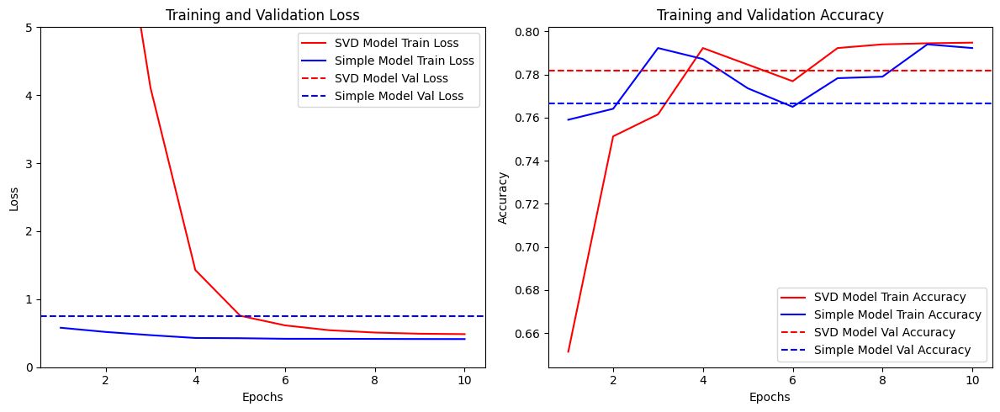

In [109]:
import matplotlib.pyplot as plt

# Data for SVD Model
svd_epochs = list(range(1, 11))
svd_train_loss = [33.7046, 8.2331, 4.1114, 1.4288, 0.7565, 0.6147, 0.5429, 0.5097, 0.4923, 0.4865]
svd_train_accuracy = [0.6513, 0.7513, 0.7615, 0.7923, 0.7846, 0.7769, 0.7923, 0.7940, 0.7945, 0.7948]
svd_val_loss = 213.0140
svd_val_accuracy = 0.7818

# Data for Simple Model
simple_epochs = list(range(1, 11))
simple_train_loss = [0.5803, 0.5186, 0.4715, 0.4297, 0.4265, 0.4180, 0.4176, 0.4160, 0.4145, 0.4137]
simple_train_accuracy = [0.7590, 0.7641, 0.7923, 0.7872, 0.7736, 0.7650, 0.7783, 0.7790, 0.7940, 0.7923]
simple_val_loss = 0.7469
simple_val_accuracy = 0.7664

# Plotting
plt.figure(figsize=(12, 5))

# Plot Loss Curves
# plt.subplot(1, 2, 1)
# plt.plot(svd_epochs, svd_train_loss, 'r-', label='SVD Model Train Loss')
# plt.plot(simple_epochs, simple_train_loss, 'b-', label='Simple Model Train Loss')
# plt.axhline(y=svd_val_loss, color='r', linestyle='--', label='SVD Model Val Loss')
# plt.axhline(y=simple_val_loss, color='b', linestyle='--', label='Simple Model Val Loss')
# plt.xlabel('Epochs')
# plt.ylabel('Loss')
# plt.title('Training and Validation Loss')
# plt.legend()
# Plot Loss Curves
plt.subplot(1, 2, 1)
plt.plot(svd_epochs, svd_train_loss, 'r-', label='SVD Model Train Loss')
plt.plot(simple_epochs, simple_train_loss, 'b-', label='Simple Model Train Loss')
plt.axhline(y=svd_val_loss, color='r', linestyle='--', label='SVD Model Val Loss')
plt.axhline(y=simple_val_loss, color='b', linestyle='--', label='Simple Model Val Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.ylim([0, 5])  # Zoom in on the loss curve
plt.title('Training and Validation Loss')
plt.legend()


# Plot Accuracy Curves
plt.subplot(1, 2, 2)
plt.plot(svd_epochs, svd_train_accuracy, 'r-', label='SVD Model Train Accuracy')
plt.plot(simple_epochs, simple_train_accuracy, 'b-', label='Simple Model Train Accuracy')
plt.axhline(y=svd_val_accuracy, color='r', linestyle='--', label='SVD Model Val Accuracy')
plt.axhline(y=simple_val_accuracy, color='b', linestyle='--', label='Simple Model Val Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


In [104]:
for i, (lidar_data, camera_image, (bbox_targets, class_targets)) in enumerate(train_dataloader):
    print(f"Batch {i+1}")
    print("LiDAR Data Shape:", lidar_data.shape)
    print("Camera Image Shape:", camera_image.shape)
    print("Bounding Box Targets Shape:", bbox_targets.shape)
    # print("Bounding Box Targets:", bbox_targets)
    print("Class Targets Shape:", class_targets.shape)
    print("Class Targets:", class_targets)
    
    # Print only the first batch for inspection
    if i == 0:
        break

Batch 1
LiDAR Data Shape: torch.Size([4, 1, 50000, 4])
Camera Image Shape: torch.Size([4, 3, 224, 224])
Bounding Box Targets Shape: torch.Size([4, 10, 4])
Class Targets Shape: torch.Size([4, 10])
Class Targets: tensor([[1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [1, 1, 1, 0, 0, 0, 0, 0, 0, 0],
        [1, 0, 1, 1, 1, 1, 1, 0, 0, 0],
        [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


C:\Users\Hammad\AppData\Local\Temp\ipykernel_1640\4170120972.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return lidar, torch.tensor(image, dtype=torch.float32), (bbox_targets, class_targets)
